In [1]:
import time
import torch
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import deepwave
from deepwave import scalar
import numpy as np
import scipy.io
import scipy.ndimage
import torch.nn.functional as F
from networks_rtm import Autoencoder
from mpl_toolkits.axes_grid1 import make_axes_locatable

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

/home/chao/miniconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
def data_conv(d_obs, d_pred, x_s):
    ns, nr, nt = d_obs.shape
    d_obs = d_obs.permute(1,0,2)#nr,ns,nt
    d_pred = d_pred.permute(1,0,2)#nr,ns,nt
    d_obs_conv = torch.zeros(nr, ns, nt*2-1, device=device)
    d_pred_conv = torch.zeros(nr, ns, nt*2-1, device=device)
    for isou in range(ns):
        isou_location = x_s[isou, 0, 0]
        d_obs_conv[:,isou:isou+1,:] = F.conv1d(d_obs[:,isou:isou+1,:], d_pred[isou_location:isou_location+1,isou:isou+1,:].flip([2]), padding=nt-1 )
        d_pred_conv[:,isou:isou+1,:] = F.conv1d(d_pred[:,isou:isou+1,:], d_obs[isou_location:isou_location+1,isou:isou+1,:].flip([2]), padding=nt-1 )

    return d_obs_conv.permute(1,0,2), d_pred_conv.permute(1,0,2)

In [3]:
depth = 135
mar_vp = scipy.io.loadmat('mar_vp.mat')
vp = mar_vp['vp'] 
vp_true = torch.Tensor(vp[:depth,:]).to(device) 

mar_vp0 = scipy.io.loadmat('mar_vp0.mat')
vp0 = mar_vp0['vp0'] 
vp_init = torch.Tensor(vp0[:depth,:]).to(device) 

nz, nx = vp_true.shape[0], vp_true.shape[1]
dx = 20.0

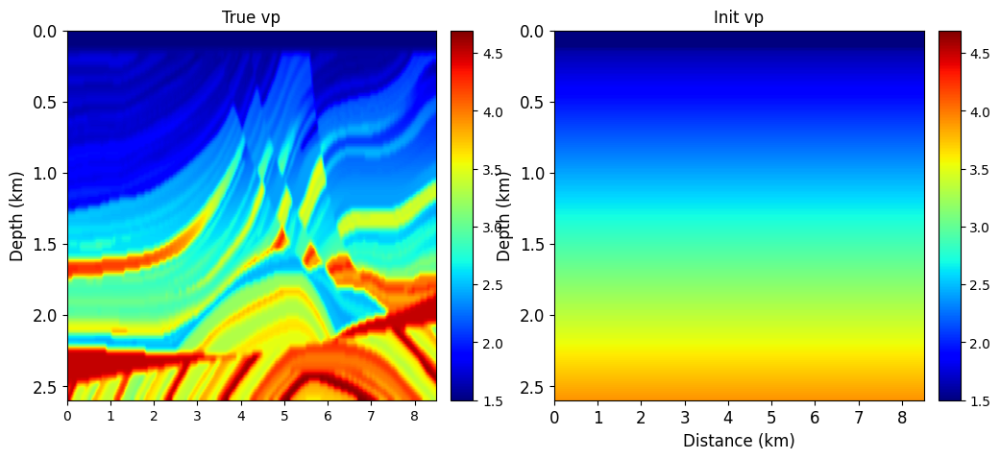

In [4]:
vp_true1 = vp_true/1000
vpmin = vp_true1.min()
vpmax = vp_true1.max()

# Plot
plt.style.use('default')
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
ax = plt.gca()
im  = ax.imshow(vp_true.cpu()/1000, aspect='auto', cmap='jet', extent=[0,(nx-1)*dx/1000,(nz-1)*dx/1000,0],
                vmin=vpmin, vmax=vpmax)
plt.ylabel("Depth (km)",fontsize=12)
plt.yticks(fontsize=12)
plt.title("True vp",fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)


plt.subplot(1,2,2)
ax = plt.gca()
im  = ax.imshow(vp_init.cpu()/1000, aspect='auto', cmap='jet', extent=[0,(nx-1)*dx/1000,(nz-1)*dx/1000,0],
                vmin=vpmin, vmax=vpmax)
plt.title("Init vp",fontsize=12)
plt.xlabel("Distance (km)",fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("Depth (km)",fontsize=12)
plt.yticks(fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)


In [5]:
train_vel = []
for i in range(1, 41):

#     vel = np.load('./Model/model4/model_%d.npy'%(i))
    vel = np.load('./Model2/model%d.npy'%(i))
    vels = gaussian_filter(vel, sigma=2)
    train_vel.append(vels)
train_vel = torch.Tensor(np.array(train_vel)).to(device)

# train_vel = torch.randn(40,70,70).to(device)
print(train_vel.shape)

torch.Size([40, 70, 70])


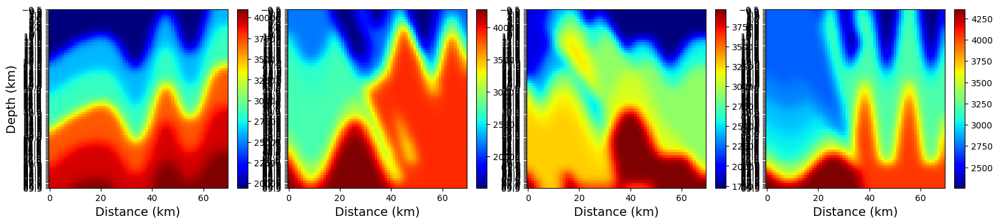

In [6]:
plt.style.use('default')

plt.figure(figsize=(19,4))

plt.subplot(1,4,1)
ax = plt.gca()
im = ax.imshow(train_vel[10,:,:].cpu(),  aspect=1, cmap="jet")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=10)

plt.ylabel('Depth (km)', fontsize=14)
plt.yticks(fontsize=10)
ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)
plt.subplot(1,4,2)
ax = plt.gca()
im = ax.imshow(train_vel[20,:,:].cpu(),  aspect=1, cmap="jet")

plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=10)

ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)

cbar = plt.colorbar(im, cax=cax)
plt.subplot(1,4,3)
ax = plt.gca()
im = ax.imshow(train_vel[30,:,:].cpu(),  aspect=1, cmap="jet")


plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=10)

ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)

cbar = plt.colorbar(im, cax=cax)
plt.subplot(1,4,4)
ax = plt.gca()
im = ax.imshow(train_vel[35,:,:].cpu(), aspect=1, cmap="jet")


plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=10)

ax.yaxis.set_major_locator(plt.MultipleLocator(0.5))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)

cbar = plt.colorbar(im, cax=cax)

In [7]:
n_shots = 40

n_sources_per_shot = 1
d_source = 10
first_source = 5
source_depth = 2

n_receivers_per_shot = nx-1
d_receiver = 1
first_receiver = 0
receiver_depth = 2

freq = 6
nt = 1000
dt = 0.004
peak_time = 1.5 / freq

source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long, device=device)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)

# receiver_locations
receiver_locations = torch.zeros(n_shots, n_receivers_per_shot, 2,
                                 dtype=torch.long, device=device)
receiver_locations[..., 1] = receiver_depth
receiver_locations[:, :, 0] = (
    (torch.arange(n_receivers_per_shot) * d_receiver +
     first_receiver)
    .repeat(n_shots, 1)
)


src_bp = scipy.io.loadmat('src_bp.mat')
src_bp = src_bp['src_bp']
wavelet = torch.tensor(src_bp,requires_grad=False) 
source_amplitudes = (wavelet.reshape(1, 1, nt).repeat(n_shots, n_sources_per_shot, 1)).to(device)
source_amplitudes_true = (wavelet.reshape(1, 1, nt))

src_bp1 = scipy.io.loadmat('src_bp1.mat')
src_bp1 = src_bp1['src_bp1']
wavelet1 = torch.tensor(src_bp1,requires_grad=False) 

source_amplitudes1 = (wavelet1.reshape(1, 1, nt).repeat(n_shots, n_sources_per_shot, 1)).to(device)
source_amplitudes_wrong = (wavelet1.reshape(1, 1, nt))

source_locations = torch.zeros(n_shots, n_sources_per_shot, 2,
                               dtype=torch.long, device=device)
source_locations[..., 1] = source_depth
source_locations[:, 0, 0] = (torch.arange(n_shots) * d_source +
                             first_source)

observed_data = scalar(vp_true.T, dx, dt, source_amplitudes=source_amplitudes,
             source_locations=source_locations,
             receiver_locations=receiver_locations,
             accuracy=8,
             pml_freq=freq)

print(source_locations.shape)
print(receiver_locations.shape)
data_obs = observed_data[-1]

torch.Size([40, 1, 2])
torch.Size([40, 425, 2])


In [8]:
def add_gaussian_noise(data, std_noise, mean_bias_factor=0.1, seed=1234):


    if seed is not None:
        np.random.seed(seed)


    data_np = data.numpy()
    
    trace_means = np.mean(data_np, axis=2, keepdims=True)  # Shape: [shot, 1, trace]


    mean_noises = trace_means * mean_bias_factor  # Shape: [shot, 1, trace]
    
    noise_np = np.random.normal(loc=mean_noises, scale=std_noise, size=data_np.shape)
    
    noisy_data_np = data_np + noise_np
    noisy_data = torch.tensor(noisy_data_np, dtype=data.dtype)


    return noisy_data

data_obs = add_gaussian_noise(data_obs.cpu(),
                                              std_noise=torch.std(data_obs.cpu()) * 0.5,
                                              mean_bias_factor=0
                                             )

In [9]:
criteria = torch.nn.L1Loss(reduction='sum')
N_BLOCKS_ENCODER = 6#5
N_BLOCKS_DECODER = 6#4
BATCH_SIZE = 1

MINI_BATCHES = 4
model_shape = [nz, nx]
VP_MIN = 1500.0
VP_MAX = 4500.0 
FINAL_OUT_CHANNEL = 1  # 1 for fix cc and sw

DECODER_INITIAL_SHAPE = torch.div(torch.tensor(model_shape), (2 ** (N_BLOCKS_DECODER - 1)), rounding_mode='floor')
FINAL_SIZE_ENCODER = BATCH_SIZE * DECODER_INITIAL_SHAPE[0] * DECODER_INITIAL_SHAPE[1]

autoencoder = Autoencoder(
        batch_size=BATCH_SIZE, 
        in_channels=40,
        n_blocks_encoder=N_BLOCKS_ENCODER, 
        n_blocks_decoder=N_BLOCKS_DECODER,
        final_size_encoder=FINAL_SIZE_ENCODER, 
        initial_shape_decoder=DECODER_INITIAL_SHAPE,
        nz=70, 
        nx=70,
        final_spatial_shape=model_shape,
        m_min=VP_MIN, m_max=VP_MAX,
        final_out_channels=FINAL_OUT_CHANNEL
        )

autoencoder = autoencoder.to(device=device)


Encoder: 0 40 80
Encoder: 1 80 160
Encoder: 2 160 320
Encoder: 3 320 640
Encoder: 4 640 1280
Encoder: 5 1280 2560
Decoder: 0 1 2
Decoder: 1 2 4
Decoder: 2 4 8
Decoder: 3 8 16
Decoder: 4 16 32
Decoder: 5 32 64


-2.8523470020294193 2.8223466205596885


(array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. ]),
 [Text(0, 0.0, '0.0'),
  Text(0, 0.5, '0.5'),
  Text(0, 1.0, '1.0'),
  Text(0, 1.5, '1.5'),
  Text(0, 2.0, '2.0'),
  Text(0, 2.5, '2.5'),
  Text(0, 3.0, '3.0'),
  Text(0, 3.5, '3.5'),
  Text(0, 4.0, '4.0')])

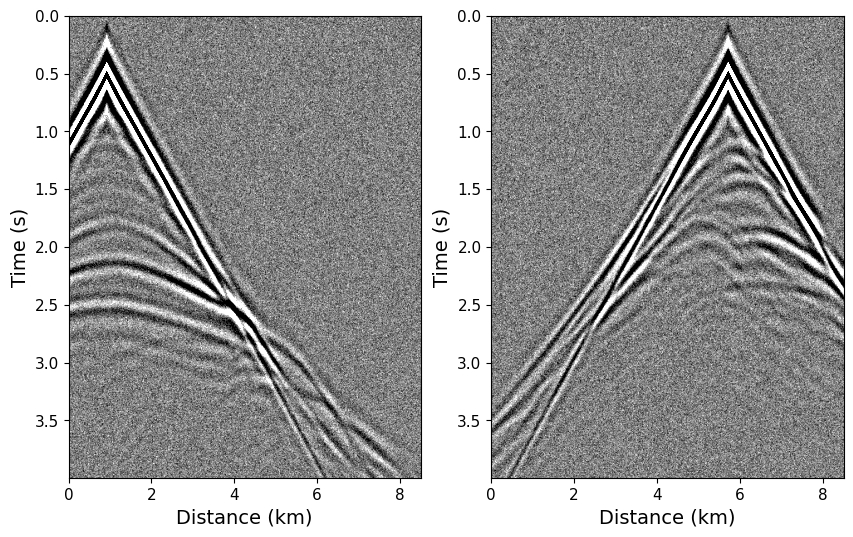

In [10]:
vmin, vmax = np.percentile(data_obs.cpu().numpy(), [4,96])
print(vmin,vmax)
## plot data
plt.style.use('default')
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
ax = plt.gca()
im = ax.imshow(data_obs[4,:].T.cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,2,2)
ax = plt.gca()
im = ax.imshow(data_obs[28,:].T.cpu().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
# plt.savefig("Overthrust_data_envelope.jpeg",dpi=400)

torch.Size([1, 1, 1000])


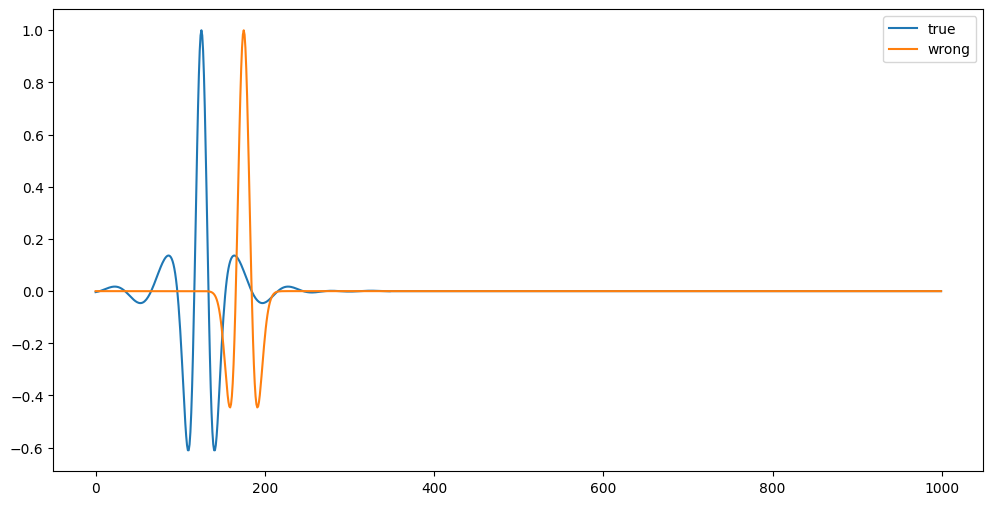

In [11]:
trace = source_amplitudes_true.cpu().numpy()
trace1 = source_amplitudes_wrong.cpu().numpy()
print(source_amplitudes_true.shape)
#trace_h = hilbert_transform(wavelet,1).cpu().numpy()
#trace_h2 = trace_h*trace_h
figsize = (12, 6)
plt.figure(figsize=figsize)
plt.plot(trace[0,0,:],label='true')
plt.plot(trace1[0,0,:],label='wrong')
plt.legend()
#plt.plot(trace_h2[0:1000,0,0])
plt.savefig('wavelet.jpeg', dpi=400)

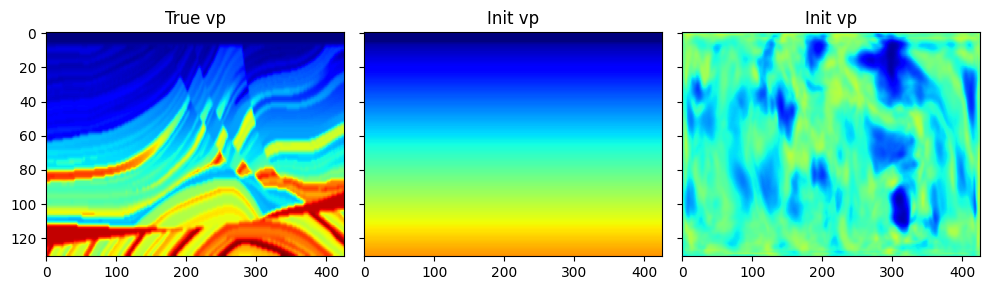

In [12]:
ns, nr, nt = data_obs.shape
earth_model = autoencoder(train_vel.view(1,40,70,70).repeat(BATCH_SIZE,1,1,1))
device = earth_model.device
vp = earth_model[:, 0, ...].squeeze()
scipy.io.savemat('vp_ini.mat',{'vp_ini':vp.cpu().detach().numpy()})


# Plot
vpmin = vp_true.min()
vpmax = vp_true.max()

_, ax = plt.subplots(1, 3, figsize=(10, 3), sharex=True,
                     sharey=True)
ax[0].imshow(vp_true.cpu(), aspect='auto', cmap='jet',
                vmin=vpmin, vmax=vpmax)
ax[0].set_title("True vp")

ax[1].imshow(vp_init.cpu(), aspect='auto', cmap='jet',
                vmin=vpmin, vmax=vpmax)
ax[1].set_title("Init vp")

ax[2].imshow(vp.detach().cpu(), aspect='auto', cmap='jet',
                vmin=vpmin, vmax=vpmax)
ax[2].set_title("Init vp")

plt.tight_layout()
# plt.savefig('over_elastic.jpg')

In [13]:
print(vp_true.min(),vp_true.max())
print(vp.min(),vp.max())

tensor(1499.9999, device='cuda:0') tensor(4694.8481, device='cuda:0')
tensor(1580.7419, device='cuda:0', grad_fn=<MinBackward1>) tensor(3410.5413, device='cuda:0', grad_fn=<MaxBackward1>)


In [14]:
amp = 1e0
LR_MILESTONE = 500
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, LR_MILESTONE, gamma=0.5)

Epoch: 0 Loss:  -6.486739754676819 model_loss:  435830.9
Epoch: 1 Loss:  -8.868169248104095 model_loss:  439594.5
Epoch: 2 Loss:  -8.99476820230484 model_loss:  322329.44
Epoch: 3 Loss:  -9.11538577079773 model_loss:  251314.75
Epoch: 4 Loss:  -9.132579863071442 model_loss:  220462.88
Epoch: 5 Loss:  -9.16178447008133 model_loss:  207593.84


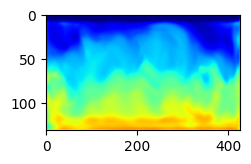

Epoch: 6 Loss:  -9.20626312494278 model_loss:  270412.38
Epoch: 7 Loss:  -9.202735722064972 model_loss:  202809.55
Epoch: 8 Loss:  -9.238319039344788 model_loss:  213536.14
Epoch: 9 Loss:  -9.24908298254013 model_loss:  210089.25
Epoch: 10 Loss:  -9.24043744802475 model_loss:  221373.42


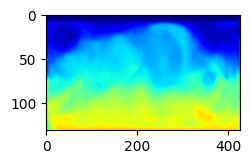

Epoch: 11 Loss:  -9.237625062465668 model_loss:  210224.16
Epoch: 12 Loss:  -9.233553290367126 model_loss:  212779.52
Epoch: 13 Loss:  -9.239196181297302 model_loss:  213730.19
Epoch: 14 Loss:  -9.240013539791107 model_loss:  204532.94
Epoch: 15 Loss:  -9.204172015190125 model_loss:  186397.17


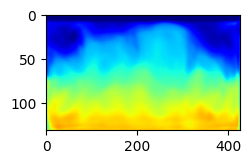

Epoch: 16 Loss:  -9.232208490371704 model_loss:  222806.84
Epoch: 17 Loss:  -9.232576549053192 model_loss:  203651.17
Epoch: 18 Loss:  -9.252109944820404 model_loss:  190167.47
Epoch: 19 Loss:  -9.235666811466217 model_loss:  209275.98
Epoch: 20 Loss:  -9.237026333808899 model_loss:  217904.5


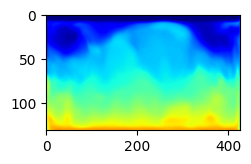

Epoch: 21 Loss:  -9.232742130756378 model_loss:  189446.2
Epoch: 22 Loss:  -9.226710736751556 model_loss:  184322.08
Epoch: 23 Loss:  -9.26489633321762 model_loss:  189383.05
Epoch: 24 Loss:  -9.264714419841766 model_loss:  210951.58
Epoch: 25 Loss:  -9.266588926315308 model_loss:  194196.45


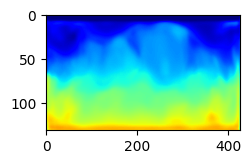

Epoch: 26 Loss:  -9.276202142238617 model_loss:  198244.38
Epoch: 27 Loss:  -9.282987296581268 model_loss:  198738.97
Epoch: 28 Loss:  -9.287621259689331 model_loss:  181717.28
Epoch: 29 Loss:  -9.250397264957428 model_loss:  234046.81
Epoch: 30 Loss:  -9.242624998092651 model_loss:  171175.42


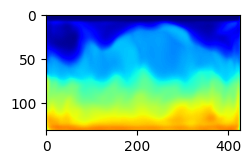

Epoch: 31 Loss:  -9.26039832830429 model_loss:  202560.19
Epoch: 32 Loss:  -9.26649022102356 model_loss:  192530.64
Epoch: 33 Loss:  -9.237575232982635 model_loss:  169174.67
Epoch: 34 Loss:  -9.291460752487183 model_loss:  190684.55
Epoch: 35 Loss:  -9.325469017028809 model_loss:  174459.47


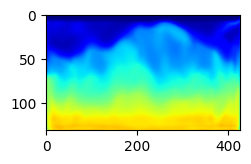

Epoch: 36 Loss:  -9.336265683174133 model_loss:  200183.86
Epoch: 37 Loss:  -9.357111632823944 model_loss:  169696.61
Epoch: 38 Loss:  -9.336451411247253 model_loss:  186456.33
Epoch: 39 Loss:  -9.339385688304901 model_loss:  181596.39
Epoch: 40 Loss:  -9.349407196044922 model_loss:  187638.55


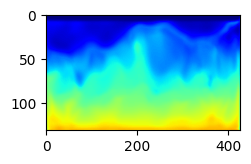

Epoch: 41 Loss:  -9.406324625015259 model_loss:  176779.9
Epoch: 42 Loss:  -9.43356168270111 model_loss:  178727.78
Epoch: 43 Loss:  -9.436468958854675 model_loss:  172782.03
Epoch: 44 Loss:  -9.44533383846283 model_loss:  179320.89
Epoch: 45 Loss:  -9.458058834075928 model_loss:  168819.69


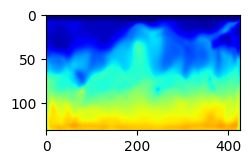

Epoch: 46 Loss:  -9.454644560813904 model_loss:  176597.72
Epoch: 47 Loss:  -9.449446499347687 model_loss:  172299.34
Epoch: 48 Loss:  -9.449812591075897 model_loss:  174003.66
Epoch: 49 Loss:  -9.43939459323883 model_loss:  175767.58
Epoch: 50 Loss:  -9.451459467411041 model_loss:  174317.61


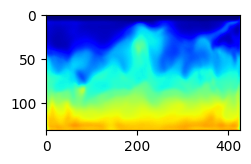

Epoch: 51 Loss:  -9.452260732650757 model_loss:  166916.02
Epoch: 52 Loss:  -9.45985597372055 model_loss:  172219.34
Epoch: 53 Loss:  -9.44259363412857 model_loss:  160125.69
Epoch: 54 Loss:  -9.441954433918 model_loss:  167258.55
Epoch: 55 Loss:  -9.468053042888641 model_loss:  162037.72


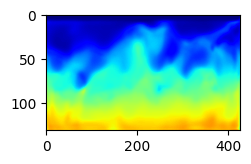

Epoch: 56 Loss:  -9.479078829288483 model_loss:  166254.94
Epoch: 57 Loss:  -9.475543916225433 model_loss:  165126.39
Epoch: 58 Loss:  -9.477990210056305 model_loss:  162443.22
Epoch: 59 Loss:  -9.477386593818665 model_loss:  161584.02
Epoch: 60 Loss:  -9.480910658836365 model_loss:  166576.77


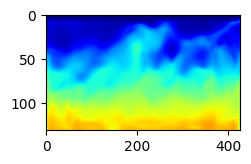

Epoch: 61 Loss:  -9.491125226020813 model_loss:  164352.14
Epoch: 62 Loss:  -9.486991584300995 model_loss:  166166.28
Epoch: 63 Loss:  -9.484892785549164 model_loss:  159535.7
Epoch: 64 Loss:  -9.483935177326202 model_loss:  162693.72
Epoch: 65 Loss:  -9.491817057132721 model_loss:  164757.62


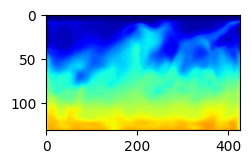

Epoch: 66 Loss:  -9.502943456172943 model_loss:  162426.94
Epoch: 67 Loss:  -9.516408324241638 model_loss:  159759.66
Epoch: 68 Loss:  -9.526805341243744 model_loss:  163420.8
Epoch: 69 Loss:  -9.522749066352844 model_loss:  161182.22
Epoch: 70 Loss:  -9.529972314834595 model_loss:  161014.28


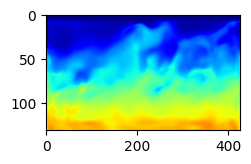

Epoch: 71 Loss:  -9.53337574005127 model_loss:  161576.42
Epoch: 72 Loss:  -9.53212559223175 model_loss:  162595.53
Epoch: 73 Loss:  -9.541659355163574 model_loss:  160971.12
Epoch: 74 Loss:  -9.550621151924133 model_loss:  160445.67
Epoch: 75 Loss:  -9.559837281703949 model_loss:  161599.06


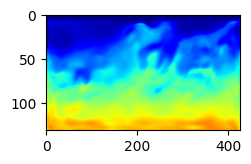

Epoch: 76 Loss:  -9.566221475601196 model_loss:  156791.75
Epoch: 77 Loss:  -9.572253108024597 model_loss:  159281.34
Epoch: 78 Loss:  -9.574381530284882 model_loss:  156633.03
Epoch: 79 Loss:  -9.578860104084015 model_loss:  158845.6
Epoch: 80 Loss:  -9.564459025859833 model_loss:  156621.58


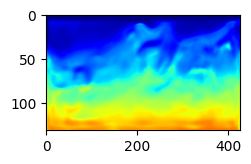

Epoch: 81 Loss:  -9.560597002506256 model_loss:  163784.52
Epoch: 82 Loss:  -9.560178935527802 model_loss:  155613.94
Epoch: 83 Loss:  -9.565343260765076 model_loss:  157405.77
Epoch: 84 Loss:  -9.549194872379303 model_loss:  158553.89
Epoch: 85 Loss:  -9.542597830295563 model_loss:  160680.62


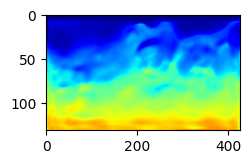

Epoch: 86 Loss:  -9.54412966966629 model_loss:  154377.81
Epoch: 87 Loss:  -9.562186896800995 model_loss:  158307.81
Epoch: 88 Loss:  -9.568611204624176 model_loss:  152683.06
Epoch: 89 Loss:  -9.569401919841766 model_loss:  148656.14
Epoch: 90 Loss:  -9.578654944896698 model_loss:  148044.61


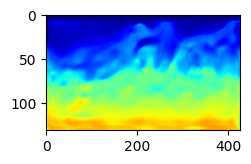

Epoch: 91 Loss:  -9.582254767417908 model_loss:  145553.16
Epoch: 92 Loss:  -9.597759366035461 model_loss:  144973.06
Epoch: 93 Loss:  -9.599760293960571 model_loss:  145468.81
Epoch: 94 Loss:  -9.598454177379608 model_loss:  144325.31
Epoch: 95 Loss:  -9.600167155265808 model_loss:  145484.17


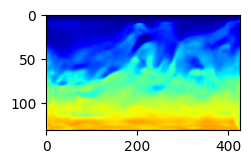

Epoch: 96 Loss:  -9.604327619075775 model_loss:  144862.03
Epoch: 97 Loss:  -9.601429104804993 model_loss:  139493.61
Epoch: 98 Loss:  -9.599722146987915 model_loss:  140200.22
Epoch: 99 Loss:  -9.630701184272766 model_loss:  138300.7
Epoch: 100 Loss:  -9.6756631731987 model_loss:  146959.48


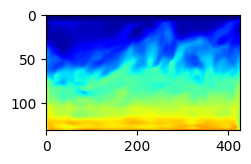

Epoch: 101 Loss:  -9.692506968975067 model_loss:  138844.36
Epoch: 102 Loss:  -9.696518063545227 model_loss:  137205.9
Epoch: 103 Loss:  -9.70051622390747 model_loss:  135584.38
Epoch: 104 Loss:  -9.706059396266937 model_loss:  131357.97
Epoch: 105 Loss:  -9.732361733913422 model_loss:  130354.62


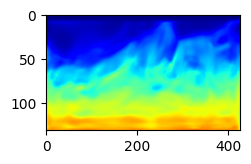

Epoch: 106 Loss:  -9.75119924545288 model_loss:  124125.15
Epoch: 107 Loss:  -9.756873905658722 model_loss:  124907.95
Epoch: 108 Loss:  -9.75619500875473 model_loss:  117588.25
Epoch: 109 Loss:  -9.77225410938263 model_loss:  120153.2
Epoch: 110 Loss:  -9.782142698764801 model_loss:  116629.92


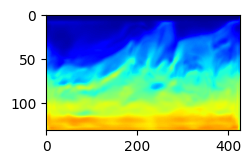

Epoch: 111 Loss:  -9.796281814575195 model_loss:  115970.47
Epoch: 112 Loss:  -9.799929141998291 model_loss:  113873.055
Epoch: 113 Loss:  -9.804246544837952 model_loss:  113883.33
Epoch: 114 Loss:  -9.807650208473206 model_loss:  111881.74
Epoch: 115 Loss:  -9.809311747550964 model_loss:  111129.32


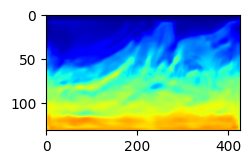

Epoch: 116 Loss:  -9.8117196559906 model_loss:  110049.65
Epoch: 117 Loss:  -9.812857925891876 model_loss:  109376.18
Epoch: 118 Loss:  -9.815089464187622 model_loss:  109193.4
Epoch: 119 Loss:  -9.817471146583557 model_loss:  108345.375
Epoch: 120 Loss:  -9.81955373287201 model_loss:  108696.94


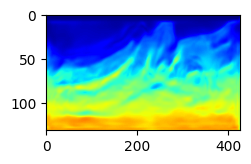

Epoch: 121 Loss:  -9.823678314685822 model_loss:  108305.04
Epoch: 122 Loss:  -9.82587742805481 model_loss:  107977.03
Epoch: 123 Loss:  -9.828840017318726 model_loss:  107612.875
Epoch: 124 Loss:  -9.830245018005371 model_loss:  107201.5
Epoch: 125 Loss:  -9.832292079925537 model_loss:  107051.51


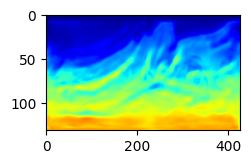

Epoch: 126 Loss:  -9.833769083023071 model_loss:  107451.44
Epoch: 127 Loss:  -9.835180342197418 model_loss:  107108.6
Epoch: 128 Loss:  -9.836586713790894 model_loss:  106987.77
Epoch: 129 Loss:  -9.837832510471344 model_loss:  106750.64
Epoch: 130 Loss:  -9.839604496955872 model_loss:  106395.04


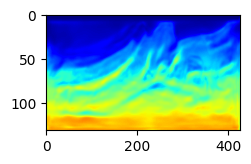

Epoch: 131 Loss:  -9.840642392635345 model_loss:  105785.61
Epoch: 132 Loss:  -9.841003894805908 model_loss:  105454.445
Epoch: 133 Loss:  -9.841739654541016 model_loss:  105151.76
Epoch: 134 Loss:  -9.842770159244537 model_loss:  104725.625
Epoch: 135 Loss:  -9.843671679496765 model_loss:  104398.84


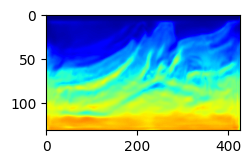

Epoch: 136 Loss:  -9.843138098716736 model_loss:  104238.95
Epoch: 137 Loss:  -9.84171986579895 model_loss:  104004.84
Epoch: 138 Loss:  -9.838100492954254 model_loss:  104288.98
Epoch: 139 Loss:  -9.840854704380035 model_loss:  104066.13
Epoch: 140 Loss:  -9.84086161851883 model_loss:  103821.32


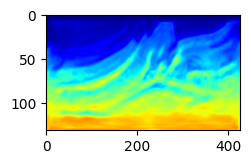

Epoch: 141 Loss:  -9.843848884105682 model_loss:  103164.06
Epoch: 142 Loss:  -9.844169437885284 model_loss:  102959.305
Epoch: 143 Loss:  -9.845713019371033 model_loss:  103560.46
Epoch: 144 Loss:  -9.847064912319183 model_loss:  103425.88
Epoch: 145 Loss:  -9.846061706542969 model_loss:  103362.734


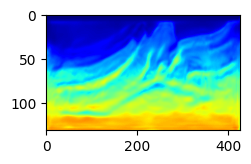

Epoch: 146 Loss:  -9.840366005897522 model_loss:  104102.055
Epoch: 147 Loss:  -9.839775681495667 model_loss:  103649.375
Epoch: 148 Loss:  -9.848116874694824 model_loss:  102906.516
Epoch: 149 Loss:  -9.85095763206482 model_loss:  103155.06
Epoch: 150 Loss:  -9.850867867469788 model_loss:  102570.18


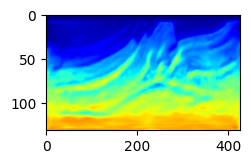

Epoch: 151 Loss:  -9.837309896945953 model_loss:  102575.125
Epoch: 152 Loss:  -9.840407967567444 model_loss:  102772.19
Epoch: 153 Loss:  -9.83770740032196 model_loss:  102950.75
Epoch: 154 Loss:  -9.843548655509949 model_loss:  102713.06
Epoch: 155 Loss:  -9.843149840831757 model_loss:  102864.5


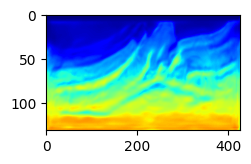

Epoch: 156 Loss:  -9.845412850379944 model_loss:  103705.11
Epoch: 157 Loss:  -9.8482825756073 model_loss:  103662.54
Epoch: 158 Loss:  -9.850821375846863 model_loss:  102383.87
Epoch: 159 Loss:  -9.852513372898102 model_loss:  101708.1
Epoch: 160 Loss:  -9.852953016757965 model_loss:  101381.98


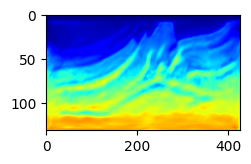

Epoch: 161 Loss:  -9.852641940116882 model_loss:  101452.32
Epoch: 162 Loss:  -9.85005247592926 model_loss:  101819.32
Epoch: 163 Loss:  -9.844410002231598 model_loss:  102297.56
Epoch: 164 Loss:  -9.842467725276947 model_loss:  101933.875
Epoch: 165 Loss:  -9.84566992521286 model_loss:  101676.87


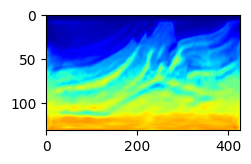

Epoch: 166 Loss:  -9.848927676677704 model_loss:  101606.94
Epoch: 167 Loss:  -9.851437509059906 model_loss:  100935.414
Epoch: 168 Loss:  -9.850962340831757 model_loss:  101096.055
Epoch: 169 Loss:  -9.850332200527191 model_loss:  101600.18
Epoch: 170 Loss:  -9.850871920585632 model_loss:  101205.32


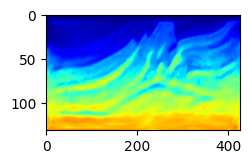

Epoch: 171 Loss:  -9.85155463218689 model_loss:  100495.88
Epoch: 172 Loss:  -9.850194275379181 model_loss:  100281.695
Epoch: 173 Loss:  -9.85085278749466 model_loss:  99939.34
Epoch: 174 Loss:  -9.84939980506897 model_loss:  99909.97
Epoch: 175 Loss:  -9.848210752010345 model_loss:  100824.234


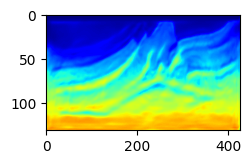

Epoch: 176 Loss:  -9.84779006242752 model_loss:  100606.65
Epoch: 177 Loss:  -9.844536244869232 model_loss:  100281.17
Epoch: 178 Loss:  -9.842917919158936 model_loss:  101129.14
Epoch: 179 Loss:  -9.84706175327301 model_loss:  102515.16
Epoch: 180 Loss:  -9.844938337802887 model_loss:  102058.86


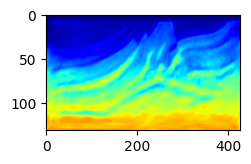

Epoch: 181 Loss:  -9.839079022407532 model_loss:  103950.195
Epoch: 182 Loss:  -9.842788577079773 model_loss:  104693.18
Epoch: 183 Loss:  -9.842467486858368 model_loss:  105776.0
Epoch: 184 Loss:  -9.84584367275238 model_loss:  103586.85
Epoch: 185 Loss:  -9.849992871284485 model_loss:  102426.555


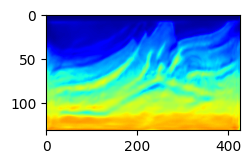

Epoch: 186 Loss:  -9.852123320102692 model_loss:  101484.086
Epoch: 187 Loss:  -9.853846609592438 model_loss:  101233.875
Epoch: 188 Loss:  -9.854526221752167 model_loss:  100610.586
Epoch: 189 Loss:  -9.856558978557587 model_loss:  100000.07
Epoch: 190 Loss:  -9.857407867908478 model_loss:  99878.29


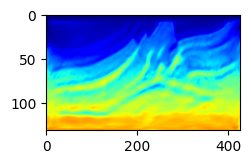

Epoch: 191 Loss:  -9.858515977859497 model_loss:  100015.266
Epoch: 192 Loss:  -9.858490824699402 model_loss:  99597.16
Epoch: 193 Loss:  -9.855831980705261 model_loss:  99633.71
Epoch: 194 Loss:  -9.851875722408295 model_loss:  99629.5
Epoch: 195 Loss:  -9.851598858833313 model_loss:  99734.29


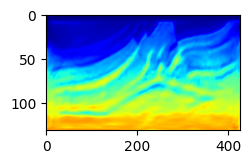

Epoch: 196 Loss:  -9.851677775382996 model_loss:  98686.83
Epoch: 197 Loss:  -9.851349115371704 model_loss:  98973.22
Epoch: 198 Loss:  -9.852785229682922 model_loss:  99715.016
Epoch: 199 Loss:  -9.854141891002655 model_loss:  99951.125
Epoch: 200 Loss:  -9.855208992958069 model_loss:  100449.55


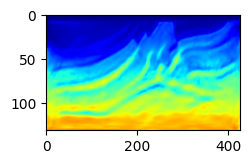

Epoch: 201 Loss:  -9.855254232883453 model_loss:  100898.734
Epoch: 202 Loss:  -9.854554533958435 model_loss:  101016.086
Epoch: 203 Loss:  -9.851508855819702 model_loss:  100788.984
Epoch: 204 Loss:  -9.845294654369354 model_loss:  101068.87
Epoch: 205 Loss:  -9.850304961204529 model_loss:  100683.49


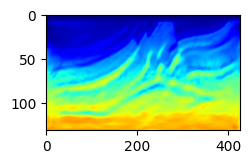

Epoch: 206 Loss:  -9.855510413646698 model_loss:  102204.555
Epoch: 207 Loss:  -9.857091784477234 model_loss:  101747.8
Epoch: 208 Loss:  -9.857373058795929 model_loss:  100526.61
Epoch: 209 Loss:  -9.85603642463684 model_loss:  100803.72
Epoch: 210 Loss:  -9.856054067611694 model_loss:  99985.84


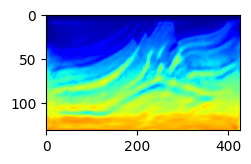

Epoch: 211 Loss:  -9.857034385204315 model_loss:  99962.54
Epoch: 212 Loss:  -9.858107686042786 model_loss:  100019.54
Epoch: 213 Loss:  -9.858357608318329 model_loss:  100126.664
Epoch: 214 Loss:  -9.857614696025848 model_loss:  99481.4
Epoch: 215 Loss:  -9.856864929199219 model_loss:  99134.5


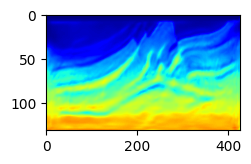

Epoch: 216 Loss:  -9.857781946659088 model_loss:  99057.836
Epoch: 217 Loss:  -9.858376383781433 model_loss:  99442.91
Epoch: 218 Loss:  -9.857235312461853 model_loss:  100013.79
Epoch: 219 Loss:  -9.85930734872818 model_loss:  99314.12
Epoch: 220 Loss:  -9.860297620296478 model_loss:  99236.44


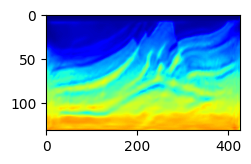

Epoch: 221 Loss:  -9.858287394046783 model_loss:  99630.6
Epoch: 222 Loss:  -9.858622431755066 model_loss:  100002.46
Epoch: 223 Loss:  -9.853843450546265 model_loss:  99251.695
Epoch: 224 Loss:  -9.854048192501068 model_loss:  98935.85
Epoch: 225 Loss:  -9.852552711963654 model_loss:  98642.74


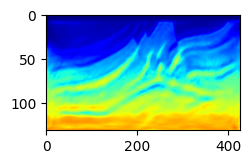

Epoch: 226 Loss:  -9.854627907276154 model_loss:  98657.016
Epoch: 227 Loss:  -9.854498147964478 model_loss:  99070.055
Epoch: 228 Loss:  -9.854843556880951 model_loss:  98671.47
Epoch: 229 Loss:  -9.855624973773956 model_loss:  97955.28
Epoch: 230 Loss:  -9.856521248817444 model_loss:  98339.234


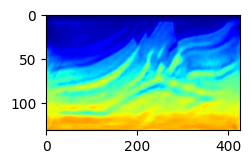

Epoch: 231 Loss:  -9.858040273189545 model_loss:  98663.805
Epoch: 232 Loss:  -9.858027160167694 model_loss:  99628.68
Epoch: 233 Loss:  -9.85603153705597 model_loss:  99927.93
Epoch: 234 Loss:  -9.85619980096817 model_loss:  100280.8
Epoch: 235 Loss:  -9.855716407299042 model_loss:  100441.63


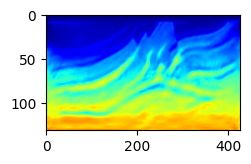

Epoch: 236 Loss:  -9.855630278587341 model_loss:  100538.06
Epoch: 237 Loss:  -9.855093598365784 model_loss:  100726.15
Epoch: 238 Loss:  -9.856615424156189 model_loss:  99979.766
Epoch: 239 Loss:  -9.856389582157135 model_loss:  100222.016
Epoch: 240 Loss:  -9.856730878353119 model_loss:  99686.37


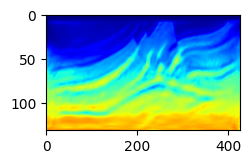

Epoch: 241 Loss:  -9.856822967529297 model_loss:  99464.305
Epoch: 242 Loss:  -9.857288122177124 model_loss:  99633.875
Epoch: 243 Loss:  -9.858026444911957 model_loss:  99114.06
Epoch: 244 Loss:  -9.854750990867615 model_loss:  99766.71
Epoch: 245 Loss:  -9.858518540859222 model_loss:  99529.33


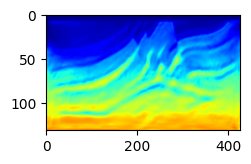

Epoch: 246 Loss:  -9.85157597064972 model_loss:  100373.734
Epoch: 247 Loss:  -9.856499969959259 model_loss:  99747.56
Epoch: 248 Loss:  -9.846864819526672 model_loss:  100347.055
Epoch: 249 Loss:  -9.845663487911224 model_loss:  100825.49
Epoch: 250 Loss:  -9.844507575035095 model_loss:  101336.27


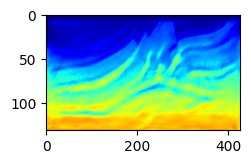

Epoch: 251 Loss:  -9.850038588047028 model_loss:  101840.914
Epoch: 252 Loss:  -9.853384613990784 model_loss:  101474.4
Epoch: 253 Loss:  -9.849680840969086 model_loss:  103399.945
Epoch: 254 Loss:  -9.85049057006836 model_loss:  101350.74
Epoch: 255 Loss:  -9.84818571805954 model_loss:  102239.67


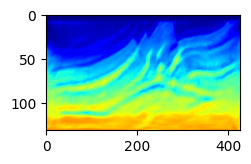

Epoch: 256 Loss:  -9.856862962245941 model_loss:  100095.47
Epoch: 257 Loss:  -9.858328342437744 model_loss:  99509.52
Epoch: 258 Loss:  -9.859601855278015 model_loss:  98684.125
Epoch: 259 Loss:  -9.860636472702026 model_loss:  99755.35
Epoch: 260 Loss:  -9.862286031246185 model_loss:  99439.61


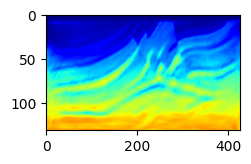

Epoch: 261 Loss:  -9.862667083740234 model_loss:  98984.766
Epoch: 262 Loss:  -9.86198478937149 model_loss:  99582.27
Epoch: 263 Loss:  -9.86138653755188 model_loss:  100253.5
Epoch: 264 Loss:  -9.861470222473145 model_loss:  99715.414
Epoch: 265 Loss:  -9.860268294811249 model_loss:  98547.21


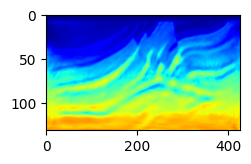

Epoch: 266 Loss:  -9.860197901725769 model_loss:  98735.26
Epoch: 267 Loss:  -9.858950138092041 model_loss:  98746.74
Epoch: 268 Loss:  -9.857859075069427 model_loss:  98667.734
Epoch: 269 Loss:  -9.858287155628204 model_loss:  98646.016
Epoch: 270 Loss:  -9.85804134607315 model_loss:  98210.586


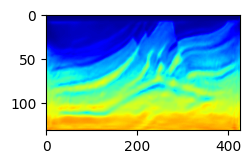

Epoch: 271 Loss:  -9.858373403549194 model_loss:  98128.945
Epoch: 272 Loss:  -9.856867611408234 model_loss:  98559.96
Epoch: 273 Loss:  -9.853591918945312 model_loss:  99411.98
Epoch: 274 Loss:  -9.852639198303223 model_loss:  98582.51
Epoch: 275 Loss:  -9.855042397975922 model_loss:  99166.71


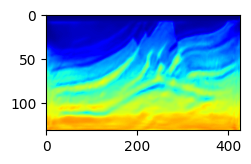

Epoch: 276 Loss:  -9.852466821670532 model_loss:  99603.836
Epoch: 277 Loss:  -9.851399421691895 model_loss:  100256.67
Epoch: 278 Loss:  -9.844533145427704 model_loss:  101014.87
Epoch: 279 Loss:  -9.846773982048035 model_loss:  101329.586
Epoch: 280 Loss:  -9.85212105512619 model_loss:  100673.92


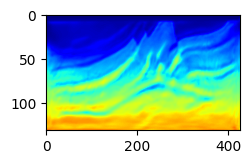

Epoch: 281 Loss:  -9.853081345558167 model_loss:  100885.59
Epoch: 282 Loss:  -9.84949404001236 model_loss:  99961.7
Epoch: 283 Loss:  -9.855275630950928 model_loss:  101105.74
Epoch: 284 Loss:  -9.858816146850586 model_loss:  100158.03
Epoch: 285 Loss:  -9.859568417072296 model_loss:  98508.625


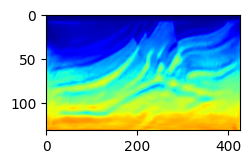

Epoch: 286 Loss:  -9.86180168390274 model_loss:  98237.555
Epoch: 287 Loss:  -9.86272406578064 model_loss:  99111.83
Epoch: 288 Loss:  -9.862795531749725 model_loss:  99478.086
Epoch: 289 Loss:  -9.862503170967102 model_loss:  98927.4
Epoch: 290 Loss:  -9.861540675163269 model_loss:  98615.37


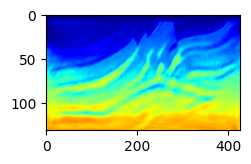

Epoch: 291 Loss:  -9.860496878623962 model_loss:  98489.29
Epoch: 292 Loss:  -9.859504461288452 model_loss:  98073.055
Epoch: 293 Loss:  -9.859410226345062 model_loss:  97730.53
Epoch: 294 Loss:  -9.858782649040222 model_loss:  97548.164
Epoch: 295 Loss:  -9.857350826263428 model_loss:  97687.67


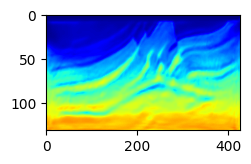

Epoch: 296 Loss:  -9.857398211956024 model_loss:  97710.95
Epoch: 297 Loss:  -9.857952356338501 model_loss:  97902.08
Epoch: 298 Loss:  -9.855353593826294 model_loss:  98477.695
Epoch: 299 Loss:  -9.85084217786789 model_loss:  99129.73
Epoch: 300 Loss:  -9.846536219120026 model_loss:  100140.766


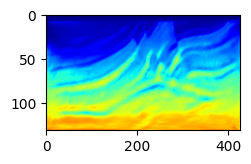

Epoch: 301 Loss:  -9.851675808429718 model_loss:  101334.4
Epoch: 302 Loss:  -9.853939533233643 model_loss:  100343.97
Epoch: 303 Loss:  -9.85880696773529 model_loss:  99423.0
Epoch: 304 Loss:  -9.858911335468292 model_loss:  98826.84
Epoch: 305 Loss:  -9.859289526939392 model_loss:  99473.28


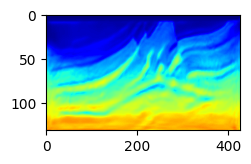

Epoch: 306 Loss:  -9.85940819978714 model_loss:  99567.78
Epoch: 307 Loss:  -9.862251937389374 model_loss:  98574.74
Epoch: 308 Loss:  -9.863521575927734 model_loss:  98906.42
Epoch: 309 Loss:  -9.863709628582 model_loss:  99570.62
Epoch: 310 Loss:  -9.863577783107758 model_loss:  98560.97


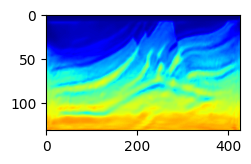

Epoch: 311 Loss:  -9.86267340183258 model_loss:  97901.18
Epoch: 312 Loss:  -9.86148589849472 model_loss:  97823.45
Epoch: 313 Loss:  -9.860077738761902 model_loss:  98036.99
Epoch: 314 Loss:  -9.860477268695831 model_loss:  98095.89
Epoch: 315 Loss:  -9.859825611114502 model_loss:  98244.48


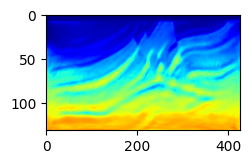

Epoch: 316 Loss:  -9.859664261341095 model_loss:  98032.73
Epoch: 317 Loss:  -9.85814881324768 model_loss:  97568.93
Epoch: 318 Loss:  -9.860407590866089 model_loss:  97845.89
Epoch: 319 Loss:  -9.860833764076233 model_loss:  98388.336
Epoch: 320 Loss:  -9.859984636306763 model_loss:  98144.98


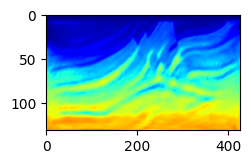

Epoch: 321 Loss:  -9.855808973312378 model_loss:  98199.445
Epoch: 322 Loss:  -9.851267695426941 model_loss:  98672.734
Epoch: 323 Loss:  -9.852085888385773 model_loss:  99490.71
Epoch: 324 Loss:  -9.850514888763428 model_loss:  99883.08
Epoch: 325 Loss:  -9.85535216331482 model_loss:  100747.32


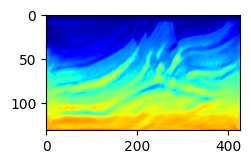

Epoch: 326 Loss:  -9.859488546848297 model_loss:  99775.7
Epoch: 327 Loss:  -9.859270095825195 model_loss:  99264.34
Epoch: 328 Loss:  -9.855555474758148 model_loss:  99277.78
Epoch: 329 Loss:  -9.85799264907837 model_loss:  98247.17
Epoch: 330 Loss:  -9.86147141456604 model_loss:  98331.586


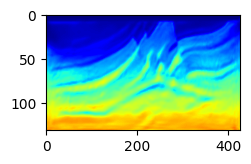

Epoch: 331 Loss:  -9.863248884677887 model_loss:  98131.0
Epoch: 332 Loss:  -9.863843858242035 model_loss:  98631.87
Epoch: 333 Loss:  -9.862578749656677 model_loss:  98858.89
Epoch: 334 Loss:  -9.863800823688507 model_loss:  98222.91
Epoch: 335 Loss:  -9.864168763160706 model_loss:  97676.086


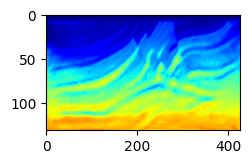

Epoch: 336 Loss:  -9.863691806793213 model_loss:  98144.28
Epoch: 337 Loss:  -9.862566947937012 model_loss:  98970.08
Epoch: 338 Loss:  -9.862574398517609 model_loss:  98910.266
Epoch: 339 Loss:  -9.86139065027237 model_loss:  98322.17
Epoch: 340 Loss:  -9.860059022903442 model_loss:  97538.984


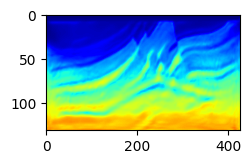

Epoch: 341 Loss:  -9.859453558921814 model_loss:  97152.5
Epoch: 342 Loss:  -9.860555231571198 model_loss:  97546.24
Epoch: 343 Loss:  -9.86104542016983 model_loss:  97876.57
Epoch: 344 Loss:  -9.861946403980255 model_loss:  97666.77
Epoch: 345 Loss:  -9.862357079982758 model_loss:  97773.625


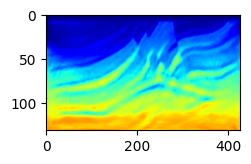

Epoch: 346 Loss:  -9.862303912639618 model_loss:  98258.76
Epoch: 347 Loss:  -9.860732197761536 model_loss:  97957.43
Epoch: 348 Loss:  -9.854713201522827 model_loss:  97961.27
Epoch: 349 Loss:  -9.853570640087128 model_loss:  98193.125
Epoch: 350 Loss:  -9.850572407245636 model_loss:  98106.18


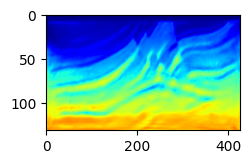

Epoch: 351 Loss:  -9.85012936592102 model_loss:  98983.984
Epoch: 352 Loss:  -9.85586941242218 model_loss:  100396.25
Epoch: 353 Loss:  -9.85858279466629 model_loss:  100346.95
Epoch: 354 Loss:  -9.859772503376007 model_loss:  99831.77
Epoch: 355 Loss:  -9.85876876115799 model_loss:  98053.35


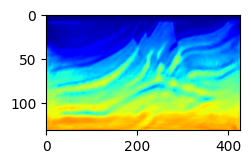

Epoch: 356 Loss:  -9.85846209526062 model_loss:  98079.0
Epoch: 357 Loss:  -9.860460102558136 model_loss:  97982.945
Epoch: 358 Loss:  -9.861733555793762 model_loss:  98275.17
Epoch: 359 Loss:  -9.861560881137848 model_loss:  98072.69
Epoch: 360 Loss:  -9.861693620681763 model_loss:  98239.76


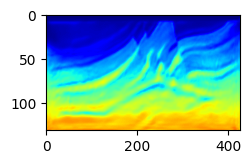

Epoch: 361 Loss:  -9.862811744213104 model_loss:  98453.98
Epoch: 362 Loss:  -9.864459812641144 model_loss:  97833.945
Epoch: 363 Loss:  -9.86451369524002 model_loss:  97694.914
Epoch: 364 Loss:  -9.863770246505737 model_loss:  98091.22
Epoch: 365 Loss:  -9.863813281059265 model_loss:  98475.945


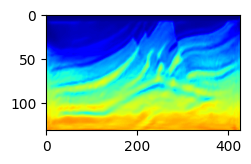

Epoch: 366 Loss:  -9.862480163574219 model_loss:  98182.24
Epoch: 367 Loss:  -9.86097937822342 model_loss:  97803.45
Epoch: 368 Loss:  -9.860020518302917 model_loss:  97517.72
Epoch: 369 Loss:  -9.860569536685944 model_loss:  97576.836
Epoch: 370 Loss:  -9.86249154806137 model_loss:  97439.01


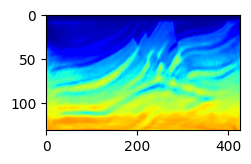

Epoch: 371 Loss:  -9.863503694534302 model_loss:  96830.74
Epoch: 372 Loss:  -9.863021314144135 model_loss:  97899.81
Epoch: 373 Loss:  -9.861132204532623 model_loss:  97681.06
Epoch: 374 Loss:  -9.856900572776794 model_loss:  97305.61
Epoch: 375 Loss:  -9.8591890335083 model_loss:  97854.234


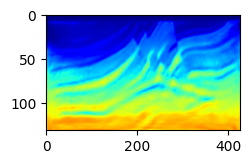

Epoch: 376 Loss:  -9.857597529888153 model_loss:  97812.4
Epoch: 377 Loss:  -9.860128462314606 model_loss:  98544.6
Epoch: 378 Loss:  -9.860703766345978 model_loss:  98571.83
Epoch: 379 Loss:  -9.861784636974335 model_loss:  97607.266
Epoch: 380 Loss:  -9.861695289611816 model_loss:  97770.09


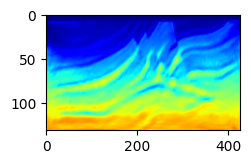

Epoch: 381 Loss:  -9.859666764736176 model_loss:  97709.56
Epoch: 382 Loss:  -9.85946798324585 model_loss:  98049.805
Epoch: 383 Loss:  -9.859029769897461 model_loss:  98269.02
Epoch: 384 Loss:  -9.860116183757782 model_loss:  98413.33
Epoch: 385 Loss:  -9.861872911453247 model_loss:  98623.414


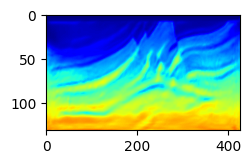

Epoch: 386 Loss:  -9.862811863422394 model_loss:  98699.03
Epoch: 387 Loss:  -9.863144397735596 model_loss:  98578.21
Epoch: 388 Loss:  -9.863799512386322 model_loss:  98027.836
Epoch: 389 Loss:  -9.863675773143768 model_loss:  97627.734
Epoch: 390 Loss:  -9.864238440990448 model_loss:  97569.086


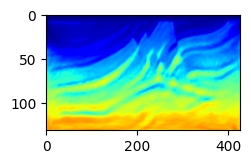

Epoch: 391 Loss:  -9.864599883556366 model_loss:  97506.52
Epoch: 392 Loss:  -9.864671647548676 model_loss:  97221.45
Epoch: 393 Loss:  -9.8636674284935 model_loss:  97379.75
Epoch: 394 Loss:  -9.864239513874054 model_loss:  97544.16
Epoch: 395 Loss:  -9.864230811595917 model_loss:  97983.74


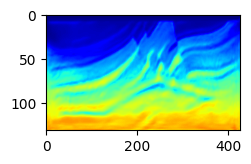

Epoch: 396 Loss:  -9.864298105239868 model_loss:  98550.55
Epoch: 397 Loss:  -9.864116489887238 model_loss:  98497.805
Epoch: 398 Loss:  -9.863151848316193 model_loss:  98282.08
Epoch: 399 Loss:  -9.861887514591217 model_loss:  97812.71
Epoch: 400 Loss:  -9.859738111495972 model_loss:  98616.586


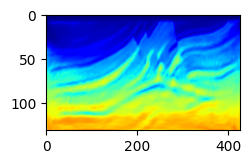

Epoch: 401 Loss:  -9.861558616161346 model_loss:  98202.85
Epoch: 402 Loss:  -9.853791892528534 model_loss:  99363.94
Epoch: 403 Loss:  -9.85335624217987 model_loss:  98291.445
Epoch: 404 Loss:  -9.841679453849792 model_loss:  99749.46
Epoch: 405 Loss:  -9.857435286045074 model_loss:  98585.14


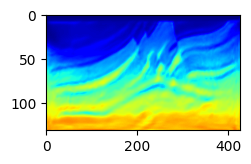

Epoch: 406 Loss:  -9.854175746440887 model_loss:  97993.45
Epoch: 407 Loss:  -9.861651420593262 model_loss:  96964.51
Epoch: 408 Loss:  -9.85800564289093 model_loss:  98991.13
Epoch: 409 Loss:  -9.859372794628143 model_loss:  97874.68
Epoch: 410 Loss:  -9.855859696865082 model_loss:  98422.5


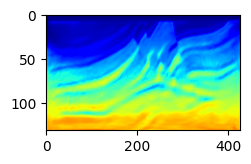

Epoch: 411 Loss:  -9.856845080852509 model_loss:  98095.164
Epoch: 412 Loss:  -9.859517872333527 model_loss:  99029.555
Epoch: 413 Loss:  -9.863387644290924 model_loss:  98984.9
Epoch: 414 Loss:  -9.86327338218689 model_loss:  98831.72
Epoch: 415 Loss:  -9.863094866275787 model_loss:  98128.5


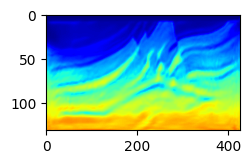

Epoch: 416 Loss:  -9.86219185590744 model_loss:  98007.95
Epoch: 417 Loss:  -9.86280757188797 model_loss:  97652.4
Epoch: 418 Loss:  -9.862685859203339 model_loss:  97890.484
Epoch: 419 Loss:  -9.862602055072784 model_loss:  98447.11
Epoch: 420 Loss:  -9.861774861812592 model_loss:  98959.45


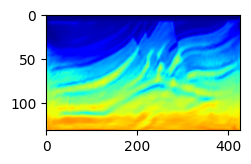

Epoch: 421 Loss:  -9.862889766693115 model_loss:  99493.016
Epoch: 422 Loss:  -9.862344086170197 model_loss:  99996.805
Epoch: 423 Loss:  -9.86201411485672 model_loss:  99856.22
Epoch: 424 Loss:  -9.859167575836182 model_loss:  99666.195
Epoch: 425 Loss:  -9.858718454837799 model_loss:  98979.53


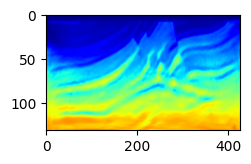

Epoch: 426 Loss:  -9.858598351478577 model_loss:  98742.625
Epoch: 427 Loss:  -9.862245440483093 model_loss:  99042.164
Epoch: 428 Loss:  -9.86366182565689 model_loss:  99402.05
Epoch: 429 Loss:  -9.863856971263885 model_loss:  99858.79
Epoch: 430 Loss:  -9.863024234771729 model_loss:  99450.08


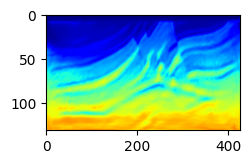

Epoch: 431 Loss:  -9.863571226596832 model_loss:  98840.38
Epoch: 432 Loss:  -9.861947059631348 model_loss:  99395.78
Epoch: 433 Loss:  -9.861191034317017 model_loss:  99349.42
Epoch: 434 Loss:  -9.85770171880722 model_loss:  99088.43
Epoch: 435 Loss:  -9.861452996730804 model_loss:  98560.83


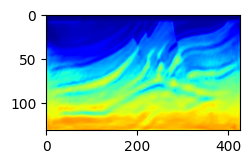

Epoch: 436 Loss:  -9.861499965190887 model_loss:  100062.67
Epoch: 437 Loss:  -9.856490671634674 model_loss:  100028.24
Epoch: 438 Loss:  -9.853615880012512 model_loss:  100158.68
Epoch: 439 Loss:  -9.860555469989777 model_loss:  98950.98
Epoch: 440 Loss:  -9.855065107345581 model_loss:  99574.695


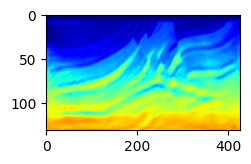

Epoch: 441 Loss:  -9.861103355884552 model_loss:  98438.48
Epoch: 442 Loss:  -9.859518706798553 model_loss:  100092.54
Epoch: 443 Loss:  -9.862567663192749 model_loss:  98540.52
Epoch: 444 Loss:  -9.860549688339233 model_loss:  99674.36
Epoch: 445 Loss:  -9.861537516117096 model_loss:  98607.87


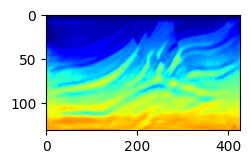

Epoch: 446 Loss:  -9.853008031845093 model_loss:  99717.23
Epoch: 447 Loss:  -9.853834629058838 model_loss:  98838.414
Epoch: 448 Loss:  -9.85154002904892 model_loss:  99938.77
Epoch: 449 Loss:  -9.856154143810272 model_loss:  100431.31
Epoch: 450 Loss:  -9.85263580083847 model_loss:  101309.39


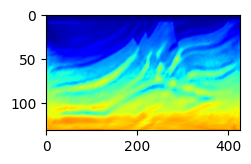

Epoch: 451 Loss:  -9.853364169597626 model_loss:  101258.78
Epoch: 452 Loss:  -9.854799747467041 model_loss:  100545.89
Epoch: 453 Loss:  -9.853718101978302 model_loss:  100163.586
Epoch: 454 Loss:  -9.855783939361572 model_loss:  100017.79
Epoch: 455 Loss:  -9.859789431095123 model_loss:  100153.95


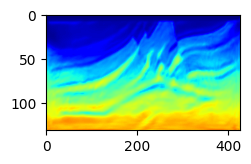

Epoch: 456 Loss:  -9.855594515800476 model_loss:  101525.8
Epoch: 457 Loss:  -9.858606100082397 model_loss:  102123.55
Epoch: 458 Loss:  -9.859248101711273 model_loss:  101586.92
Epoch: 459 Loss:  -9.860240876674652 model_loss:  100639.414
Epoch: 460 Loss:  -9.86187869310379 model_loss:  99548.52


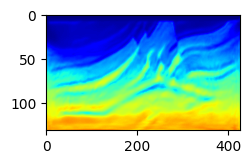

Epoch: 461 Loss:  -9.863250195980072 model_loss:  100236.99
Epoch: 462 Loss:  -9.863537847995758 model_loss:  101102.96
Epoch: 463 Loss:  -9.862434208393097 model_loss:  100867.78
Epoch: 464 Loss:  -9.860409796237946 model_loss:  100565.31
Epoch: 465 Loss:  -9.858451306819916 model_loss:  100200.72


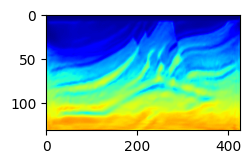

Epoch: 466 Loss:  -9.85926729440689 model_loss:  99841.77
Epoch: 467 Loss:  -9.86166250705719 model_loss:  99230.44
Epoch: 468 Loss:  -9.86319214105606 model_loss:  99942.4
Epoch: 469 Loss:  -9.86318850517273 model_loss:  100163.234
Epoch: 470 Loss:  -9.861276984214783 model_loss:  99695.64


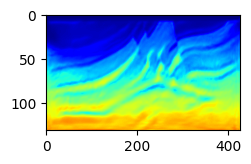

Epoch: 471 Loss:  -9.851454555988312 model_loss:  99531.03
Epoch: 472 Loss:  -9.852279484272003 model_loss:  99261.23
Epoch: 473 Loss:  -9.858073353767395 model_loss:  100910.414
Epoch: 474 Loss:  -9.860749423503876 model_loss:  102915.95
Epoch: 475 Loss:  -9.86016845703125 model_loss:  101175.13


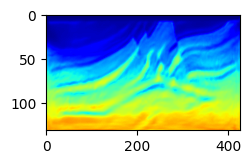

Epoch: 476 Loss:  -9.861268162727356 model_loss:  100619.83
Epoch: 477 Loss:  -9.858937919139862 model_loss:  100260.586
Epoch: 478 Loss:  -9.863422155380249 model_loss:  100380.414
Epoch: 479 Loss:  -9.864563703536987 model_loss:  100875.24
Epoch: 480 Loss:  -9.864068806171417 model_loss:  100853.53


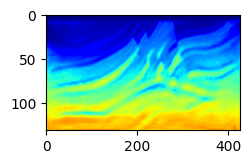

Epoch: 481 Loss:  -9.860652446746826 model_loss:  101030.164
Epoch: 482 Loss:  -9.861161887645721 model_loss:  99886.45
Epoch: 483 Loss:  -9.861182868480682 model_loss:  100137.24
Epoch: 484 Loss:  -9.864979445934296 model_loss:  100278.68
Epoch: 485 Loss:  -9.865892708301544 model_loss:  100525.66


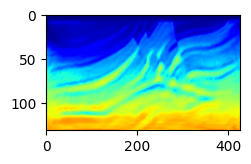

Epoch: 486 Loss:  -9.866004168987274 model_loss:  99547.2
Epoch: 487 Loss:  -9.86567598581314 model_loss:  99127.36
Epoch: 488 Loss:  -9.864221513271332 model_loss:  98871.47
Epoch: 489 Loss:  -9.865131616592407 model_loss:  99286.09
Epoch: 490 Loss:  -9.864822328090668 model_loss:  99907.58


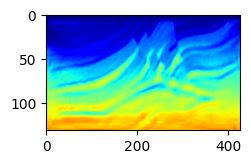

Epoch: 491 Loss:  -9.866376101970673 model_loss:  99775.36
Epoch: 492 Loss:  -9.866006255149841 model_loss:  100015.87
Epoch: 493 Loss:  -9.866482555866241 model_loss:  99591.586
Epoch: 494 Loss:  -9.86565613746643 model_loss:  99282.22
Epoch: 495 Loss:  -9.865475296974182 model_loss:  98422.93


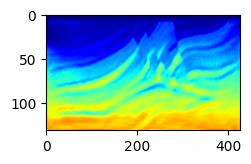

Epoch: 496 Loss:  -9.864587724208832 model_loss:  98909.59
Epoch: 497 Loss:  -9.862261235713959 model_loss:  98155.22
Epoch: 498 Loss:  -9.859663963317871 model_loss:  98980.984
Epoch: 499 Loss:  -9.863217234611511 model_loss:  97990.73
Epoch: 500 Loss:  -9.885987520217896 model_loss:  98351.266


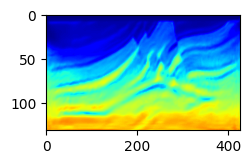

Epoch: 501 Loss:  -9.885833442211151 model_loss:  95714.62
Epoch: 502 Loss:  -9.886554300785065 model_loss:  94764.81
Epoch: 503 Loss:  -9.886153221130371 model_loss:  96116.46
Epoch: 504 Loss:  -9.885564744472504 model_loss:  95396.74
Epoch: 505 Loss:  -9.886005580425262 model_loss:  95278.516


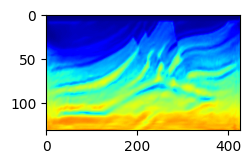

Epoch: 506 Loss:  -9.885633826255798 model_loss:  94897.69
Epoch: 507 Loss:  -9.885685801506042 model_loss:  94731.89
Epoch: 508 Loss:  -9.886364579200745 model_loss:  94714.23
Epoch: 509 Loss:  -9.887258410453796 model_loss:  94425.54
Epoch: 510 Loss:  -9.888092160224915 model_loss:  94416.63


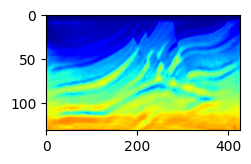

Epoch: 511 Loss:  -9.888559997081757 model_loss:  94053.1
Epoch: 512 Loss:  -9.888979434967041 model_loss:  93777.97
Epoch: 513 Loss:  -9.88932889699936 model_loss:  93210.4
Epoch: 514 Loss:  -9.889721930027008 model_loss:  93121.47
Epoch: 515 Loss:  -9.88995909690857 model_loss:  92858.125


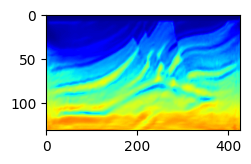

Epoch: 516 Loss:  -9.89024966955185 model_loss:  92666.1
Epoch: 517 Loss:  -9.890563309192657 model_loss:  92508.836
Epoch: 518 Loss:  -9.890750586986542 model_loss:  92480.11
Epoch: 519 Loss:  -9.890840947628021 model_loss:  92271.89
Epoch: 520 Loss:  -9.890895128250122 model_loss:  92173.12


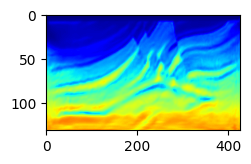

Epoch: 521 Loss:  -9.890892088413239 model_loss:  92100.625
Epoch: 522 Loss:  -9.890799641609192 model_loss:  92017.49
Epoch: 523 Loss:  -9.890697598457336 model_loss:  91943.78
Epoch: 524 Loss:  -9.890625596046448 model_loss:  91952.85
Epoch: 525 Loss:  -9.890510022640228 model_loss:  91914.836


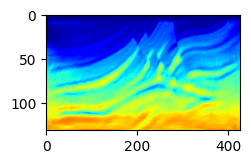

Epoch: 526 Loss:  -9.890416383743286 model_loss:  91869.64
Epoch: 527 Loss:  -9.89034128189087 model_loss:  91834.1
Epoch: 528 Loss:  -9.890301048755646 model_loss:  91845.75
Epoch: 529 Loss:  -9.89022570848465 model_loss:  91719.56
Epoch: 530 Loss:  -9.890257239341736 model_loss:  91634.75


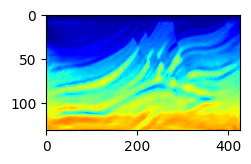

Epoch: 531 Loss:  -9.890271604061127 model_loss:  91616.49
Epoch: 532 Loss:  -9.89031034708023 model_loss:  91568.586
Epoch: 533 Loss:  -9.890339493751526 model_loss:  91527.484
Epoch: 534 Loss:  -9.890383064746857 model_loss:  91448.164
Epoch: 535 Loss:  -9.89045113325119 model_loss:  91456.01


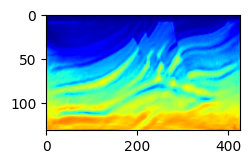

Epoch: 536 Loss:  -9.890508770942688 model_loss:  91350.11
Epoch: 537 Loss:  -9.890554428100586 model_loss:  91353.4
Epoch: 538 Loss:  -9.890598058700562 model_loss:  91323.8
Epoch: 539 Loss:  -9.890649020671844 model_loss:  91236.17
Epoch: 540 Loss:  -9.890712916851044 model_loss:  91158.664


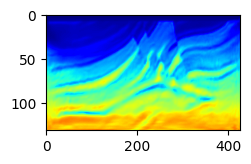

Epoch: 541 Loss:  -9.890761196613312 model_loss:  91094.43
Epoch: 542 Loss:  -9.890841245651245 model_loss:  91056.39
Epoch: 543 Loss:  -9.890915215015411 model_loss:  91060.41
Epoch: 544 Loss:  -9.890963673591614 model_loss:  91000.65
Epoch: 545 Loss:  -9.891008794307709 model_loss:  90932.18


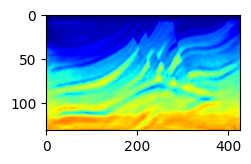

Epoch: 546 Loss:  -9.891036331653595 model_loss:  90877.945
Epoch: 547 Loss:  -9.891067743301392 model_loss:  90858.88
Epoch: 548 Loss:  -9.891082167625427 model_loss:  90789.086
Epoch: 549 Loss:  -9.891103029251099 model_loss:  90704.69
Epoch: 550 Loss:  -9.891127049922943 model_loss:  90657.13


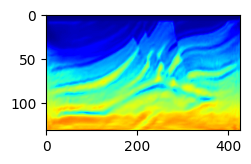

Epoch: 551 Loss:  -9.891152322292328 model_loss:  90621.03
Epoch: 552 Loss:  -9.891158044338226 model_loss:  90567.57
Epoch: 553 Loss:  -9.891183018684387 model_loss:  90515.09
Epoch: 554 Loss:  -9.891193866729736 model_loss:  90491.15
Epoch: 555 Loss:  -9.891202867031097 model_loss:  90399.15


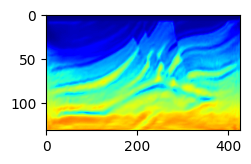

Epoch: 556 Loss:  -9.891220152378082 model_loss:  90337.22
Epoch: 557 Loss:  -9.89124208688736 model_loss:  90264.81
Epoch: 558 Loss:  -9.891242027282715 model_loss:  90232.83
Epoch: 559 Loss:  -9.89125919342041 model_loss:  90198.4
Epoch: 560 Loss:  -9.891247630119324 model_loss:  90173.086


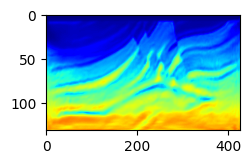

Epoch: 561 Loss:  -9.891272127628326 model_loss:  90070.69
Epoch: 562 Loss:  -9.891283512115479 model_loss:  90089.28
Epoch: 563 Loss:  -9.891303539276123 model_loss:  89985.95
Epoch: 564 Loss:  -9.891337811946869 model_loss:  89996.39
Epoch: 565 Loss:  -9.891344130039215 model_loss:  89961.85


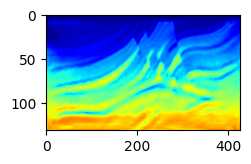

Epoch: 566 Loss:  -9.891329050064087 model_loss:  89884.23
Epoch: 567 Loss:  -9.89133483171463 model_loss:  89866.96
Epoch: 568 Loss:  -9.891322493553162 model_loss:  89798.1
Epoch: 569 Loss:  -9.891321957111359 model_loss:  89836.64
Epoch: 570 Loss:  -9.891348719596863 model_loss:  89802.27


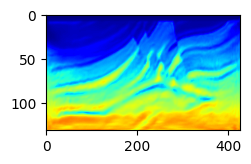

Epoch: 571 Loss:  -9.891357362270355 model_loss:  89812.8
Epoch: 572 Loss:  -9.891340136528015 model_loss:  89791.81
Epoch: 573 Loss:  -9.89134168624878 model_loss:  89752.08
Epoch: 574 Loss:  -9.891348242759705 model_loss:  89760.4
Epoch: 575 Loss:  -9.89134794473648 model_loss:  89730.24


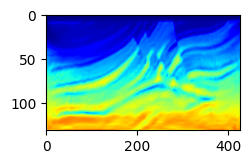

Epoch: 576 Loss:  -9.891367554664612 model_loss:  89757.87
Epoch: 577 Loss:  -9.89138674736023 model_loss:  89734.83
Epoch: 578 Loss:  -9.891400277614594 model_loss:  89691.86
Epoch: 579 Loss:  -9.891405522823334 model_loss:  89582.83
Epoch: 580 Loss:  -9.891430735588074 model_loss:  89658.16


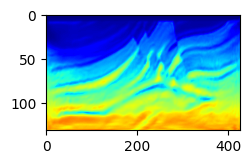

Epoch: 581 Loss:  -9.891434907913208 model_loss:  89589.11
Epoch: 582 Loss:  -9.891453862190247 model_loss:  89540.766
Epoch: 583 Loss:  -9.891456484794617 model_loss:  89472.33
Epoch: 584 Loss:  -9.891457498073578 model_loss:  89466.2
Epoch: 585 Loss:  -9.89147400856018 model_loss:  89434.86


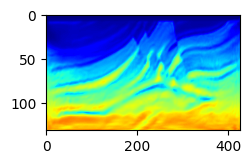

Epoch: 586 Loss:  -9.891493022441864 model_loss:  89421.92
Epoch: 587 Loss:  -9.891488313674927 model_loss:  89503.14
Epoch: 588 Loss:  -9.89145576953888 model_loss:  89230.586
Epoch: 589 Loss:  -9.89146339893341 model_loss:  89381.96
Epoch: 590 Loss:  -9.891472101211548 model_loss:  89269.695


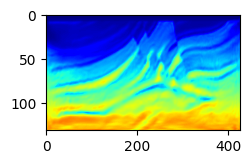

Epoch: 591 Loss:  -9.891468346118927 model_loss:  89377.516
Epoch: 592 Loss:  -9.891453325748444 model_loss:  89348.984
Epoch: 593 Loss:  -9.891502320766449 model_loss:  89316.04
Epoch: 594 Loss:  -9.891465365886688 model_loss:  89233.17
Epoch: 595 Loss:  -9.891425549983978 model_loss:  89169.18


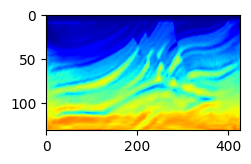

Epoch: 596 Loss:  -9.891477048397064 model_loss:  89180.625
Epoch: 597 Loss:  -9.891439378261566 model_loss:  89154.42
Epoch: 598 Loss:  -9.891417980194092 model_loss:  89132.445
Epoch: 599 Loss:  -9.891449987888336 model_loss:  89143.36
Epoch: 600 Loss:  -9.891398310661316 model_loss:  89147.445


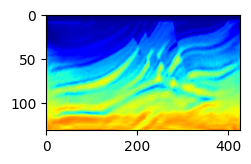

Epoch: 601 Loss:  -9.891389667987823 model_loss:  89149.164
Epoch: 602 Loss:  -9.891409814357758 model_loss:  89117.79
Epoch: 603 Loss:  -9.891422748565674 model_loss:  89039.016
Epoch: 604 Loss:  -9.891351222991943 model_loss:  89019.23
Epoch: 605 Loss:  -9.89134806394577 model_loss:  88990.164


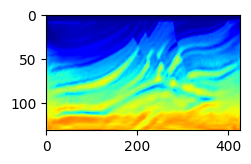

Epoch: 606 Loss:  -9.891414284706116 model_loss:  88942.984
Epoch: 607 Loss:  -9.891432762145996 model_loss:  88951.45
Epoch: 608 Loss:  -9.89138251543045 model_loss:  88904.47
Epoch: 609 Loss:  -9.891366481781006 model_loss:  88907.88
Epoch: 610 Loss:  -9.891350030899048 model_loss:  88795.695


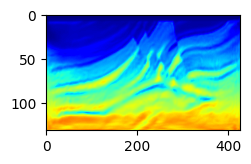

Epoch: 611 Loss:  -9.89125645160675 model_loss:  88772.445
Epoch: 612 Loss:  -9.891244411468506 model_loss:  88806.65
Epoch: 613 Loss:  -9.891206085681915 model_loss:  88869.83
Epoch: 614 Loss:  -9.891187012195587 model_loss:  88814.33
Epoch: 615 Loss:  -9.891240239143372 model_loss:  88876.84


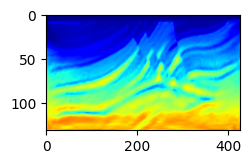

Epoch: 616 Loss:  -9.891200065612793 model_loss:  88897.125
Epoch: 617 Loss:  -9.891159236431122 model_loss:  88885.086
Epoch: 618 Loss:  -9.891142785549164 model_loss:  88783.75
Epoch: 619 Loss:  -9.891093313694 model_loss:  88859.64
Epoch: 620 Loss:  -9.891014516353607 model_loss:  88670.65


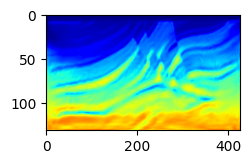

Epoch: 621 Loss:  -9.89082670211792 model_loss:  88791.69
Epoch: 622 Loss:  -9.891038656234741 model_loss:  88511.664
Epoch: 623 Loss:  -9.890961170196533 model_loss:  88566.39
Epoch: 624 Loss:  -9.891065895557404 model_loss:  88668.766
Epoch: 625 Loss:  -9.891171753406525 model_loss:  88702.92


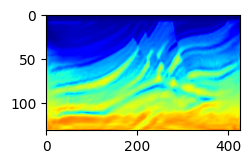

Epoch: 626 Loss:  -9.891120374202728 model_loss:  88666.414
Epoch: 627 Loss:  -9.890893816947937 model_loss:  88609.27
Epoch: 628 Loss:  -9.890902817249298 model_loss:  88595.58
Epoch: 629 Loss:  -9.891028940677643 model_loss:  88512.26
Epoch: 630 Loss:  -9.891060411930084 model_loss:  88484.9


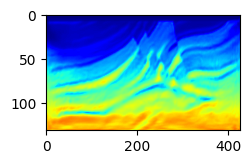

Epoch: 631 Loss:  -9.891077935695648 model_loss:  88439.875
Epoch: 632 Loss:  -9.891145169734955 model_loss:  88495.51
Epoch: 633 Loss:  -9.891236424446106 model_loss:  88480.44
Epoch: 634 Loss:  -9.891181647777557 model_loss:  88429.664
Epoch: 635 Loss:  -9.891077160835266 model_loss:  88479.0


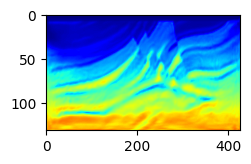

Epoch: 636 Loss:  -9.890931487083435 model_loss:  88529.69
Epoch: 637 Loss:  -9.890650749206543 model_loss:  88409.52
Epoch: 638 Loss:  -9.890585958957672 model_loss:  88324.82
Epoch: 639 Loss:  -9.890476703643799 model_loss:  88434.07
Epoch: 640 Loss:  -9.890251219272614 model_loss:  88480.17


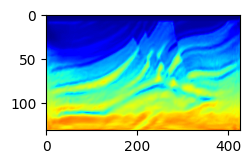

Epoch: 641 Loss:  -9.890133023262024 model_loss:  88403.016
Epoch: 642 Loss:  -9.890078723430634 model_loss:  88411.09
Epoch: 643 Loss:  -9.890043377876282 model_loss:  88633.04
Epoch: 644 Loss:  -9.890060901641846 model_loss:  88563.1
Epoch: 645 Loss:  -9.889839112758636 model_loss:  88685.59


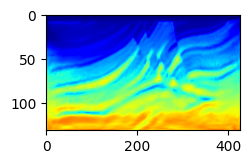

Epoch: 646 Loss:  -9.889470219612122 model_loss:  88719.23
Epoch: 647 Loss:  -9.889853596687317 model_loss:  88706.53
Epoch: 648 Loss:  -9.890211522579193 model_loss:  88759.29
Epoch: 649 Loss:  -9.890465080738068 model_loss:  88844.06
Epoch: 650 Loss:  -9.890837490558624 model_loss:  88526.69


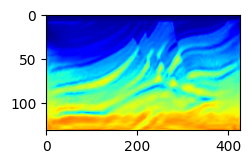

Epoch: 651 Loss:  -9.89117020368576 model_loss:  88313.516
Epoch: 652 Loss:  -9.891378581523895 model_loss:  88074.78
Epoch: 653 Loss:  -9.891464471817017 model_loss:  87984.87
Epoch: 654 Loss:  -9.891566753387451 model_loss:  88039.516
Epoch: 655 Loss:  -9.891543686389923 model_loss:  88083.99


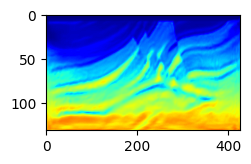

Epoch: 656 Loss:  -9.891516506671906 model_loss:  87986.945
Epoch: 657 Loss:  -9.891220271587372 model_loss:  88181.664
Epoch: 658 Loss:  -9.89077776670456 model_loss:  88123.46
Epoch: 659 Loss:  -9.889858424663544 model_loss:  88165.25
Epoch: 660 Loss:  -9.889625489711761 model_loss:  88565.56


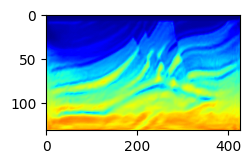

Epoch: 661 Loss:  -9.889281332492828 model_loss:  88435.766
Epoch: 662 Loss:  -9.889656722545624 model_loss:  88713.46
Epoch: 663 Loss:  -9.889388918876648 model_loss:  88602.56
Epoch: 664 Loss:  -9.889554500579834 model_loss:  88655.68
Epoch: 665 Loss:  -9.88890689611435 model_loss:  88956.34


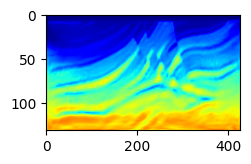

Epoch: 666 Loss:  -9.8887580037117 model_loss:  88866.5
Epoch: 667 Loss:  -9.889225721359253 model_loss:  88589.93
Epoch: 668 Loss:  -9.88972520828247 model_loss:  88166.19
Epoch: 669 Loss:  -9.890117943286896 model_loss:  87550.54
Epoch: 670 Loss:  -9.890387773513794 model_loss:  87773.86


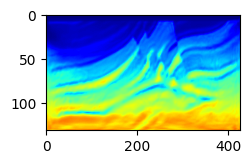

Epoch: 671 Loss:  -9.89067542552948 model_loss:  88120.64
Epoch: 672 Loss:  -9.890983045101166 model_loss:  88396.37
Epoch: 673 Loss:  -9.890990018844604 model_loss:  88730.77
Epoch: 674 Loss:  -9.89130014181137 model_loss:  88703.53
Epoch: 675 Loss:  -9.890996217727661 model_loss:  88915.59


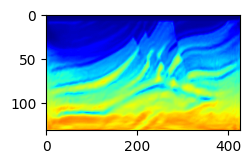

Epoch: 676 Loss:  -9.890546143054962 model_loss:  89300.234
Epoch: 677 Loss:  -9.889971911907196 model_loss:  89515.89
Epoch: 678 Loss:  -9.890258312225342 model_loss:  89241.41
Epoch: 679 Loss:  -9.89021348953247 model_loss:  88965.45
Epoch: 680 Loss:  -9.890570402145386 model_loss:  88761.055


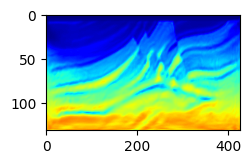

Epoch: 681 Loss:  -9.890590190887451 model_loss:  89017.29
Epoch: 682 Loss:  -9.890094459056854 model_loss:  88879.3
Epoch: 683 Loss:  -9.89029610157013 model_loss:  89042.16
Epoch: 684 Loss:  -9.889792561531067 model_loss:  88826.26
Epoch: 685 Loss:  -9.890349984169006 model_loss:  88465.25


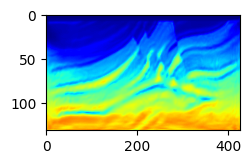

Epoch: 686 Loss:  -9.89085566997528 model_loss:  88188.555
Epoch: 687 Loss:  -9.891405940055847 model_loss:  88217.12
Epoch: 688 Loss:  -9.89169991016388 model_loss:  88399.55
Epoch: 689 Loss:  -9.89168530702591 model_loss:  88632.29
Epoch: 690 Loss:  -9.891656696796417 model_loss:  88831.86


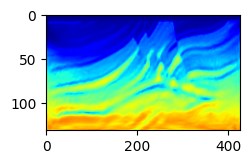

Epoch: 691 Loss:  -9.891672909259796 model_loss:  88991.64
Epoch: 692 Loss:  -9.89168268442154 model_loss:  88991.63
Epoch: 693 Loss:  -9.891253113746643 model_loss:  88798.47
Epoch: 694 Loss:  -9.891003489494324 model_loss:  88544.33
Epoch: 695 Loss:  -9.89099907875061 model_loss:  88507.586


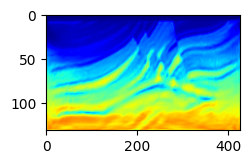

Epoch: 696 Loss:  -9.890640556812286 model_loss:  88431.945
Epoch: 697 Loss:  -9.890551626682281 model_loss:  88552.6
Epoch: 698 Loss:  -9.890293598175049 model_loss:  88723.33
Epoch: 699 Loss:  -9.890174567699432 model_loss:  88740.81
Epoch: 700 Loss:  -9.890213906764984 model_loss:  88768.61


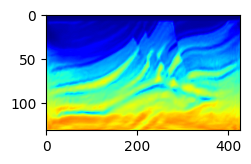

Epoch: 701 Loss:  -9.890333592891693 model_loss:  88397.7
Epoch: 702 Loss:  -9.891005516052246 model_loss:  88176.82
Epoch: 703 Loss:  -9.891330003738403 model_loss:  87829.74
Epoch: 704 Loss:  -9.89183658361435 model_loss:  88001.03
Epoch: 705 Loss:  -9.891984403133392 model_loss:  88071.01


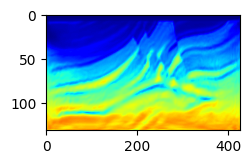

Epoch: 706 Loss:  -9.892092227935791 model_loss:  88126.78
Epoch: 707 Loss:  -9.892029225826263 model_loss:  88039.02
Epoch: 708 Loss:  -9.891759872436523 model_loss:  87992.375
Epoch: 709 Loss:  -9.891976773738861 model_loss:  87953.87
Epoch: 710 Loss:  -9.892109990119934 model_loss:  87978.95


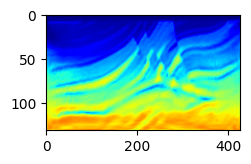

Epoch: 711 Loss:  -9.892282664775848 model_loss:  88074.79
Epoch: 712 Loss:  -9.892048835754395 model_loss:  87960.67
Epoch: 713 Loss:  -9.891718029975891 model_loss:  87764.52
Epoch: 714 Loss:  -9.891677796840668 model_loss:  87750.164
Epoch: 715 Loss:  -9.891795098781586 model_loss:  87987.87


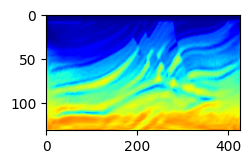

Epoch: 716 Loss:  -9.891898393630981 model_loss:  87857.9
Epoch: 717 Loss:  -9.891949117183685 model_loss:  87794.836
Epoch: 718 Loss:  -9.892030656337738 model_loss:  87732.12
Epoch: 719 Loss:  -9.892102301120758 model_loss:  87858.83
Epoch: 720 Loss:  -9.892129719257355 model_loss:  88050.78


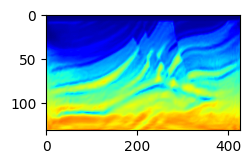

Epoch: 721 Loss:  -9.891997456550598 model_loss:  88193.85
Epoch: 722 Loss:  -9.892006397247314 model_loss:  88163.67
Epoch: 723 Loss:  -9.891969203948975 model_loss:  88163.17
Epoch: 724 Loss:  -9.892005741596222 model_loss:  88305.73
Epoch: 725 Loss:  -9.892030715942383 model_loss:  87997.28


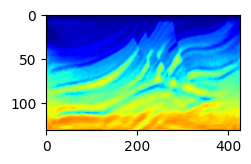

Epoch: 726 Loss:  -9.892071545124054 model_loss:  88138.48
Epoch: 727 Loss:  -9.89200747013092 model_loss:  87852.086
Epoch: 728 Loss:  -9.8920179605484 model_loss:  88020.0
Epoch: 729 Loss:  -9.892156541347504 model_loss:  87815.86
Epoch: 730 Loss:  -9.89162164926529 model_loss:  87810.984


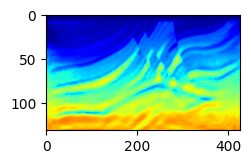

Epoch: 731 Loss:  -9.892102479934692 model_loss:  87813.664
Epoch: 732 Loss:  -9.89183223247528 model_loss:  87728.74
Epoch: 733 Loss:  -9.8922518491745 model_loss:  88056.27
Epoch: 734 Loss:  -9.891753613948822 model_loss:  87945.99
Epoch: 735 Loss:  -9.886770486831665 model_loss:  88200.02


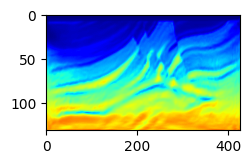

Epoch: 736 Loss:  -9.888085663318634 model_loss:  87287.46
Epoch: 737 Loss:  -9.888966917991638 model_loss:  88571.42
Epoch: 738 Loss:  -9.890293002128601 model_loss:  87905.7
Epoch: 739 Loss:  -9.885430574417114 model_loss:  88039.516
Epoch: 740 Loss:  -9.889569580554962 model_loss:  87557.15


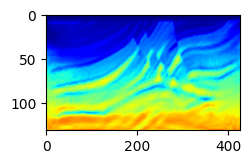

Epoch: 741 Loss:  -9.887189328670502 model_loss:  87880.98
Epoch: 742 Loss:  -9.890922963619232 model_loss:  88574.41
Epoch: 743 Loss:  -9.8894864320755 model_loss:  88421.07
Epoch: 744 Loss:  -9.89096087217331 model_loss:  88056.484
Epoch: 745 Loss:  -9.889670193195343 model_loss:  88109.516


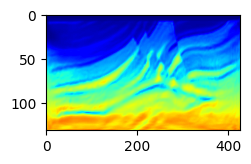

Epoch: 746 Loss:  -9.890625894069672 model_loss:  88257.5
Epoch: 747 Loss:  -9.890423893928528 model_loss:  88225.65
Epoch: 748 Loss:  -9.890893876552582 model_loss:  88078.1
Epoch: 749 Loss:  -9.890433132648468 model_loss:  87909.39
Epoch: 750 Loss:  -9.890587031841278 model_loss:  88020.32


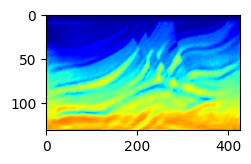

Epoch: 751 Loss:  -9.890585780143738 model_loss:  88051.01
Epoch: 752 Loss:  -9.890380203723907 model_loss:  88191.44
Epoch: 753 Loss:  -9.890233159065247 model_loss:  88413.09
Epoch: 754 Loss:  -9.889896512031555 model_loss:  88447.65
Epoch: 755 Loss:  -9.889984369277954 model_loss:  88351.77


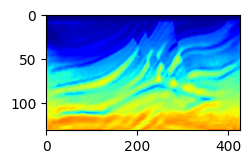

Epoch: 756 Loss:  -9.890256881713867 model_loss:  88141.016
Epoch: 757 Loss:  -9.890473246574402 model_loss:  87974.18
Epoch: 758 Loss:  -9.890709459781647 model_loss:  88044.6
Epoch: 759 Loss:  -9.89066231250763 model_loss:  88170.23
Epoch: 760 Loss:  -9.89108258485794 model_loss:  88649.03


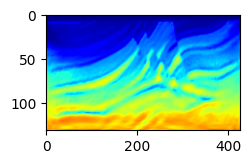

Epoch: 761 Loss:  -9.891423106193542 model_loss:  88779.27
Epoch: 762 Loss:  -9.891646981239319 model_loss:  88621.445
Epoch: 763 Loss:  -9.891748189926147 model_loss:  88618.48
Epoch: 764 Loss:  -9.89182424545288 model_loss:  88374.5
Epoch: 765 Loss:  -9.891712546348572 model_loss:  88227.875


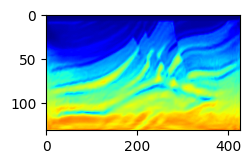

Epoch: 766 Loss:  -9.891953468322754 model_loss:  88048.58
Epoch: 767 Loss:  -9.892244458198547 model_loss:  87954.54
Epoch: 768 Loss:  -9.892408967018127 model_loss:  87830.375
Epoch: 769 Loss:  -9.8925302028656 model_loss:  87527.12
Epoch: 770 Loss:  -9.892493784427643 model_loss:  87365.32


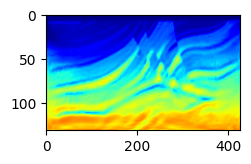

Epoch: 771 Loss:  -9.8924440741539 model_loss:  87231.29
Epoch: 772 Loss:  -9.892404854297638 model_loss:  87345.27
Epoch: 773 Loss:  -9.892372906208038 model_loss:  87480.34
Epoch: 774 Loss:  -9.892198383808136 model_loss:  87512.58
Epoch: 775 Loss:  -9.892066955566406 model_loss:  87503.01


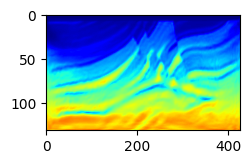

Epoch: 776 Loss:  -9.891914546489716 model_loss:  87386.75
Epoch: 777 Loss:  -9.892133176326752 model_loss:  87733.92
Epoch: 778 Loss:  -9.892073273658752 model_loss:  87582.92
Epoch: 779 Loss:  -9.892324209213257 model_loss:  87409.625
Epoch: 780 Loss:  -9.89221876859665 model_loss:  87331.11


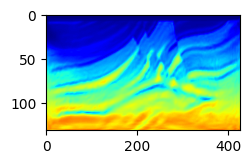

Epoch: 781 Loss:  -9.892439901828766 model_loss:  87256.28
Epoch: 782 Loss:  -9.892545700073242 model_loss:  87335.27
Epoch: 783 Loss:  -9.89258086681366 model_loss:  87613.08
Epoch: 784 Loss:  -9.892442524433136 model_loss:  87474.37
Epoch: 785 Loss:  -9.89215236902237 model_loss:  87493.13


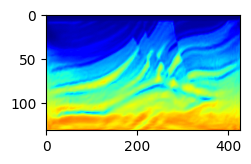

Epoch: 786 Loss:  -9.892263293266296 model_loss:  87531.77
Epoch: 787 Loss:  -9.891788959503174 model_loss:  87501.29
Epoch: 788 Loss:  -9.89217609167099 model_loss:  87705.805
Epoch: 789 Loss:  -9.892106235027313 model_loss:  87566.79
Epoch: 790 Loss:  -9.89172738790512 model_loss:  87764.1


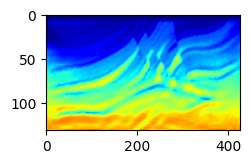

Epoch: 791 Loss:  -9.891981184482574 model_loss:  87628.24
Epoch: 792 Loss:  -9.891394078731537 model_loss:  87483.14
Epoch: 793 Loss:  -9.891348659992218 model_loss:  87751.79
Epoch: 794 Loss:  -9.891723573207855 model_loss:  87419.59
Epoch: 795 Loss:  -9.892128765583038 model_loss:  87767.38


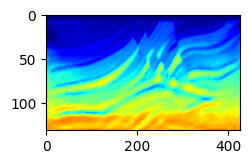

Epoch: 796 Loss:  -9.890500545501709 model_loss:  87871.94
Epoch: 797 Loss:  -9.891482651233673 model_loss:  87609.73
Epoch: 798 Loss:  -9.889928877353668 model_loss:  87753.945
Epoch: 799 Loss:  -9.891176879405975 model_loss:  87716.48
Epoch: 800 Loss:  -9.888895332813263 model_loss:  87834.78


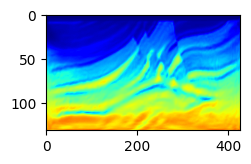

Epoch: 801 Loss:  -9.890123724937439 model_loss:  87255.69
Epoch: 802 Loss:  -9.88919723033905 model_loss:  87639.03
Epoch: 803 Loss:  -9.890280544757843 model_loss:  87578.45
Epoch: 804 Loss:  -9.888910353183746 model_loss:  87575.945
Epoch: 805 Loss:  -9.890657901763916 model_loss:  87388.51


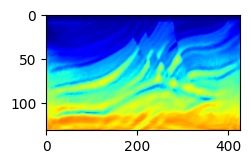

Epoch: 806 Loss:  -9.889804184436798 model_loss:  87503.016
Epoch: 807 Loss:  -9.891414999961853 model_loss:  87635.26
Epoch: 808 Loss:  -9.889588713645935 model_loss:  87859.164
Epoch: 809 Loss:  -9.890771865844727 model_loss:  87977.87
Epoch: 810 Loss:  -9.888160467147827 model_loss:  88430.4


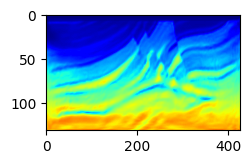

Epoch: 811 Loss:  -9.88789701461792 model_loss:  88378.36
Epoch: 812 Loss:  -9.887467920780182 model_loss:  88535.9
Epoch: 813 Loss:  -9.88864117860794 model_loss:  88253.43
Epoch: 814 Loss:  -9.889200448989868 model_loss:  88192.51
Epoch: 815 Loss:  -9.889868021011353 model_loss:  88252.01


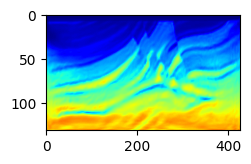

Epoch: 816 Loss:  -9.890044927597046 model_loss:  88292.12
Epoch: 817 Loss:  -9.890095353126526 model_loss:  88373.27
Epoch: 818 Loss:  -9.89038211107254 model_loss:  88209.95
Epoch: 819 Loss:  -9.890462279319763 model_loss:  87609.734
Epoch: 820 Loss:  -9.890926003456116 model_loss:  87146.23


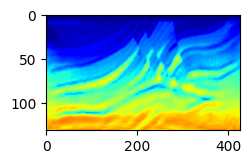

Epoch: 821 Loss:  -9.890793204307556 model_loss:  87123.734
Epoch: 822 Loss:  -9.890887141227722 model_loss:  87631.62
Epoch: 823 Loss:  -9.890906572341919 model_loss:  87808.266
Epoch: 824 Loss:  -9.891114711761475 model_loss:  88417.68
Epoch: 825 Loss:  -9.891594111919403 model_loss:  88369.62


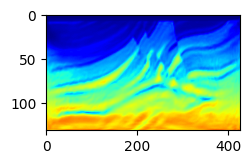

Epoch: 826 Loss:  -9.89197152853012 model_loss:  88377.414
Epoch: 827 Loss:  -9.892578899860382 model_loss:  88123.16
Epoch: 828 Loss:  -9.89262992143631 model_loss:  87978.86
Epoch: 829 Loss:  -9.892516434192657 model_loss:  87804.22
Epoch: 830 Loss:  -9.892381370067596 model_loss:  87782.016


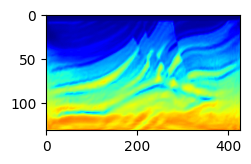

Epoch: 831 Loss:  -9.892272174358368 model_loss:  87944.086
Epoch: 832 Loss:  -9.892141997814178 model_loss:  88137.99
Epoch: 833 Loss:  -9.891910910606384 model_loss:  87937.96
Epoch: 834 Loss:  -9.891862869262695 model_loss:  87697.14
Epoch: 835 Loss:  -9.892256319522858 model_loss:  87529.07


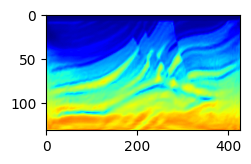

Epoch: 836 Loss:  -9.892491579055786 model_loss:  87501.66
Epoch: 837 Loss:  -9.892507374286652 model_loss:  87550.125
Epoch: 838 Loss:  -9.892219126224518 model_loss:  87782.414
Epoch: 839 Loss:  -9.891592681407928 model_loss:  87780.78
Epoch: 840 Loss:  -9.891317069530487 model_loss:  87872.61


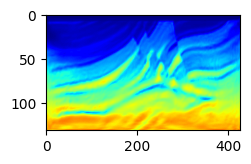

Epoch: 841 Loss:  -9.891322314739227 model_loss:  87859.61
Epoch: 842 Loss:  -9.891194105148315 model_loss:  87892.984
Epoch: 843 Loss:  -9.891037225723267 model_loss:  87680.555
Epoch: 844 Loss:  -9.890796482563019 model_loss:  87553.67
Epoch: 845 Loss:  -9.890409052371979 model_loss:  87478.42


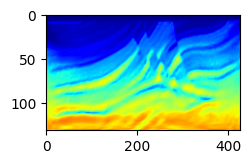

Epoch: 846 Loss:  -9.890434741973877 model_loss:  87575.875
Epoch: 847 Loss:  -9.890099108219147 model_loss:  87549.586
Epoch: 848 Loss:  -9.889811515808105 model_loss:  87963.82
Epoch: 849 Loss:  -9.889278531074524 model_loss:  88080.766
Epoch: 850 Loss:  -9.889431953430176 model_loss:  88337.8


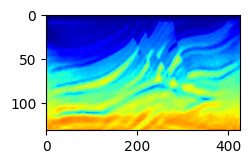

Epoch: 851 Loss:  -9.889886200428009 model_loss:  88254.06
Epoch: 852 Loss:  -9.890287280082703 model_loss:  88409.016
Epoch: 853 Loss:  -9.89072322845459 model_loss:  88295.71
Epoch: 854 Loss:  -9.891135096549988 model_loss:  88051.52
Epoch: 855 Loss:  -9.891505181789398 model_loss:  87469.234


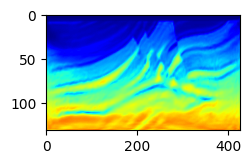

Epoch: 856 Loss:  -9.891782701015472 model_loss:  87474.82
Epoch: 857 Loss:  -9.891719222068787 model_loss:  87648.46
Epoch: 858 Loss:  -9.891602218151093 model_loss:  87876.32
Epoch: 859 Loss:  -9.891859769821167 model_loss:  88362.45
Epoch: 860 Loss:  -9.891967952251434 model_loss:  88285.43


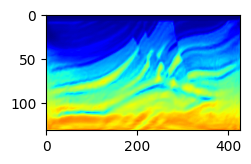

Epoch: 861 Loss:  -9.89176231622696 model_loss:  87789.586
Epoch: 862 Loss:  -9.891602277755737 model_loss:  87772.27
Epoch: 863 Loss:  -9.891555786132812 model_loss:  87878.02
Epoch: 864 Loss:  -9.8914213180542 model_loss:  88056.91
Epoch: 865 Loss:  -9.890973031520844 model_loss:  88338.42


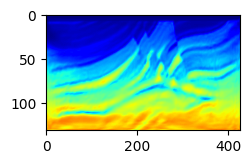

Epoch: 866 Loss:  -9.890504121780396 model_loss:  88206.28
Epoch: 867 Loss:  -9.890654265880585 model_loss:  88255.72
Epoch: 868 Loss:  -9.890581786632538 model_loss:  87919.61
Epoch: 869 Loss:  -9.891210198402405 model_loss:  87910.06
Epoch: 870 Loss:  -9.891288816928864 model_loss:  87615.13


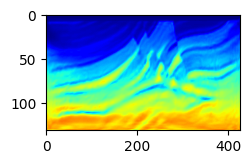

Epoch: 871 Loss:  -9.891324281692505 model_loss:  87728.93
Epoch: 872 Loss:  -9.891079485416412 model_loss:  87716.84
Epoch: 873 Loss:  -9.891030669212341 model_loss:  87923.01
Epoch: 874 Loss:  -9.891243398189545 model_loss:  87934.836
Epoch: 875 Loss:  -9.891697406768799 model_loss:  87582.32


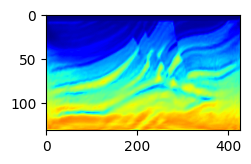

Epoch: 876 Loss:  -9.891673743724823 model_loss:  87445.086
Epoch: 877 Loss:  -9.891260147094727 model_loss:  87279.37
Epoch: 878 Loss:  -9.891045689582825 model_loss:  87139.875
Epoch: 879 Loss:  -9.89115971326828 model_loss:  87196.58
Epoch: 880 Loss:  -9.891209185123444 model_loss:  87224.63


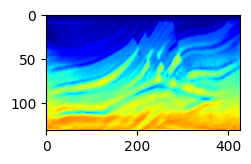

Epoch: 881 Loss:  -9.891325116157532 model_loss:  87501.1
Epoch: 882 Loss:  -9.891401171684265 model_loss:  87519.58
Epoch: 883 Loss:  -9.89118379354477 model_loss:  87776.29
Epoch: 884 Loss:  -9.890768647193909 model_loss:  87675.305
Epoch: 885 Loss:  -9.889813244342804 model_loss:  87924.65


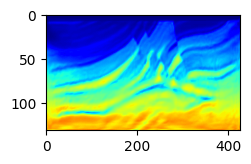

Epoch: 886 Loss:  -9.88986074924469 model_loss:  87842.59
Epoch: 887 Loss:  -9.889998853206635 model_loss:  88182.66
Epoch: 888 Loss:  -9.889450013637543 model_loss:  87574.945
Epoch: 889 Loss:  -9.88963234424591 model_loss:  87960.38
Epoch: 890 Loss:  -9.889117121696472 model_loss:  87974.8


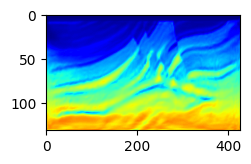

Epoch: 891 Loss:  -9.888474345207214 model_loss:  88139.74
Epoch: 892 Loss:  -9.889960587024689 model_loss:  87425.914
Epoch: 893 Loss:  -9.89018166065216 model_loss:  87228.02
Epoch: 894 Loss:  -9.890955209732056 model_loss:  87372.56
Epoch: 895 Loss:  -9.890892326831818 model_loss:  87198.07


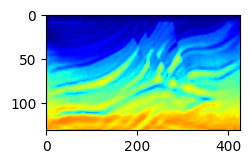

Epoch: 896 Loss:  -9.891734778881073 model_loss:  87261.234
Epoch: 897 Loss:  -9.891947865486145 model_loss:  86982.97
Epoch: 898 Loss:  -9.892167329788208 model_loss:  86958.83
Epoch: 899 Loss:  -9.89217859506607 model_loss:  87421.77
Epoch: 900 Loss:  -9.892328143119812 model_loss:  87405.516


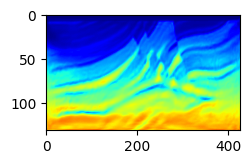

Epoch: 901 Loss:  -9.892270803451538 model_loss:  87811.58
Epoch: 902 Loss:  -9.89204877614975 model_loss:  87952.516
Epoch: 903 Loss:  -9.891651272773743 model_loss:  88110.88
Epoch: 904 Loss:  -9.892286539077759 model_loss:  87831.17
Epoch: 905 Loss:  -9.892352044582367 model_loss:  87698.96


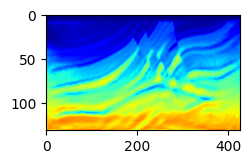

Epoch: 906 Loss:  -9.892253518104553 model_loss:  87458.96
Epoch: 907 Loss:  -9.892117321491241 model_loss:  87340.61
Epoch: 908 Loss:  -9.892150700092316 model_loss:  87332.71
Epoch: 909 Loss:  -9.892216086387634 model_loss:  87372.25
Epoch: 910 Loss:  -9.892672896385193 model_loss:  87375.625


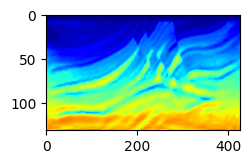

Epoch: 911 Loss:  -9.892727136611938 model_loss:  87377.69
Epoch: 912 Loss:  -9.89269733428955 model_loss:  87324.23
Epoch: 913 Loss:  -9.892560720443726 model_loss:  87292.48
Epoch: 914 Loss:  -9.892471492290497 model_loss:  87304.016
Epoch: 915 Loss:  -9.89227831363678 model_loss:  87384.04


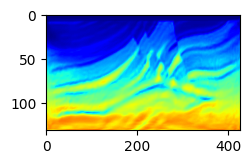

Epoch: 916 Loss:  -9.892299056053162 model_loss:  87478.695
Epoch: 917 Loss:  -9.89222800731659 model_loss:  87737.77
Epoch: 918 Loss:  -9.89199435710907 model_loss:  87718.86
Epoch: 919 Loss:  -9.892135441303253 model_loss:  87580.09
Epoch: 920 Loss:  -9.892052352428436 model_loss:  87600.305


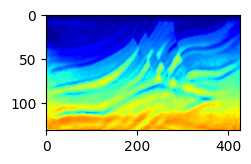

Epoch: 921 Loss:  -9.89143031835556 model_loss:  87668.08
Epoch: 922 Loss:  -9.891297519207 model_loss:  87495.57
Epoch: 923 Loss:  -9.891103327274323 model_loss:  87320.945
Epoch: 924 Loss:  -9.891326367855072 model_loss:  87206.86
Epoch: 925 Loss:  -9.891512215137482 model_loss:  87152.03


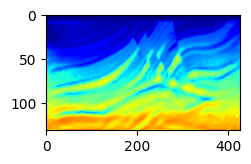

Epoch: 926 Loss:  -9.891791880130768 model_loss:  87124.49
Epoch: 927 Loss:  -9.89194130897522 model_loss:  87234.31
Epoch: 928 Loss:  -9.891894698143005 model_loss:  87437.23
Epoch: 929 Loss:  -9.891706109046936 model_loss:  87305.58
Epoch: 930 Loss:  -9.89237129688263 model_loss:  87166.59


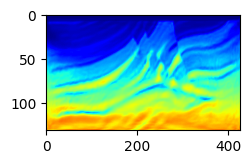

Epoch: 931 Loss:  -9.892080783843994 model_loss:  87529.55
Epoch: 932 Loss:  -9.892218232154846 model_loss:  87442.484
Epoch: 933 Loss:  -9.89189225435257 model_loss:  87926.87
Epoch: 934 Loss:  -9.891806364059448 model_loss:  87717.92
Epoch: 935 Loss:  -9.892003536224365 model_loss:  87617.72


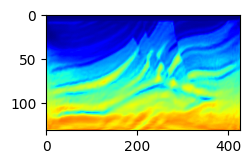

Epoch: 936 Loss:  -9.892015159130096 model_loss:  87809.45
Epoch: 937 Loss:  -9.892327904701233 model_loss:  87618.2
Epoch: 938 Loss:  -9.89199709892273 model_loss:  87456.79
Epoch: 939 Loss:  -9.89027088880539 model_loss:  87060.164
Epoch: 940 Loss:  -9.890899538993835 model_loss:  87074.58


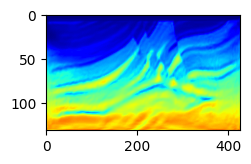

Epoch: 941 Loss:  -9.890727937221527 model_loss:  87256.7
Epoch: 942 Loss:  -9.891226470470428 model_loss:  87323.44
Epoch: 943 Loss:  -9.891293942928314 model_loss:  87125.1
Epoch: 944 Loss:  -9.891665279865265 model_loss:  87181.78
Epoch: 945 Loss:  -9.892161190509796 model_loss:  87021.695


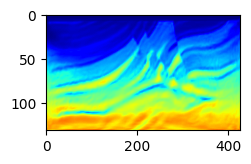

Epoch: 946 Loss:  -9.892266154289246 model_loss:  87029.18
Epoch: 947 Loss:  -9.892561554908752 model_loss:  87504.94
Epoch: 948 Loss:  -9.892343997955322 model_loss:  87614.95
Epoch: 949 Loss:  -9.892191886901855 model_loss:  87669.766
Epoch: 950 Loss:  -9.891877472400665 model_loss:  87694.93


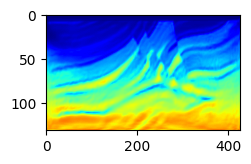

Epoch: 951 Loss:  -9.891606032848358 model_loss:  87848.766
Epoch: 952 Loss:  -9.892039895057678 model_loss:  87942.5
Epoch: 953 Loss:  -9.892133355140686 model_loss:  88174.22
Epoch: 954 Loss:  -9.892177283763885 model_loss:  87824.016
Epoch: 955 Loss:  -9.892426192760468 model_loss:  87494.99


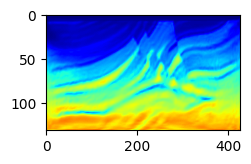

Epoch: 956 Loss:  -9.892636775970459 model_loss:  87104.05
Epoch: 957 Loss:  -9.892516613006592 model_loss:  87524.66
Epoch: 958 Loss:  -9.892594993114471 model_loss:  87863.26
Epoch: 959 Loss:  -9.892292857170105 model_loss:  87939.99
Epoch: 960 Loss:  -9.892166674137115 model_loss:  87888.03


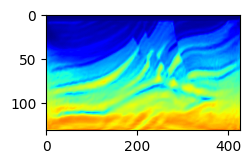

Epoch: 961 Loss:  -9.891883730888367 model_loss:  87763.6
Epoch: 962 Loss:  -9.89239251613617 model_loss:  87865.42
Epoch: 963 Loss:  -9.892783403396606 model_loss:  88128.3
Epoch: 964 Loss:  -9.89266949892044 model_loss:  87783.83
Epoch: 965 Loss:  -9.892584681510925 model_loss:  87519.195


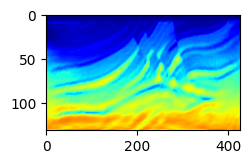

Epoch: 966 Loss:  -9.89249849319458 model_loss:  87360.93
Epoch: 967 Loss:  -9.892502188682556 model_loss:  87496.805
Epoch: 968 Loss:  -9.89250785112381 model_loss:  87749.69
Epoch: 969 Loss:  -9.892833828926086 model_loss:  88040.63
Epoch: 970 Loss:  -9.892654299736023 model_loss:  88000.11


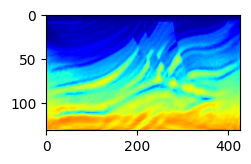

Epoch: 971 Loss:  -9.892688035964966 model_loss:  87793.88
Epoch: 972 Loss:  -9.892276108264923 model_loss:  87710.586
Epoch: 973 Loss:  -9.891949892044067 model_loss:  87664.85
Epoch: 974 Loss:  -9.892421245574951 model_loss:  87750.05
Epoch: 975 Loss:  -9.892667293548584 model_loss:  87834.15


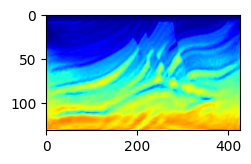

Epoch: 976 Loss:  -9.892711460590363 model_loss:  87759.55
Epoch: 977 Loss:  -9.892548084259033 model_loss:  87428.39
Epoch: 978 Loss:  -9.89240276813507 model_loss:  87174.875
Epoch: 979 Loss:  -9.892386317253113 model_loss:  87142.59
Epoch: 980 Loss:  -9.892710030078888 model_loss:  87353.71


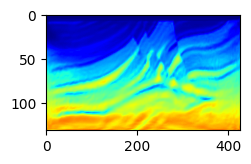

Epoch: 981 Loss:  -9.892858564853668 model_loss:  87348.99
Epoch: 982 Loss:  -9.892939805984497 model_loss:  87528.516
Epoch: 983 Loss:  -9.892721235752106 model_loss:  87634.53
Epoch: 984 Loss:  -9.892647862434387 model_loss:  87419.664
Epoch: 985 Loss:  -9.892538785934448 model_loss:  87377.73


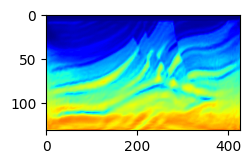

Epoch: 986 Loss:  -9.892347693443298 model_loss:  87386.08
Epoch: 987 Loss:  -9.89236694574356 model_loss:  87402.56
Epoch: 988 Loss:  -9.892312228679657 model_loss:  87425.59
Epoch: 989 Loss:  -9.89171439409256 model_loss:  87584.305
Epoch: 990 Loss:  -9.892068326473236 model_loss:  87611.266


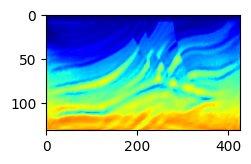

Epoch: 991 Loss:  -9.891589045524597 model_loss:  87640.65
Epoch: 992 Loss:  -9.89149385690689 model_loss:  87751.625
Epoch: 993 Loss:  -9.890590369701385 model_loss:  87604.66
Epoch: 994 Loss:  -9.89026403427124 model_loss:  87719.14
Epoch: 995 Loss:  -9.89039808511734 model_loss:  87784.69


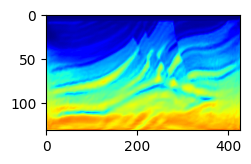

Epoch: 996 Loss:  -9.889488875865936 model_loss:  88096.04
Epoch: 997 Loss:  -9.888808965682983 model_loss:  88232.6
Epoch: 998 Loss:  -9.88810819387436 model_loss:  88189.164
Epoch: 999 Loss:  -9.887466609477997 model_loss:  88634.08
Epoch: 1000 Loss:  -9.912321507930756 model_loss:  85735.125


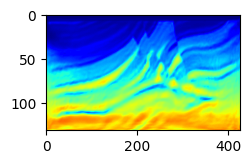

Epoch: 1001 Loss:  -9.91292256116867 model_loss:  85147.01
Epoch: 1002 Loss:  -9.913866341114044 model_loss:  84539.06
Epoch: 1003 Loss:  -9.913699328899384 model_loss:  83707.56
Epoch: 1004 Loss:  -9.913490235805511 model_loss:  83401.63
Epoch: 1005 Loss:  -9.914153277873993 model_loss:  83047.914


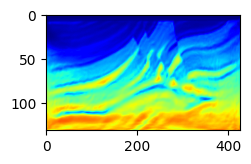

Epoch: 1006 Loss:  -9.914324164390564 model_loss:  82569.8
Epoch: 1007 Loss:  -9.914588034152985 model_loss:  82344.86
Epoch: 1008 Loss:  -9.914811789989471 model_loss:  82347.16
Epoch: 1009 Loss:  -9.915242850780487 model_loss:  82002.82
Epoch: 1010 Loss:  -9.91566514968872 model_loss:  81588.26


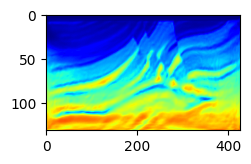

Epoch: 1011 Loss:  -9.91594672203064 model_loss:  81247.2
Epoch: 1012 Loss:  -9.916188776493073 model_loss:  80880.984
Epoch: 1013 Loss:  -9.916469514369965 model_loss:  80580.29
Epoch: 1014 Loss:  -9.916602671146393 model_loss:  80415.48
Epoch: 1015 Loss:  -9.916703999042511 model_loss:  80219.04


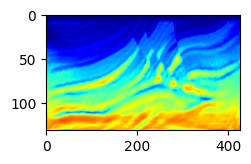

Epoch: 1016 Loss:  -9.916823506355286 model_loss:  79906.73
Epoch: 1017 Loss:  -9.916899621486664 model_loss:  79804.78
Epoch: 1018 Loss:  -9.916958093643188 model_loss:  79573.76
Epoch: 1019 Loss:  -9.916995763778687 model_loss:  79422.32
Epoch: 1020 Loss:  -9.917041599750519 model_loss:  79216.46


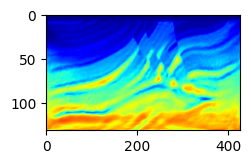

Epoch: 1021 Loss:  -9.917076647281647 model_loss:  79105.27
Epoch: 1022 Loss:  -9.917106449604034 model_loss:  78965.56
Epoch: 1023 Loss:  -9.917130887508392 model_loss:  78861.016
Epoch: 1024 Loss:  -9.917168021202087 model_loss:  78721.13
Epoch: 1025 Loss:  -9.917184352874756 model_loss:  78588.805


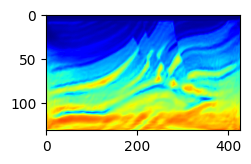

Epoch: 1026 Loss:  -9.917209565639496 model_loss:  78478.29
Epoch: 1027 Loss:  -9.91722697019577 model_loss:  78362.72
Epoch: 1028 Loss:  -9.917246043682098 model_loss:  78251.12
Epoch: 1029 Loss:  -9.917253494262695 model_loss:  78096.69
Epoch: 1030 Loss:  -9.917254328727722 model_loss:  77984.01


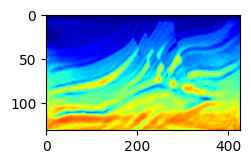

Epoch: 1031 Loss:  -9.917278945446014 model_loss:  77869.695
Epoch: 1032 Loss:  -9.917275309562683 model_loss:  77756.14
Epoch: 1033 Loss:  -9.917290806770325 model_loss:  77661.28
Epoch: 1034 Loss:  -9.917297601699829 model_loss:  77564.46
Epoch: 1035 Loss:  -9.917309403419495 model_loss:  77467.74


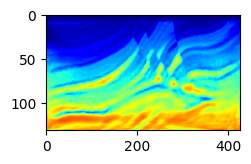

Epoch: 1036 Loss:  -9.917313277721405 model_loss:  77351.22
Epoch: 1037 Loss:  -9.917320311069489 model_loss:  77290.68
Epoch: 1038 Loss:  -9.917345404624939 model_loss:  77209.74
Epoch: 1039 Loss:  -9.917341947555542 model_loss:  77130.44
Epoch: 1040 Loss:  -9.917354106903076 model_loss:  77046.18


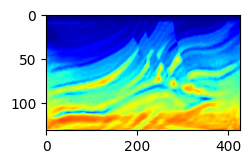

Epoch: 1041 Loss:  -9.917366325855255 model_loss:  76976.0
Epoch: 1042 Loss:  -9.917381584644318 model_loss:  76884.76
Epoch: 1043 Loss:  -9.917384386062622 model_loss:  76813.19
Epoch: 1044 Loss:  -9.917401313781738 model_loss:  76759.28
Epoch: 1045 Loss:  -9.917407631874084 model_loss:  76655.12


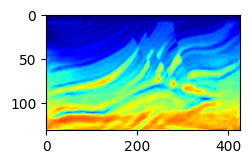

Epoch: 1046 Loss:  -9.917426645755768 model_loss:  76598.5
Epoch: 1047 Loss:  -9.917431712150574 model_loss:  76522.836
Epoch: 1048 Loss:  -9.917444705963135 model_loss:  76465.914
Epoch: 1049 Loss:  -9.917439997196198 model_loss:  76383.96
Epoch: 1050 Loss:  -9.917458295822144 model_loss:  76327.234


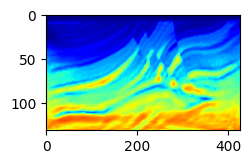

Epoch: 1051 Loss:  -9.91747111082077 model_loss:  76276.69
Epoch: 1052 Loss:  -9.91747897863388 model_loss:  76211.305
Epoch: 1053 Loss:  -9.91749131679535 model_loss:  76136.14
Epoch: 1054 Loss:  -9.917500257492065 model_loss:  76082.15
Epoch: 1055 Loss:  -9.917505502700806 model_loss:  76001.72


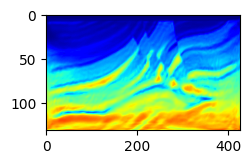

Epoch: 1056 Loss:  -9.917515873908997 model_loss:  75959.39
Epoch: 1057 Loss:  -9.917515754699707 model_loss:  75914.414
Epoch: 1058 Loss:  -9.917527973651886 model_loss:  75853.125
Epoch: 1059 Loss:  -9.917532980442047 model_loss:  75797.04
Epoch: 1060 Loss:  -9.91754549741745 model_loss:  75747.49


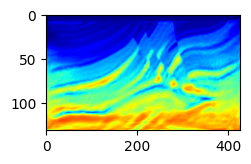

Epoch: 1061 Loss:  -9.917548060417175 model_loss:  75674.41
Epoch: 1062 Loss:  -9.917555451393127 model_loss:  75664.99
Epoch: 1063 Loss:  -9.917558133602142 model_loss:  75587.375
Epoch: 1064 Loss:  -9.917564272880554 model_loss:  75540.04
Epoch: 1065 Loss:  -9.91756409406662 model_loss:  75441.6


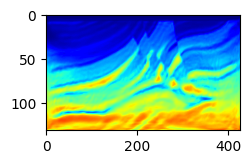

Epoch: 1066 Loss:  -9.917571306228638 model_loss:  75426.9
Epoch: 1067 Loss:  -9.917572021484375 model_loss:  75403.23
Epoch: 1068 Loss:  -9.917567253112793 model_loss:  75340.99
Epoch: 1069 Loss:  -9.917580008506775 model_loss:  75313.2
Epoch: 1070 Loss:  -9.917586207389832 model_loss:  75268.56


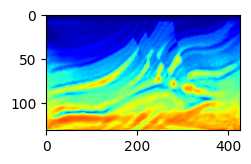

Epoch: 1071 Loss:  -9.917578518390656 model_loss:  75237.97
Epoch: 1072 Loss:  -9.917582988739014 model_loss:  75184.84
Epoch: 1073 Loss:  -9.917578935623169 model_loss:  75153.67
Epoch: 1074 Loss:  -9.917579352855682 model_loss:  75119.47
Epoch: 1075 Loss:  -9.917586863040924 model_loss:  75074.8


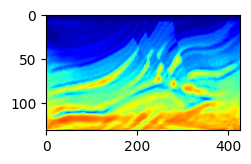

Epoch: 1076 Loss:  -9.91758930683136 model_loss:  75090.836
Epoch: 1077 Loss:  -9.917582750320435 model_loss:  75011.62
Epoch: 1078 Loss:  -9.917585134506226 model_loss:  74979.734
Epoch: 1079 Loss:  -9.917589962482452 model_loss:  74937.734
Epoch: 1080 Loss:  -9.917592883110046 model_loss:  74890.35


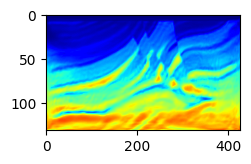

Epoch: 1081 Loss:  -9.917600452899933 model_loss:  74882.84
Epoch: 1082 Loss:  -9.917598605155945 model_loss:  74818.88
Epoch: 1083 Loss:  -9.9176065325737 model_loss:  74773.266
Epoch: 1084 Loss:  -9.917603731155396 model_loss:  74748.72
Epoch: 1085 Loss:  -9.917604744434357 model_loss:  74718.62


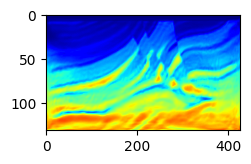

Epoch: 1086 Loss:  -9.917611479759216 model_loss:  74708.79
Epoch: 1087 Loss:  -9.917610824108124 model_loss:  74690.11
Epoch: 1088 Loss:  -9.917606949806213 model_loss:  74622.93
Epoch: 1089 Loss:  -9.917616844177246 model_loss:  74610.72
Epoch: 1090 Loss:  -9.91761463880539 model_loss:  74581.19


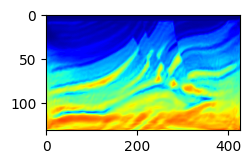

Epoch: 1091 Loss:  -9.917618453502655 model_loss:  74549.46
Epoch: 1092 Loss:  -9.917624950408936 model_loss:  74530.445
Epoch: 1093 Loss:  -9.917620480060577 model_loss:  74476.34
Epoch: 1094 Loss:  -9.917626559734344 model_loss:  74444.875
Epoch: 1095 Loss:  -9.917624413967133 model_loss:  74423.984


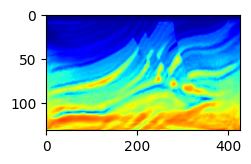

Epoch: 1096 Loss:  -9.917626798152924 model_loss:  74423.23
Epoch: 1097 Loss:  -9.917630314826965 model_loss:  74411.21
Epoch: 1098 Loss:  -9.917644381523132 model_loss:  74366.72
Epoch: 1099 Loss:  -9.917639553546906 model_loss:  74340.56
Epoch: 1100 Loss:  -9.917642652988434 model_loss:  74316.47


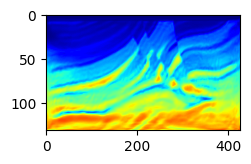

Epoch: 1101 Loss:  -9.917637169361115 model_loss:  74301.055
Epoch: 1102 Loss:  -9.917649865150452 model_loss:  74325.375
Epoch: 1103 Loss:  -9.917642533779144 model_loss:  74273.0
Epoch: 1104 Loss:  -9.91765296459198 model_loss:  74267.42
Epoch: 1105 Loss:  -9.917657434940338 model_loss:  74239.805


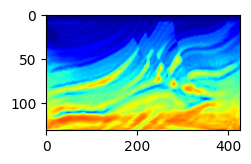

Epoch: 1106 Loss:  -9.917663633823395 model_loss:  74201.15
Epoch: 1107 Loss:  -9.917656660079956 model_loss:  74186.54
Epoch: 1108 Loss:  -9.917654991149902 model_loss:  74163.51
Epoch: 1109 Loss:  -9.917664349079132 model_loss:  74176.51
Epoch: 1110 Loss:  -9.917665779590607 model_loss:  74107.75


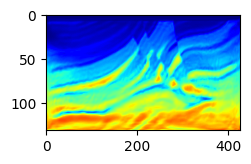

Epoch: 1111 Loss:  -9.917670726776123 model_loss:  74104.39
Epoch: 1112 Loss:  -9.917675971984863 model_loss:  74065.32
Epoch: 1113 Loss:  -9.917672455310822 model_loss:  74030.26
Epoch: 1114 Loss:  -9.917684674263 model_loss:  74052.05
Epoch: 1115 Loss:  -9.917681753635406 model_loss:  74031.58


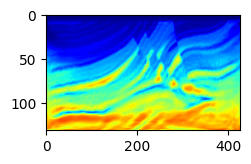

Epoch: 1116 Loss:  -9.917697668075562 model_loss:  74037.89
Epoch: 1117 Loss:  -9.917700946331024 model_loss:  74024.31
Epoch: 1118 Loss:  -9.917708933353424 model_loss:  73996.23
Epoch: 1119 Loss:  -9.917709708213806 model_loss:  73988.19
Epoch: 1120 Loss:  -9.917728066444397 model_loss:  74016.31


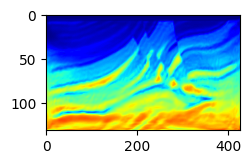

Epoch: 1121 Loss:  -9.917732059955597 model_loss:  74038.8
Epoch: 1122 Loss:  -9.917735576629639 model_loss:  73991.4
Epoch: 1123 Loss:  -9.917747259140015 model_loss:  73975.99
Epoch: 1124 Loss:  -9.917751848697662 model_loss:  73978.91
Epoch: 1125 Loss:  -9.917771458625793 model_loss:  74006.8


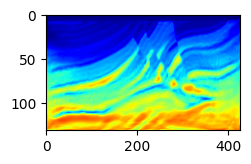

Epoch: 1126 Loss:  -9.917759716510773 model_loss:  73921.81
Epoch: 1127 Loss:  -9.917777299880981 model_loss:  73925.82
Epoch: 1128 Loss:  -9.917782843112946 model_loss:  73882.6
Epoch: 1129 Loss:  -9.917800188064575 model_loss:  73874.766
Epoch: 1130 Loss:  -9.917795479297638 model_loss:  73843.7


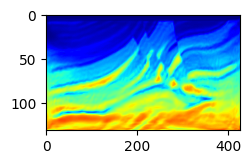

Epoch: 1131 Loss:  -9.917801797389984 model_loss:  73810.21
Epoch: 1132 Loss:  -9.91780298948288 model_loss:  73784.36
Epoch: 1133 Loss:  -9.91782021522522 model_loss:  73792.945
Epoch: 1134 Loss:  -9.91782557964325 model_loss:  73756.836
Epoch: 1135 Loss:  -9.917834520339966 model_loss:  73756.484


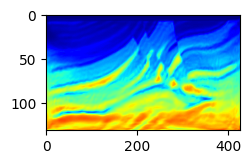

Epoch: 1136 Loss:  -9.917831599712372 model_loss:  73709.12
Epoch: 1137 Loss:  -9.91783195734024 model_loss:  73671.19
Epoch: 1138 Loss:  -9.917847573757172 model_loss:  73700.49
Epoch: 1139 Loss:  -9.917859315872192 model_loss:  73726.32
Epoch: 1140 Loss:  -9.917862296104431 model_loss:  73682.39


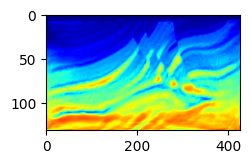

Epoch: 1141 Loss:  -9.91788238286972 model_loss:  73635.07
Epoch: 1142 Loss:  -9.91787874698639 model_loss:  73603.93
Epoch: 1143 Loss:  -9.917882800102234 model_loss:  73638.375
Epoch: 1144 Loss:  -9.917884171009064 model_loss:  73652.63
Epoch: 1145 Loss:  -9.917905151844025 model_loss:  73682.98


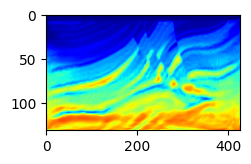

Epoch: 1146 Loss:  -9.917892158031464 model_loss:  73659.766
Epoch: 1147 Loss:  -9.917889833450317 model_loss:  73622.24
Epoch: 1148 Loss:  -9.917893469333649 model_loss:  73580.08
Epoch: 1149 Loss:  -9.917896568775177 model_loss:  73561.09
Epoch: 1150 Loss:  -9.917889535427094 model_loss:  73577.14


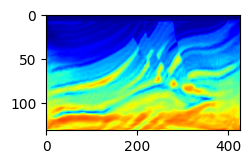

Epoch: 1151 Loss:  -9.917892038822174 model_loss:  73577.38
Epoch: 1152 Loss:  -9.917899668216705 model_loss:  73525.22
Epoch: 1153 Loss:  -9.91788238286972 model_loss:  73516.89
Epoch: 1154 Loss:  -9.917871296405792 model_loss:  73503.336
Epoch: 1155 Loss:  -9.91786903142929 model_loss:  73427.01


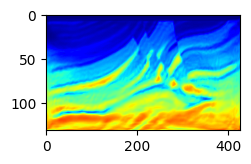

Epoch: 1156 Loss:  -9.917857468128204 model_loss:  73468.27
Epoch: 1157 Loss:  -9.917874455451965 model_loss:  73442.016
Epoch: 1158 Loss:  -9.917866170406342 model_loss:  73447.375
Epoch: 1159 Loss:  -9.917880237102509 model_loss:  73435.945
Epoch: 1160 Loss:  -9.917870938777924 model_loss:  73393.16


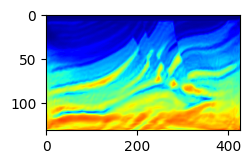

Epoch: 1161 Loss:  -9.917858719825745 model_loss:  73375.805
Epoch: 1162 Loss:  -9.917865455150604 model_loss:  73302.12
Epoch: 1163 Loss:  -9.917846262454987 model_loss:  73353.8
Epoch: 1164 Loss:  -9.917880296707153 model_loss:  73359.53
Epoch: 1165 Loss:  -9.917860925197601 model_loss:  73351.375


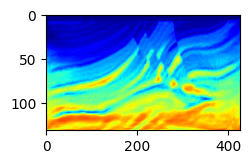

Epoch: 1166 Loss:  -9.91788387298584 model_loss:  73267.336
Epoch: 1167 Loss:  -9.91787874698639 model_loss:  73294.02
Epoch: 1168 Loss:  -9.917839467525482 model_loss:  73289.7
Epoch: 1169 Loss:  -9.917883157730103 model_loss:  73231.516
Epoch: 1170 Loss:  -9.91784417629242 model_loss:  73260.22


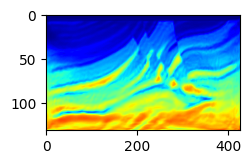

Epoch: 1171 Loss:  -9.91785192489624 model_loss:  73218.76
Epoch: 1172 Loss:  -9.917871415615082 model_loss:  73186.47
Epoch: 1173 Loss:  -9.917825937271118 model_loss:  73225.48
Epoch: 1174 Loss:  -9.917845785617828 model_loss:  73180.83
Epoch: 1175 Loss:  -9.917832851409912 model_loss:  73155.266


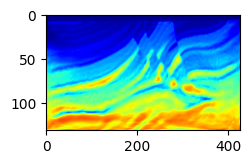

Epoch: 1176 Loss:  -9.9178386926651 model_loss:  73104.23
Epoch: 1177 Loss:  -9.917819499969482 model_loss:  73165.016
Epoch: 1178 Loss:  -9.917815625667572 model_loss:  73125.39
Epoch: 1179 Loss:  -9.917839646339417 model_loss:  73111.45
Epoch: 1180 Loss:  -9.917841076850891 model_loss:  73077.47


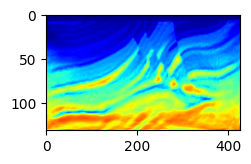

Epoch: 1181 Loss:  -9.9178227186203 model_loss:  73079.37
Epoch: 1182 Loss:  -9.917828142642975 model_loss:  73044.75
Epoch: 1183 Loss:  -9.917806923389435 model_loss:  73036.625
Epoch: 1184 Loss:  -9.917808890342712 model_loss:  73017.77
Epoch: 1185 Loss:  -9.917823314666748 model_loss:  73063.36


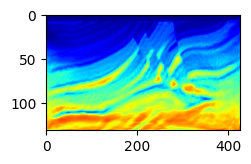

Epoch: 1186 Loss:  -9.917839705944061 model_loss:  73028.61
Epoch: 1187 Loss:  -9.917843163013458 model_loss:  73039.56
Epoch: 1188 Loss:  -9.917888164520264 model_loss:  72914.19
Epoch: 1189 Loss:  -9.917856395244598 model_loss:  72988.23
Epoch: 1190 Loss:  -9.917888402938843 model_loss:  72975.17


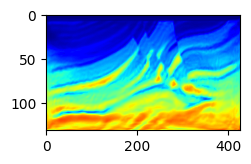

Epoch: 1191 Loss:  -9.917834460735321 model_loss:  73031.21
Epoch: 1192 Loss:  -9.917899072170258 model_loss:  73007.88
Epoch: 1193 Loss:  -9.917816877365112 model_loss:  72981.85
Epoch: 1194 Loss:  -9.917920351028442 model_loss:  72933.016
Epoch: 1195 Loss:  -9.917852461338043 model_loss:  72972.09


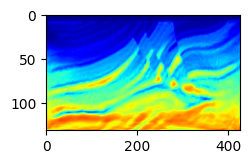

Epoch: 1196 Loss:  -9.917943835258484 model_loss:  72916.53
Epoch: 1197 Loss:  -9.91787475347519 model_loss:  72987.87
Epoch: 1198 Loss:  -9.917926549911499 model_loss:  72938.39
Epoch: 1199 Loss:  -9.917862832546234 model_loss:  72960.86
Epoch: 1200 Loss:  -9.91791307926178 model_loss:  72904.58


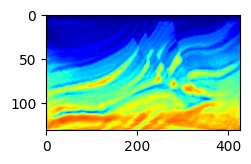

Epoch: 1201 Loss:  -9.917855143547058 model_loss:  72921.46
Epoch: 1202 Loss:  -9.91787326335907 model_loss:  72934.25
Epoch: 1203 Loss:  -9.9178147315979 model_loss:  72937.305
Epoch: 1204 Loss:  -9.917844653129578 model_loss:  72934.37
Epoch: 1205 Loss:  -9.917795300483704 model_loss:  72929.44


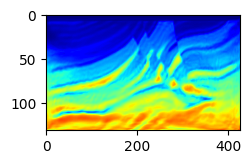

Epoch: 1206 Loss:  -9.917885184288025 model_loss:  72835.82
Epoch: 1207 Loss:  -9.917834162712097 model_loss:  72849.92
Epoch: 1208 Loss:  -9.917873620986938 model_loss:  72834.945
Epoch: 1209 Loss:  -9.917825996875763 model_loss:  72857.35
Epoch: 1210 Loss:  -9.917823314666748 model_loss:  72841.41


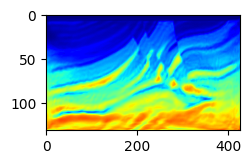

Epoch: 1211 Loss:  -9.917760610580444 model_loss:  72865.21
Epoch: 1212 Loss:  -9.91777104139328 model_loss:  72866.53
Epoch: 1213 Loss:  -9.917669534683228 model_loss:  72862.95
Epoch: 1214 Loss:  -9.917708694934845 model_loss:  72796.43
Epoch: 1215 Loss:  -9.917645156383514 model_loss:  72864.38


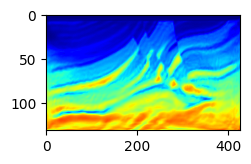

Epoch: 1216 Loss:  -9.917722582817078 model_loss:  72836.91
Epoch: 1217 Loss:  -9.917700707912445 model_loss:  72821.59
Epoch: 1218 Loss:  -9.917779505252838 model_loss:  72782.56
Epoch: 1219 Loss:  -9.917795062065125 model_loss:  72796.984
Epoch: 1220 Loss:  -9.917793691158295 model_loss:  72774.984


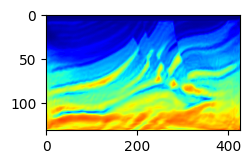

Epoch: 1221 Loss:  -9.917744636535645 model_loss:  72801.86
Epoch: 1222 Loss:  -9.917807281017303 model_loss:  72748.78
Epoch: 1223 Loss:  -9.917700409889221 model_loss:  72790.03
Epoch: 1224 Loss:  -9.917730927467346 model_loss:  72748.055
Epoch: 1225 Loss:  -9.917618453502655 model_loss:  72695.01


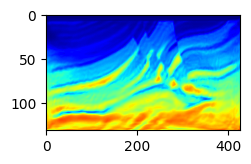

Epoch: 1226 Loss:  -9.917830169200897 model_loss:  72621.9
Epoch: 1227 Loss:  -9.917873501777649 model_loss:  72676.414
Epoch: 1228 Loss:  -9.917925417423248 model_loss:  72681.07
Epoch: 1229 Loss:  -9.917819738388062 model_loss:  72757.52
Epoch: 1230 Loss:  -9.917951166629791 model_loss:  72701.69


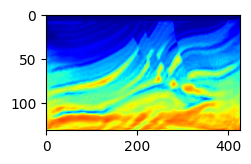

Epoch: 1231 Loss:  -9.917885482311249 model_loss:  72677.4
Epoch: 1232 Loss:  -9.91781884431839 model_loss:  72720.81
Epoch: 1233 Loss:  -9.917899012565613 model_loss:  72630.375
Epoch: 1234 Loss:  -9.917819678783417 model_loss:  72718.016
Epoch: 1235 Loss:  -9.917862057685852 model_loss:  72685.33


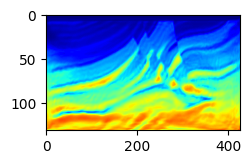

Epoch: 1236 Loss:  -9.917945086956024 model_loss:  72620.56
Epoch: 1237 Loss:  -9.917948842048645 model_loss:  72641.13
Epoch: 1238 Loss:  -9.917965054512024 model_loss:  72638.734
Epoch: 1239 Loss:  -9.917971849441528 model_loss:  72698.734
Epoch: 1240 Loss:  -9.91795027256012 model_loss:  72708.164


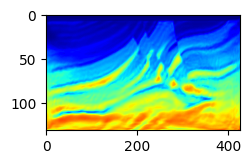

Epoch: 1241 Loss:  -9.917973279953003 model_loss:  72729.875
Epoch: 1242 Loss:  -9.917902410030365 model_loss:  72776.69
Epoch: 1243 Loss:  -9.917850196361542 model_loss:  72774.375
Epoch: 1244 Loss:  -9.9178786277771 model_loss:  72688.29
Epoch: 1245 Loss:  -9.917918264865875 model_loss:  72646.445


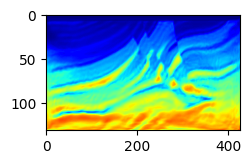

Epoch: 1246 Loss:  -9.917941331863403 model_loss:  72667.18
Epoch: 1247 Loss:  -9.917969942092896 model_loss:  72698.125
Epoch: 1248 Loss:  -9.917986392974854 model_loss:  72694.93
Epoch: 1249 Loss:  -9.918009042739868 model_loss:  72661.22
Epoch: 1250 Loss:  -9.918006777763367 model_loss:  72661.68


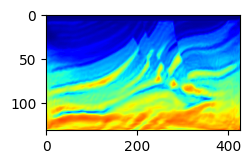

Epoch: 1251 Loss:  -9.917998731136322 model_loss:  72703.62
Epoch: 1252 Loss:  -9.91796863079071 model_loss:  72621.13
Epoch: 1253 Loss:  -9.917974054813385 model_loss:  72594.91
Epoch: 1254 Loss:  -9.917916417121887 model_loss:  72612.766
Epoch: 1255 Loss:  -9.917981147766113 model_loss:  72521.97


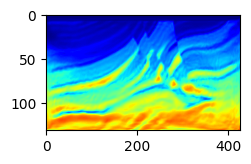

Epoch: 1256 Loss:  -9.91793543100357 model_loss:  72660.94
Epoch: 1257 Loss:  -9.917972445487976 model_loss:  72599.52
Epoch: 1258 Loss:  -9.917945206165314 model_loss:  72678.85
Epoch: 1259 Loss:  -9.917994141578674 model_loss:  72533.46
Epoch: 1260 Loss:  -9.917700111865997 model_loss:  72572.26


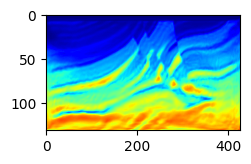

Epoch: 1261 Loss:  -9.918023228645325 model_loss:  72611.15
Epoch: 1262 Loss:  -9.917736828327179 model_loss:  72694.44
Epoch: 1263 Loss:  -9.917973697185516 model_loss:  72569.09
Epoch: 1264 Loss:  -9.917468130588531 model_loss:  72707.46
Epoch: 1265 Loss:  -9.917910814285278 model_loss:  72526.94


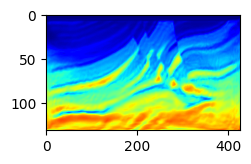

Epoch: 1266 Loss:  -9.91739571094513 model_loss:  72681.766
Epoch: 1267 Loss:  -9.917865097522736 model_loss:  72400.41
Epoch: 1268 Loss:  -9.917427837848663 model_loss:  72736.26
Epoch: 1269 Loss:  -9.917861342430115 model_loss:  72302.0
Epoch: 1270 Loss:  -9.917463421821594 model_loss:  72626.05


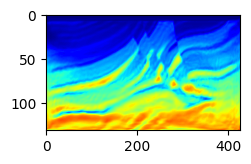

Epoch: 1271 Loss:  -9.917822897434235 model_loss:  72235.72
Epoch: 1272 Loss:  -9.917480945587158 model_loss:  72669.37
Epoch: 1273 Loss:  -9.91786813735962 model_loss:  72276.63
Epoch: 1274 Loss:  -9.917531609535217 model_loss:  72663.445
Epoch: 1275 Loss:  -9.91785043478012 model_loss:  72369.88


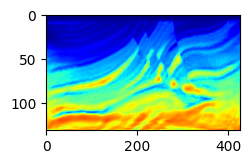

Epoch: 1276 Loss:  -9.917392373085022 model_loss:  72641.07
Epoch: 1277 Loss:  -9.91786390542984 model_loss:  72489.71
Epoch: 1278 Loss:  -9.917325139045715 model_loss:  72615.2
Epoch: 1279 Loss:  -9.917862057685852 model_loss:  72520.51
Epoch: 1280 Loss:  -9.917372405529022 model_loss:  72683.51


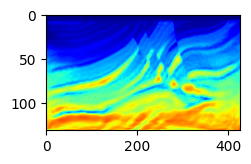

Epoch: 1281 Loss:  -9.917864441871643 model_loss:  72614.0
Epoch: 1282 Loss:  -9.917326092720032 model_loss:  72689.336
Epoch: 1283 Loss:  -9.917797863483429 model_loss:  72662.03
Epoch: 1284 Loss:  -9.917351365089417 model_loss:  72691.8
Epoch: 1285 Loss:  -9.917721688747406 model_loss:  72662.125


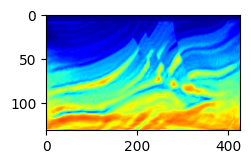

Epoch: 1286 Loss:  -9.917611718177795 model_loss:  72458.836
Epoch: 1287 Loss:  -9.917784750461578 model_loss:  72486.3
Epoch: 1288 Loss:  -9.917592167854309 model_loss:  72431.62
Epoch: 1289 Loss:  -9.917786657810211 model_loss:  72409.39
Epoch: 1290 Loss:  -9.917751967906952 model_loss:  72388.47


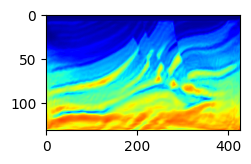

Epoch: 1291 Loss:  -9.917826116085052 model_loss:  72420.59
Epoch: 1292 Loss:  -9.917719542980194 model_loss:  72430.555
Epoch: 1293 Loss:  -9.917828679084778 model_loss:  72433.54
Epoch: 1294 Loss:  -9.91776704788208 model_loss:  72506.484
Epoch: 1295 Loss:  -9.917814373970032 model_loss:  72426.83


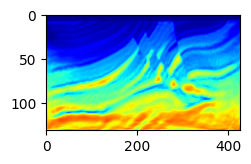

Epoch: 1296 Loss:  -9.91777104139328 model_loss:  72512.87
Epoch: 1297 Loss:  -9.917862176895142 model_loss:  72472.69
Epoch: 1298 Loss:  -9.917872428894043 model_loss:  72507.48
Epoch: 1299 Loss:  -9.917868375778198 model_loss:  72503.234
Epoch: 1300 Loss:  -9.917809128761292 model_loss:  72513.44


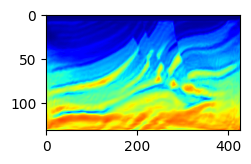

Epoch: 1301 Loss:  -9.917788028717041 model_loss:  72498.234
Epoch: 1302 Loss:  -9.917703807353973 model_loss:  72560.2
Epoch: 1303 Loss:  -9.91773670911789 model_loss:  72529.71
Epoch: 1304 Loss:  -9.917722940444946 model_loss:  72533.22
Epoch: 1305 Loss:  -9.917813897132874 model_loss:  72404.9


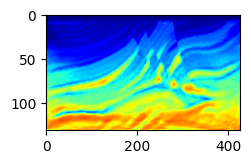

Epoch: 1306 Loss:  -9.917823553085327 model_loss:  72394.81
Epoch: 1307 Loss:  -9.917800068855286 model_loss:  72448.88
Epoch: 1308 Loss:  -9.917808473110199 model_loss:  72518.03
Epoch: 1309 Loss:  -9.917793691158295 model_loss:  72484.13
Epoch: 1310 Loss:  -9.917854130268097 model_loss:  72556.14


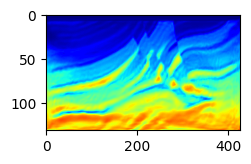

Epoch: 1311 Loss:  -9.917818069458008 model_loss:  72624.484
Epoch: 1312 Loss:  -9.91783094406128 model_loss:  72677.68
Epoch: 1313 Loss:  -9.91785728931427 model_loss:  72636.36
Epoch: 1314 Loss:  -9.917821645736694 model_loss:  72619.75
Epoch: 1315 Loss:  -9.91783356666565 model_loss:  72598.086


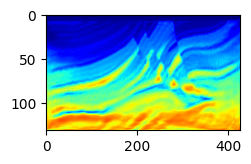

Epoch: 1316 Loss:  -9.917831242084503 model_loss:  72586.266
Epoch: 1317 Loss:  -9.917817950248718 model_loss:  72614.25
Epoch: 1318 Loss:  -9.917818009853363 model_loss:  72628.82
Epoch: 1319 Loss:  -9.917790949344635 model_loss:  72601.6
Epoch: 1320 Loss:  -9.917719304561615 model_loss:  72562.195


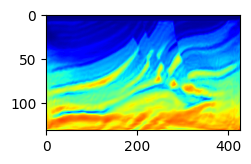

Epoch: 1321 Loss:  -9.917621493339539 model_loss:  72592.24
Epoch: 1322 Loss:  -9.917669713497162 model_loss:  72602.95
Epoch: 1323 Loss:  -9.917627096176147 model_loss:  72625.76
Epoch: 1324 Loss:  -9.917561173439026 model_loss:  72696.63
Epoch: 1325 Loss:  -9.917594373226166 model_loss:  72590.086


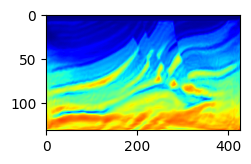

Epoch: 1326 Loss:  -9.917603850364685 model_loss:  72616.9
Epoch: 1327 Loss:  -9.91757470369339 model_loss:  72703.28
Epoch: 1328 Loss:  -9.917493879795074 model_loss:  72804.77
Epoch: 1329 Loss:  -9.917619049549103 model_loss:  72755.87
Epoch: 1330 Loss:  -9.917666971683502 model_loss:  72707.03


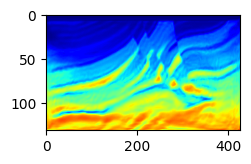

Epoch: 1331 Loss:  -9.917729556560516 model_loss:  72649.74
Epoch: 1332 Loss:  -9.917710363864899 model_loss:  72605.23
Epoch: 1333 Loss:  -9.917833387851715 model_loss:  72506.08
Epoch: 1334 Loss:  -9.917870223522186 model_loss:  72491.51
Epoch: 1335 Loss:  -9.917865991592407 model_loss:  72384.195


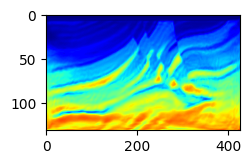

Epoch: 1336 Loss:  -9.917864382266998 model_loss:  72444.766
Epoch: 1337 Loss:  -9.91787338256836 model_loss:  72410.92
Epoch: 1338 Loss:  -9.917937874794006 model_loss:  72449.11
Epoch: 1339 Loss:  -9.91790235042572 model_loss:  72527.0
Epoch: 1340 Loss:  -9.917875289916992 model_loss:  72531.945


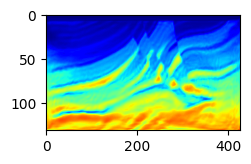

Epoch: 1341 Loss:  -9.917924761772156 model_loss:  72570.68
Epoch: 1342 Loss:  -9.917915165424347 model_loss:  72645.98
Epoch: 1343 Loss:  -9.917950570583344 model_loss:  72686.11
Epoch: 1344 Loss:  -9.917955100536346 model_loss:  72723.39
Epoch: 1345 Loss:  -9.917931079864502 model_loss:  72758.07


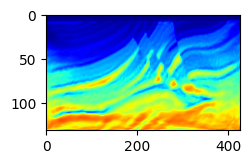

Epoch: 1346 Loss:  -9.917943179607391 model_loss:  72709.836
Epoch: 1347 Loss:  -9.91795527935028 model_loss:  72614.88
Epoch: 1348 Loss:  -9.917988359928131 model_loss:  72585.96
Epoch: 1349 Loss:  -9.91801631450653 model_loss:  72506.375
Epoch: 1350 Loss:  -9.918068289756775 model_loss:  72386.28


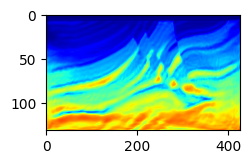

Epoch: 1351 Loss:  -9.918114423751831 model_loss:  72294.42
Epoch: 1352 Loss:  -9.918149411678314 model_loss:  72136.6
Epoch: 1353 Loss:  -9.918179333209991 model_loss:  72111.766
Epoch: 1354 Loss:  -9.918192565441132 model_loss:  72022.02
Epoch: 1355 Loss:  -9.918210923671722 model_loss:  72025.66


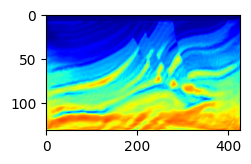

Epoch: 1356 Loss:  -9.918233871459961 model_loss:  71940.63
Epoch: 1357 Loss:  -9.918252885341644 model_loss:  71965.54
Epoch: 1358 Loss:  -9.918254852294922 model_loss:  71947.766
Epoch: 1359 Loss:  -9.918290138244629 model_loss:  71952.71
Epoch: 1360 Loss:  -9.91828840970993 model_loss:  71986.6


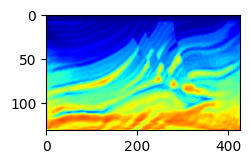

Epoch: 1361 Loss:  -9.918313324451447 model_loss:  71960.695
Epoch: 1362 Loss:  -9.918321192264557 model_loss:  71954.53
Epoch: 1363 Loss:  -9.918320894241333 model_loss:  71978.39
Epoch: 1364 Loss:  -9.918281376361847 model_loss:  72008.055
Epoch: 1365 Loss:  -9.91830861568451 model_loss:  71948.86


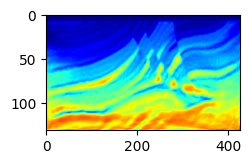

Epoch: 1366 Loss:  -9.918353080749512 model_loss:  71993.164
Epoch: 1367 Loss:  -9.918216049671173 model_loss:  72016.125
Epoch: 1368 Loss:  -9.918258607387543 model_loss:  71990.06
Epoch: 1369 Loss:  -9.918290913105011 model_loss:  71911.336
Epoch: 1370 Loss:  -9.91831922531128 model_loss:  71909.375


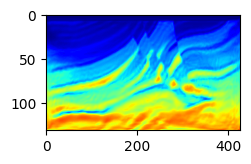

Epoch: 1371 Loss:  -9.918308198451996 model_loss:  71921.62
Epoch: 1372 Loss:  -9.918267369270325 model_loss:  71923.125
Epoch: 1373 Loss:  -9.918142974376678 model_loss:  71998.88
Epoch: 1374 Loss:  -9.918144285678864 model_loss:  71972.086
Epoch: 1375 Loss:  -9.918005168437958 model_loss:  72006.34


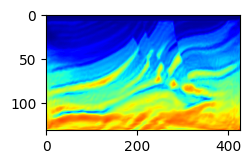

Epoch: 1376 Loss:  -9.918149828910828 model_loss:  71898.09
Epoch: 1377 Loss:  -9.918076038360596 model_loss:  71914.305
Epoch: 1378 Loss:  -9.918037176132202 model_loss:  71911.91
Epoch: 1379 Loss:  -9.917766511440277 model_loss:  72001.445
Epoch: 1380 Loss:  -9.917690932750702 model_loss:  72099.38


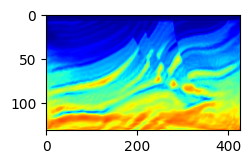

Epoch: 1381 Loss:  -9.917799532413483 model_loss:  72135.625
Epoch: 1382 Loss:  -9.917981386184692 model_loss:  72037.81
Epoch: 1383 Loss:  -9.918074011802673 model_loss:  71924.234
Epoch: 1384 Loss:  -9.917982697486877 model_loss:  71960.17
Epoch: 1385 Loss:  -9.917860805988312 model_loss:  72011.05


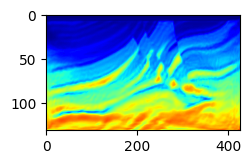

Epoch: 1386 Loss:  -9.91773408651352 model_loss:  71989.8
Epoch: 1387 Loss:  -9.917862355709076 model_loss:  71936.91
Epoch: 1388 Loss:  -9.917949914932251 model_loss:  71758.305
Epoch: 1389 Loss:  -9.917954504489899 model_loss:  71841.03
Epoch: 1390 Loss:  -9.918018519878387 model_loss:  71778.6


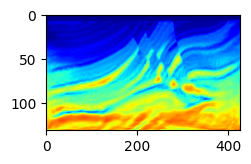

Epoch: 1391 Loss:  -9.918101370334625 model_loss:  71748.914
Epoch: 1392 Loss:  -9.918116450309753 model_loss:  71888.734
Epoch: 1393 Loss:  -9.918099462985992 model_loss:  71986.945
Epoch: 1394 Loss:  -9.918108880519867 model_loss:  71972.43
Epoch: 1395 Loss:  -9.918123126029968 model_loss:  72009.91


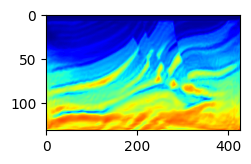

Epoch: 1396 Loss:  -9.918116748332977 model_loss:  72072.62
Epoch: 1397 Loss:  -9.918159186840057 model_loss:  72121.28
Epoch: 1398 Loss:  -9.918155431747437 model_loss:  72173.23
Epoch: 1399 Loss:  -9.918164312839508 model_loss:  72193.12
Epoch: 1400 Loss:  -9.918176054954529 model_loss:  72243.41


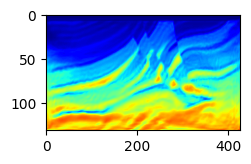

Epoch: 1401 Loss:  -9.918213605880737 model_loss:  72311.09
Epoch: 1402 Loss:  -9.918270766735077 model_loss:  72359.66
Epoch: 1403 Loss:  -9.918332874774933 model_loss:  72359.195
Epoch: 1404 Loss:  -9.918241083621979 model_loss:  72341.11
Epoch: 1405 Loss:  -9.918356359004974 model_loss:  72227.45


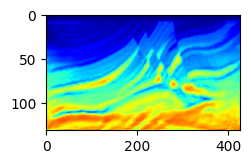

Epoch: 1406 Loss:  -9.918147146701813 model_loss:  72168.12
Epoch: 1407 Loss:  -9.918244183063507 model_loss:  72145.53
Epoch: 1408 Loss:  -9.918190658092499 model_loss:  72087.57
Epoch: 1409 Loss:  -9.91810929775238 model_loss:  72002.125
Epoch: 1410 Loss:  -9.918221712112427 model_loss:  71931.336


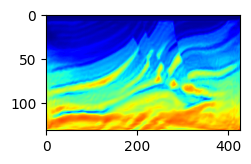

Epoch: 1411 Loss:  -9.918226659297943 model_loss:  71967.875
Epoch: 1412 Loss:  -9.918189406394958 model_loss:  71938.22
Epoch: 1413 Loss:  -9.918242692947388 model_loss:  71957.69
Epoch: 1414 Loss:  -9.91822373867035 model_loss:  71973.92
Epoch: 1415 Loss:  -9.918081402778625 model_loss:  72081.17


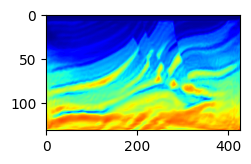

Epoch: 1416 Loss:  -9.918205618858337 model_loss:  72053.13
Epoch: 1417 Loss:  -9.917920887470245 model_loss:  72170.945
Epoch: 1418 Loss:  -9.918134212493896 model_loss:  72127.53
Epoch: 1419 Loss:  -9.91776329278946 model_loss:  72255.43
Epoch: 1420 Loss:  -9.91774719953537 model_loss:  72271.21


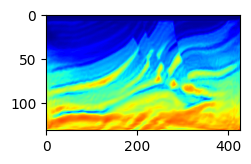

Epoch: 1421 Loss:  -9.917618155479431 model_loss:  72369.72
Epoch: 1422 Loss:  -9.917886316776276 model_loss:  72268.02
Epoch: 1423 Loss:  -9.91795951128006 model_loss:  72237.61
Epoch: 1424 Loss:  -9.917962074279785 model_loss:  72230.75
Epoch: 1425 Loss:  -9.917747974395752 model_loss:  72191.34


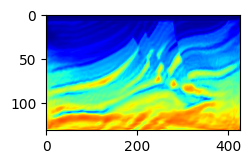

Epoch: 1426 Loss:  -9.917836785316467 model_loss:  72227.99
Epoch: 1427 Loss:  -9.917821645736694 model_loss:  72219.23
Epoch: 1428 Loss:  -9.917858481407166 model_loss:  72120.52
Epoch: 1429 Loss:  -9.917606055736542 model_loss:  72056.23
Epoch: 1430 Loss:  -9.917641282081604 model_loss:  72033.88


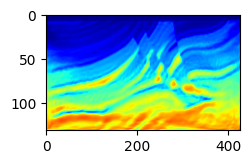

Epoch: 1431 Loss:  -9.917612254619598 model_loss:  71981.3
Epoch: 1432 Loss:  -9.917854070663452 model_loss:  71903.83
Epoch: 1433 Loss:  -9.917877733707428 model_loss:  71990.016
Epoch: 1434 Loss:  -9.91795265674591 model_loss:  72067.29
Epoch: 1435 Loss:  -9.918034970760345 model_loss:  72035.16


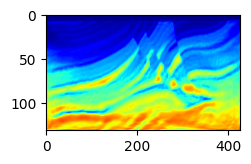

Epoch: 1436 Loss:  -9.918081760406494 model_loss:  72158.125
Epoch: 1437 Loss:  -9.918130874633789 model_loss:  72168.2
Epoch: 1438 Loss:  -9.9180708527565 model_loss:  72361.31
Epoch: 1439 Loss:  -9.918073534965515 model_loss:  72295.35
Epoch: 1440 Loss:  -9.917982161045074 model_loss:  72463.586


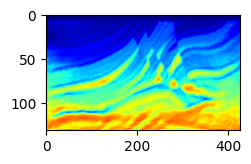

Epoch: 1441 Loss:  -9.917962849140167 model_loss:  72481.99
Epoch: 1442 Loss:  -9.917904078960419 model_loss:  72556.234
Epoch: 1443 Loss:  -9.917909443378448 model_loss:  72448.57
Epoch: 1444 Loss:  -9.917833149433136 model_loss:  72487.29
Epoch: 1445 Loss:  -9.917815804481506 model_loss:  72362.18


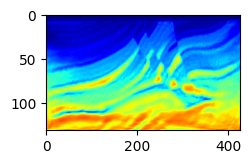

Epoch: 1446 Loss:  -9.91784155368805 model_loss:  72360.31
Epoch: 1447 Loss:  -9.917795300483704 model_loss:  72277.69
Epoch: 1448 Loss:  -9.917781412601471 model_loss:  72347.58
Epoch: 1449 Loss:  -9.917782664299011 model_loss:  72232.08
Epoch: 1450 Loss:  -9.917836308479309 model_loss:  72204.61


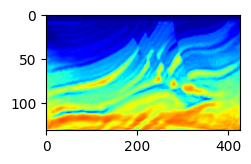

Epoch: 1451 Loss:  -9.91781634092331 model_loss:  72201.41
Epoch: 1452 Loss:  -9.917885959148407 model_loss:  72324.4
Epoch: 1453 Loss:  -9.918016135692596 model_loss:  72188.73
Epoch: 1454 Loss:  -9.918073952198029 model_loss:  72300.125
Epoch: 1455 Loss:  -9.91810667514801 model_loss:  72291.24


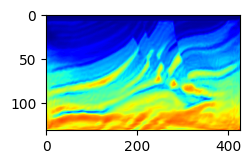

Epoch: 1456 Loss:  -9.918175041675568 model_loss:  72273.234
Epoch: 1457 Loss:  -9.918257892131805 model_loss:  72313.22
Epoch: 1458 Loss:  -9.918275594711304 model_loss:  72347.77
Epoch: 1459 Loss:  -9.918310642242432 model_loss:  72233.37
Epoch: 1460 Loss:  -9.91834682226181 model_loss:  72178.36


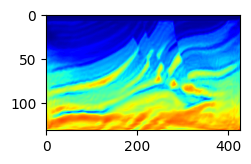

Epoch: 1461 Loss:  -9.918360888957977 model_loss:  72229.46
Epoch: 1462 Loss:  -9.91836702823639 model_loss:  72275.61
Epoch: 1463 Loss:  -9.91837602853775 model_loss:  72251.11
Epoch: 1464 Loss:  -9.918388903141022 model_loss:  72291.08
Epoch: 1465 Loss:  -9.918345391750336 model_loss:  72310.68


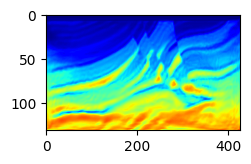

Epoch: 1466 Loss:  -9.918362498283386 model_loss:  72316.664
Epoch: 1467 Loss:  -9.918340861797333 model_loss:  72338.766
Epoch: 1468 Loss:  -9.918342411518097 model_loss:  72336.04
Epoch: 1469 Loss:  -9.918352901935577 model_loss:  72330.164
Epoch: 1470 Loss:  -9.918361902236938 model_loss:  72364.96


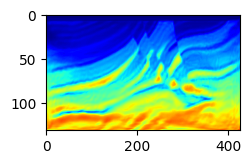

Epoch: 1471 Loss:  -9.918329060077667 model_loss:  72374.56
Epoch: 1472 Loss:  -9.918366491794586 model_loss:  72308.69
Epoch: 1473 Loss:  -9.918289005756378 model_loss:  72387.61
Epoch: 1474 Loss:  -9.918308138847351 model_loss:  72388.11
Epoch: 1475 Loss:  -9.918155431747437 model_loss:  72341.9


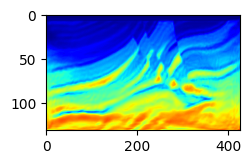

Epoch: 1476 Loss:  -9.918287098407745 model_loss:  72290.94
Epoch: 1477 Loss:  -9.918119430541992 model_loss:  72305.57
Epoch: 1478 Loss:  -9.918252825737 model_loss:  72208.766
Epoch: 1479 Loss:  -9.918220818042755 model_loss:  72234.27
Epoch: 1480 Loss:  -9.91834706068039 model_loss:  72269.234


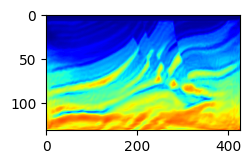

Epoch: 1481 Loss:  -9.91823548078537 model_loss:  72297.336
Epoch: 1482 Loss:  -9.918382942676544 model_loss:  72171.92
Epoch: 1483 Loss:  -9.918286442756653 model_loss:  72193.44
Epoch: 1484 Loss:  -9.918366193771362 model_loss:  72190.83
Epoch: 1485 Loss:  -9.918254315853119 model_loss:  72182.23


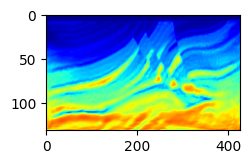

Epoch: 1486 Loss:  -9.918338298797607 model_loss:  72141.82
Epoch: 1487 Loss:  -9.918185889720917 model_loss:  72070.57
Epoch: 1488 Loss:  -9.918318629264832 model_loss:  72040.88
Epoch: 1489 Loss:  -9.91810005903244 model_loss:  72044.33
Epoch: 1490 Loss:  -9.918285608291626 model_loss:  72005.58


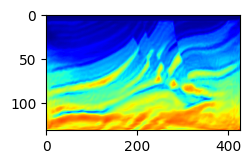

Epoch: 1491 Loss:  -9.917990148067474 model_loss:  72153.586
Epoch: 1492 Loss:  -9.918218612670898 model_loss:  72018.18
Epoch: 1493 Loss:  -9.917955756187439 model_loss:  72127.21
Epoch: 1494 Loss:  -9.918313562870026 model_loss:  72012.04
Epoch: 1495 Loss:  -9.918083667755127 model_loss:  72207.63


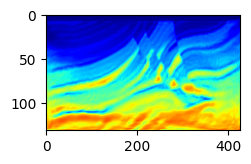

Epoch: 1496 Loss:  -9.918360888957977 model_loss:  72152.945
Epoch: 1497 Loss:  -9.918014883995056 model_loss:  72329.06
Epoch: 1498 Loss:  -9.918336749076843 model_loss:  72096.86
Epoch: 1499 Loss:  -9.918061316013336 model_loss:  72257.18
Epoch: 1500 Loss:  -9.925952911376953 model_loss:  71691.14


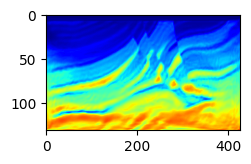

Epoch: 1501 Loss:  -9.925963580608368 model_loss:  71043.62
Epoch: 1502 Loss:  -9.926083207130432 model_loss:  70972.47
Epoch: 1503 Loss:  -9.926265895366669 model_loss:  70865.87
Epoch: 1504 Loss:  -9.926440477371216 model_loss:  70574.14
Epoch: 1505 Loss:  -9.926486253738403 model_loss:  70399.34


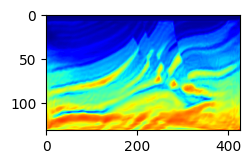

Epoch: 1506 Loss:  -9.926508963108063 model_loss:  70275.17
Epoch: 1507 Loss:  -9.9265878200531 model_loss:  70296.73
Epoch: 1508 Loss:  -9.926602065563202 model_loss:  70243.234
Epoch: 1509 Loss:  -9.926629662513733 model_loss:  70161.04
Epoch: 1510 Loss:  -9.926663041114807 model_loss:  70072.805


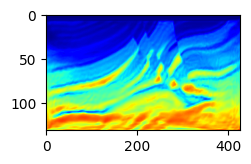

Epoch: 1511 Loss:  -9.926704108715057 model_loss:  69989.01
Epoch: 1512 Loss:  -9.926728188991547 model_loss:  69872.64
Epoch: 1513 Loss:  -9.926732301712036 model_loss:  69769.05
Epoch: 1514 Loss:  -9.926751494407654 model_loss:  69676.1
Epoch: 1515 Loss:  -9.92677903175354 model_loss:  69612.87


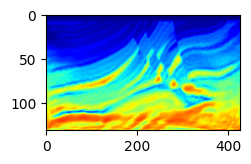

Epoch: 1516 Loss:  -9.926809668540955 model_loss:  69524.61
Epoch: 1517 Loss:  -9.926825225353241 model_loss:  69441.22
Epoch: 1518 Loss:  -9.926844477653503 model_loss:  69351.35
Epoch: 1519 Loss:  -9.926748633384705 model_loss:  69268.33
Epoch: 1520 Loss:  -9.926771819591522 model_loss:  69287.55


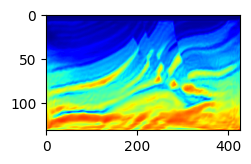

Epoch: 1521 Loss:  -9.926673710346222 model_loss:  69367.33
Epoch: 1522 Loss:  -9.926640033721924 model_loss:  68910.18
Epoch: 1523 Loss:  -9.926781356334686 model_loss:  68992.54
Epoch: 1524 Loss:  -9.926792025566101 model_loss:  68854.14
Epoch: 1525 Loss:  -9.926807284355164 model_loss:  68891.69


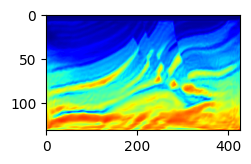

Epoch: 1526 Loss:  -9.926836729049683 model_loss:  68829.836
Epoch: 1527 Loss:  -9.926842033863068 model_loss:  68835.32
Epoch: 1528 Loss:  -9.92684119939804 model_loss:  68726.65
Epoch: 1529 Loss:  -9.926845848560333 model_loss:  68698.02
Epoch: 1530 Loss:  -9.926863431930542 model_loss:  68608.03


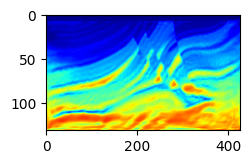

Epoch: 1531 Loss:  -9.926878094673157 model_loss:  68598.64
Epoch: 1532 Loss:  -9.926887035369873 model_loss:  68548.95
Epoch: 1533 Loss:  -9.926893532276154 model_loss:  68500.266
Epoch: 1534 Loss:  -9.92690098285675 model_loss:  68450.71
Epoch: 1535 Loss:  -9.926911294460297 model_loss:  68421.77


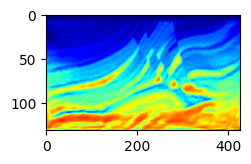

Epoch: 1536 Loss:  -9.926919043064117 model_loss:  68392.266
Epoch: 1537 Loss:  -9.926922023296356 model_loss:  68349.41
Epoch: 1538 Loss:  -9.926928758621216 model_loss:  68309.266
Epoch: 1539 Loss:  -9.926931381225586 model_loss:  68281.71
Epoch: 1540 Loss:  -9.926942110061646 model_loss:  68249.516


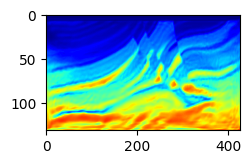

Epoch: 1541 Loss:  -9.92694741487503 model_loss:  68222.234
Epoch: 1542 Loss:  -9.926951706409454 model_loss:  68183.21
Epoch: 1543 Loss:  -9.92695289850235 model_loss:  68142.61
Epoch: 1544 Loss:  -9.926957070827484 model_loss:  68127.53
Epoch: 1545 Loss:  -9.926964104175568 model_loss:  68074.6


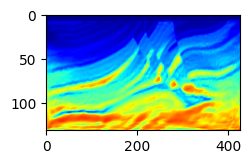

Epoch: 1546 Loss:  -9.926967978477478 model_loss:  68057.5
Epoch: 1547 Loss:  -9.926973640918732 model_loss:  68010.51
Epoch: 1548 Loss:  -9.92697662115097 model_loss:  67991.33
Epoch: 1549 Loss:  -9.92697924375534 model_loss:  67980.28
Epoch: 1550 Loss:  -9.926980555057526 model_loss:  67942.48


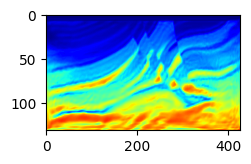

Epoch: 1551 Loss:  -9.926982581615448 model_loss:  67936.2
Epoch: 1552 Loss:  -9.92698985338211 model_loss:  67900.85
Epoch: 1553 Loss:  -9.926993370056152 model_loss:  67881.72
Epoch: 1554 Loss:  -9.926994264125824 model_loss:  67856.56
Epoch: 1555 Loss:  -9.926997363567352 model_loss:  67824.414


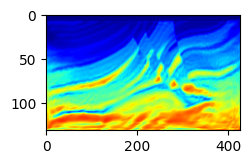

Epoch: 1556 Loss:  -9.926998138427734 model_loss:  67812.5
Epoch: 1557 Loss:  -9.927000164985657 model_loss:  67779.86
Epoch: 1558 Loss:  -9.927001774311066 model_loss:  67773.9
Epoch: 1559 Loss:  -9.927006304264069 model_loss:  67755.16
Epoch: 1560 Loss:  -9.927008628845215 model_loss:  67739.82


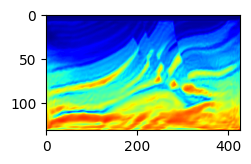

Epoch: 1561 Loss:  -9.927008390426636 model_loss:  67720.53
Epoch: 1562 Loss:  -9.927012324333191 model_loss:  67695.39
Epoch: 1563 Loss:  -9.927015900611877 model_loss:  67672.11
Epoch: 1564 Loss:  -9.927018880844116 model_loss:  67677.445
Epoch: 1565 Loss:  -9.927019238471985 model_loss:  67633.766


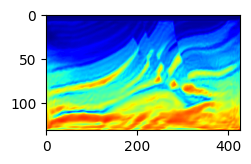

Epoch: 1566 Loss:  -9.92701643705368 model_loss:  67621.42
Epoch: 1567 Loss:  -9.92701905965805 model_loss:  67609.09
Epoch: 1568 Loss:  -9.927021741867065 model_loss:  67588.85
Epoch: 1569 Loss:  -9.927023470401764 model_loss:  67572.4
Epoch: 1570 Loss:  -9.927024185657501 model_loss:  67546.72


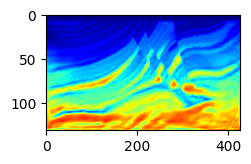

Epoch: 1571 Loss:  -9.927021503448486 model_loss:  67531.336
Epoch: 1572 Loss:  -9.927025616168976 model_loss:  67507.7
Epoch: 1573 Loss:  -9.927027940750122 model_loss:  67488.86
Epoch: 1574 Loss:  -9.927032589912415 model_loss:  67466.03
Epoch: 1575 Loss:  -9.927031695842743 model_loss:  67445.56


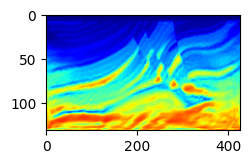

Epoch: 1576 Loss:  -9.927033364772797 model_loss:  67447.31
Epoch: 1577 Loss:  -9.92703628540039 model_loss:  67433.41
Epoch: 1578 Loss:  -9.927036166191101 model_loss:  67416.336
Epoch: 1579 Loss:  -9.927041113376617 model_loss:  67390.414
Epoch: 1580 Loss:  -9.927040100097656 model_loss:  67364.734


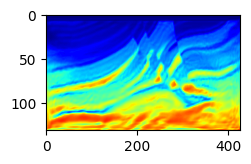

Epoch: 1581 Loss:  -9.927044689655304 model_loss:  67347.03
Epoch: 1582 Loss:  -9.927046358585358 model_loss:  67352.61
Epoch: 1583 Loss:  -9.927047073841095 model_loss:  67328.18
Epoch: 1584 Loss:  -9.927053153514862 model_loss:  67312.61
Epoch: 1585 Loss:  -9.92705774307251 model_loss:  67287.766


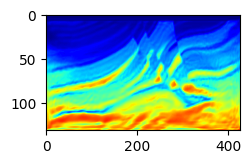

Epoch: 1586 Loss:  -9.927055418491364 model_loss:  67268.945
Epoch: 1587 Loss:  -9.92706048488617 model_loss:  67255.08
Epoch: 1588 Loss:  -9.927059471607208 model_loss:  67249.46
Epoch: 1589 Loss:  -9.927063167095184 model_loss:  67224.81
Epoch: 1590 Loss:  -9.927060961723328 model_loss:  67224.31


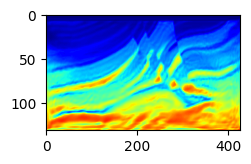

Epoch: 1591 Loss:  -9.927068054676056 model_loss:  67190.77
Epoch: 1592 Loss:  -9.927067577838898 model_loss:  67179.25
Epoch: 1593 Loss:  -9.927069306373596 model_loss:  67143.77
Epoch: 1594 Loss:  -9.927070438861847 model_loss:  67130.17
Epoch: 1595 Loss:  -9.9270721077919 model_loss:  67116.89


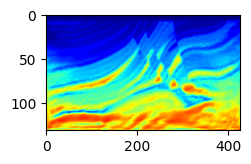

Epoch: 1596 Loss:  -9.927075922489166 model_loss:  67094.75
Epoch: 1597 Loss:  -9.92707633972168 model_loss:  67080.99
Epoch: 1598 Loss:  -9.927083373069763 model_loss:  67090.82
Epoch: 1599 Loss:  -9.92707872390747 model_loss:  67091.94
Epoch: 1600 Loss:  -9.927077829837799 model_loss:  67060.836


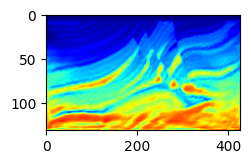

Epoch: 1601 Loss:  -9.927081286907196 model_loss:  67021.53
Epoch: 1602 Loss:  -9.927080631256104 model_loss:  67019.016
Epoch: 1603 Loss:  -9.927080690860748 model_loss:  67020.31
Epoch: 1604 Loss:  -9.92708146572113 model_loss:  66981.85
Epoch: 1605 Loss:  -9.927081525325775 model_loss:  66979.11


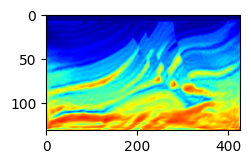

Epoch: 1606 Loss:  -9.927082598209381 model_loss:  66962.65
Epoch: 1607 Loss:  -9.9270800948143 model_loss:  66943.68
Epoch: 1608 Loss:  -9.927081823348999 model_loss:  66935.95
Epoch: 1609 Loss:  -9.927086293697357 model_loss:  66913.91
Epoch: 1610 Loss:  -9.92708045244217 model_loss:  66905.414


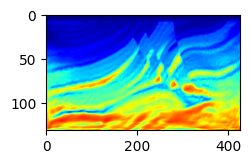

Epoch: 1611 Loss:  -9.927081823348999 model_loss:  66884.21
Epoch: 1612 Loss:  -9.927084147930145 model_loss:  66881.26
Epoch: 1613 Loss:  -9.927086055278778 model_loss:  66884.93
Epoch: 1614 Loss:  -9.9270880818367 model_loss:  66862.8
Epoch: 1615 Loss:  -9.92708432674408 model_loss:  66844.266


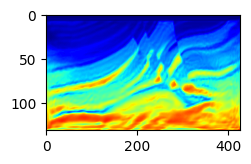

Epoch: 1616 Loss:  -9.927083373069763 model_loss:  66800.17
Epoch: 1617 Loss:  -9.927085220813751 model_loss:  66799.36
Epoch: 1618 Loss:  -9.927084982395172 model_loss:  66807.734
Epoch: 1619 Loss:  -9.927084028720856 model_loss:  66783.98
Epoch: 1620 Loss:  -9.927090346813202 model_loss:  66770.63


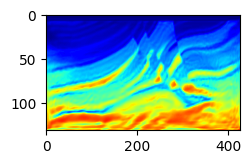

Epoch: 1621 Loss:  -9.927092790603638 model_loss:  66762.7
Epoch: 1622 Loss:  -9.927092492580414 model_loss:  66748.5
Epoch: 1623 Loss:  -9.927092432975769 model_loss:  66711.1
Epoch: 1624 Loss:  -9.927094995975494 model_loss:  66717.01
Epoch: 1625 Loss:  -9.92710131406784 model_loss:  66689.99


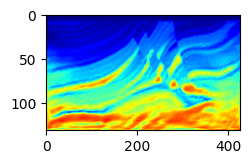

Epoch: 1626 Loss:  -9.92709881067276 model_loss:  66708.98
Epoch: 1627 Loss:  -9.927103161811829 model_loss:  66682.49
Epoch: 1628 Loss:  -9.927094757556915 model_loss:  66681.76
Epoch: 1629 Loss:  -9.927098393440247 model_loss:  66671.664
Epoch: 1630 Loss:  -9.927092969417572 model_loss:  66645.54


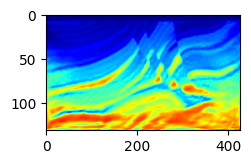

Epoch: 1631 Loss:  -9.927100777626038 model_loss:  66619.55
Epoch: 1632 Loss:  -9.927107095718384 model_loss:  66612.055
Epoch: 1633 Loss:  -9.927104413509369 model_loss:  66601.49
Epoch: 1634 Loss:  -9.927104353904724 model_loss:  66578.35
Epoch: 1635 Loss:  -9.927104473114014 model_loss:  66577.23


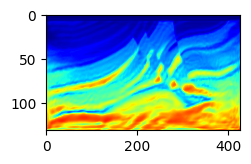

Epoch: 1636 Loss:  -9.927105009555817 model_loss:  66573.35
Epoch: 1637 Loss:  -9.927112400531769 model_loss:  66549.086
Epoch: 1638 Loss:  -9.927116990089417 model_loss:  66545.99
Epoch: 1639 Loss:  -9.92712527513504 model_loss:  66520.72
Epoch: 1640 Loss:  -9.927122831344604 model_loss:  66521.13


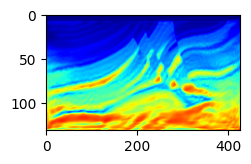

Epoch: 1641 Loss:  -9.927121877670288 model_loss:  66487.5
Epoch: 1642 Loss:  -9.927120327949524 model_loss:  66472.875
Epoch: 1643 Loss:  -9.92712950706482 model_loss:  66429.125
Epoch: 1644 Loss:  -9.927122831344604 model_loss:  66472.4
Epoch: 1645 Loss:  -9.927128911018372 model_loss:  66425.32


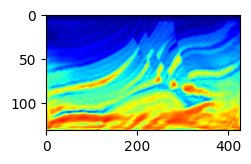

Epoch: 1646 Loss:  -9.927131831645966 model_loss:  66422.67
Epoch: 1647 Loss:  -9.927138090133667 model_loss:  66408.234
Epoch: 1648 Loss:  -9.927143573760986 model_loss:  66362.34
Epoch: 1649 Loss:  -9.927150309085846 model_loss:  66363.85
Epoch: 1650 Loss:  -9.927148163318634 model_loss:  66360.25


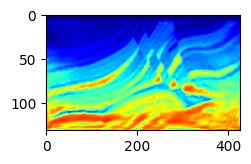

Epoch: 1651 Loss:  -9.927153587341309 model_loss:  66337.59
Epoch: 1652 Loss:  -9.927156269550323 model_loss:  66327.22
Epoch: 1653 Loss:  -9.927159249782562 model_loss:  66314.07
Epoch: 1654 Loss:  -9.927159368991852 model_loss:  66308.07
Epoch: 1655 Loss:  -9.927161455154419 model_loss:  66292.15


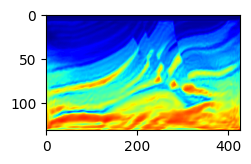

Epoch: 1656 Loss:  -9.927161455154419 model_loss:  66284.08
Epoch: 1657 Loss:  -9.927163243293762 model_loss:  66266.8
Epoch: 1658 Loss:  -9.92716658115387 model_loss:  66253.25
Epoch: 1659 Loss:  -9.92717033624649 model_loss:  66250.26
Epoch: 1660 Loss:  -9.927174985408783 model_loss:  66234.61


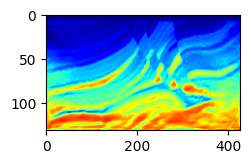

Epoch: 1661 Loss:  -9.927173435688019 model_loss:  66206.54
Epoch: 1662 Loss:  -9.927173137664795 model_loss:  66211.33
Epoch: 1663 Loss:  -9.927181422710419 model_loss:  66163.02
Epoch: 1664 Loss:  -9.927176654338837 model_loss:  66173.75
Epoch: 1665 Loss:  -9.92718654870987 model_loss:  66132.4


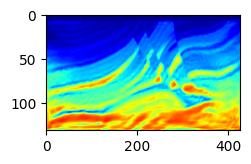

Epoch: 1666 Loss:  -9.927186191082 model_loss:  66171.78
Epoch: 1667 Loss:  -9.92718493938446 model_loss:  66148.0
Epoch: 1668 Loss:  -9.927185952663422 model_loss:  66128.336
Epoch: 1669 Loss:  -9.927191078662872 model_loss:  66113.29
Epoch: 1670 Loss:  -9.927195847034454 model_loss:  66119.305


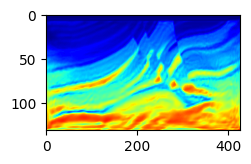

Epoch: 1671 Loss:  -9.927198112010956 model_loss:  66124.72
Epoch: 1672 Loss:  -9.927197873592377 model_loss:  66120.45
Epoch: 1673 Loss:  -9.927201330661774 model_loss:  66103.28
Epoch: 1674 Loss:  -9.927203476428986 model_loss:  66080.43
Epoch: 1675 Loss:  -9.927205085754395 model_loss:  66067.93


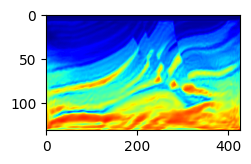

Epoch: 1676 Loss:  -9.92720741033554 model_loss:  66073.086
Epoch: 1677 Loss:  -9.927206099033356 model_loss:  66087.24
Epoch: 1678 Loss:  -9.927201092243195 model_loss:  66058.96
Epoch: 1679 Loss:  -9.927206873893738 model_loss:  66039.02
Epoch: 1680 Loss:  -9.92721140384674 model_loss:  66030.18


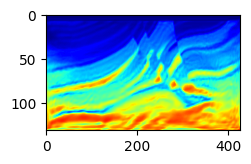

Epoch: 1681 Loss:  -9.927215933799744 model_loss:  66025.13
Epoch: 1682 Loss:  -9.927216172218323 model_loss:  66015.055
Epoch: 1683 Loss:  -9.927217364311218 model_loss:  66018.45
Epoch: 1684 Loss:  -9.927212834358215 model_loss:  65965.34
Epoch: 1685 Loss:  -9.927214741706848 model_loss:  65974.53


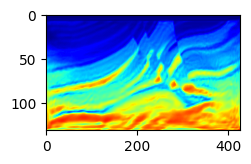

Epoch: 1686 Loss:  -9.927218079566956 model_loss:  65952.7
Epoch: 1687 Loss:  -9.92722088098526 model_loss:  65966.984
Epoch: 1688 Loss:  -9.927217841148376 model_loss:  65940.266
Epoch: 1689 Loss:  -9.927226424217224 model_loss:  65906.375
Epoch: 1690 Loss:  -9.927225947380066 model_loss:  65905.41


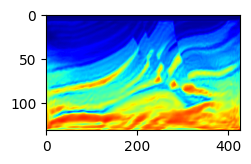

Epoch: 1691 Loss:  -9.927227795124054 model_loss:  65898.734
Epoch: 1692 Loss:  -9.92722624540329 model_loss:  65888.44
Epoch: 1693 Loss:  -9.927227318286896 model_loss:  65901.35
Epoch: 1694 Loss:  -9.92723035812378 model_loss:  65875.945
Epoch: 1695 Loss:  -9.927225291728973 model_loss:  65898.67


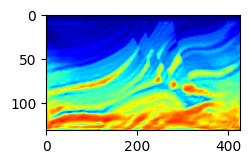

Epoch: 1696 Loss:  -9.92723673582077 model_loss:  65884.55
Epoch: 1697 Loss:  -9.927229285240173 model_loss:  65860.64
Epoch: 1698 Loss:  -9.927240252494812 model_loss:  65852.47
Epoch: 1699 Loss:  -9.927235722541809 model_loss:  65822.79
Epoch: 1700 Loss:  -9.927242457866669 model_loss:  65820.44


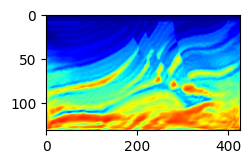

Epoch: 1701 Loss:  -9.927244246006012 model_loss:  65793.695
Epoch: 1702 Loss:  -9.92725294828415 model_loss:  65756.75
Epoch: 1703 Loss:  -9.927249133586884 model_loss:  65750.336
Epoch: 1704 Loss:  -9.927251935005188 model_loss:  65761.38
Epoch: 1705 Loss:  -9.927256643772125 model_loss:  65766.66


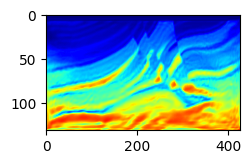

Epoch: 1706 Loss:  -9.927254796028137 model_loss:  65782.51
Epoch: 1707 Loss:  -9.927253246307373 model_loss:  65759.63
Epoch: 1708 Loss:  -9.92725670337677 model_loss:  65738.81
Epoch: 1709 Loss:  -9.927251636981964 model_loss:  65726.69
Epoch: 1710 Loss:  -9.927254259586334 model_loss:  65744.75


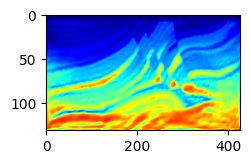

Epoch: 1711 Loss:  -9.927254498004913 model_loss:  65723.36
Epoch: 1712 Loss:  -9.92726582288742 model_loss:  65721.78
Epoch: 1713 Loss:  -9.92726320028305 model_loss:  65721.29
Epoch: 1714 Loss:  -9.927263081073761 model_loss:  65704.01
Epoch: 1715 Loss:  -9.927265346050262 model_loss:  65713.56


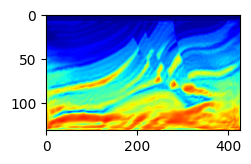

Epoch: 1716 Loss:  -9.927263975143433 model_loss:  65693.27
Epoch: 1717 Loss:  -9.927269876003265 model_loss:  65691.805
Epoch: 1718 Loss:  -9.927272498607635 model_loss:  65658.22
Epoch: 1719 Loss:  -9.927263498306274 model_loss:  65656.34
Epoch: 1720 Loss:  -9.927273154258728 model_loss:  65623.805


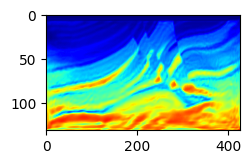

Epoch: 1721 Loss:  -9.927266716957092 model_loss:  65632.06
Epoch: 1722 Loss:  -9.92726993560791 model_loss:  65642.19
Epoch: 1723 Loss:  -9.927269458770752 model_loss:  65629.47
Epoch: 1724 Loss:  -9.927267372608185 model_loss:  65617.61
Epoch: 1725 Loss:  -9.92726731300354 model_loss:  65618.71


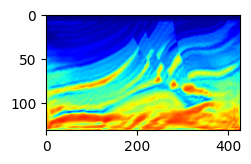

Epoch: 1726 Loss:  -9.927272081375122 model_loss:  65612.84
Epoch: 1727 Loss:  -9.927271902561188 model_loss:  65587.07
Epoch: 1728 Loss:  -9.927270591259003 model_loss:  65600.28
Epoch: 1729 Loss:  -9.927277266979218 model_loss:  65569.38
Epoch: 1730 Loss:  -9.927274882793427 model_loss:  65567.83


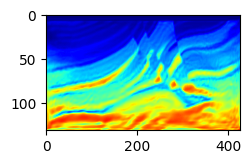

Epoch: 1731 Loss:  -9.927278518676758 model_loss:  65540.47
Epoch: 1732 Loss:  -9.927279770374298 model_loss:  65548.84
Epoch: 1733 Loss:  -9.927282154560089 model_loss:  65526.38
Epoch: 1734 Loss:  -9.927283525466919 model_loss:  65530.95
Epoch: 1735 Loss:  -9.927284896373749 model_loss:  65542.06


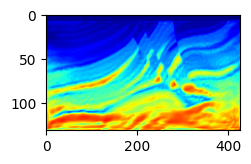

Epoch: 1736 Loss:  -9.927289366722107 model_loss:  65539.68
Epoch: 1737 Loss:  -9.927293241024017 model_loss:  65532.445
Epoch: 1738 Loss:  -9.92728990316391 model_loss:  65540.94
Epoch: 1739 Loss:  -9.927293598651886 model_loss:  65527.88
Epoch: 1740 Loss:  -9.927289605140686 model_loss:  65536.49


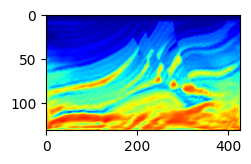

Epoch: 1741 Loss:  -9.92728978395462 model_loss:  65514.883
Epoch: 1742 Loss:  -9.92729264497757 model_loss:  65500.418
Epoch: 1743 Loss:  -9.927286922931671 model_loss:  65507.92
Epoch: 1744 Loss:  -9.927290201187134 model_loss:  65504.89
Epoch: 1745 Loss:  -9.92728966474533 model_loss:  65481.42


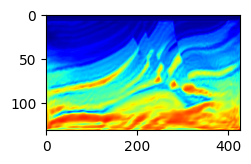

Epoch: 1746 Loss:  -9.927282154560089 model_loss:  65514.793
Epoch: 1747 Loss:  -9.927278101444244 model_loss:  65496.92
Epoch: 1748 Loss:  -9.927294254302979 model_loss:  65480.59
Epoch: 1749 Loss:  -9.927286386489868 model_loss:  65471.47
Epoch: 1750 Loss:  -9.927283346652985 model_loss:  65484.883


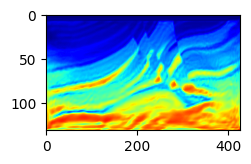

Epoch: 1751 Loss:  -9.927293479442596 model_loss:  65453.844
Epoch: 1752 Loss:  -9.92728066444397 model_loss:  65482.633
Epoch: 1753 Loss:  -9.92728590965271 model_loss:  65455.098
Epoch: 1754 Loss:  -9.927290856838226 model_loss:  65489.855
Epoch: 1755 Loss:  -9.92728990316391 model_loss:  65462.652


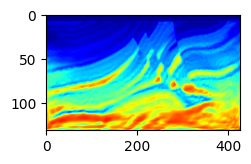

Epoch: 1756 Loss:  -9.927285969257355 model_loss:  65468.49
Epoch: 1757 Loss:  -9.927293956279755 model_loss:  65433.203
Epoch: 1758 Loss:  -9.927291572093964 model_loss:  65461.445
Epoch: 1759 Loss:  -9.927294075489044 model_loss:  65441.734
Epoch: 1760 Loss:  -9.927296817302704 model_loss:  65457.863


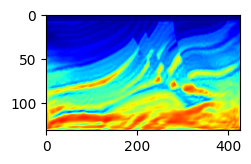

Epoch: 1761 Loss:  -9.927293717861176 model_loss:  65434.273
Epoch: 1762 Loss:  -9.927298605442047 model_loss:  65423.887
Epoch: 1763 Loss:  -9.927295327186584 model_loss:  65430.26
Epoch: 1764 Loss:  -9.9272900223732 model_loss:  65412.523
Epoch: 1765 Loss:  -9.927291750907898 model_loss:  65419.94


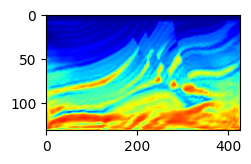

Epoch: 1766 Loss:  -9.927294611930847 model_loss:  65409.105
Epoch: 1767 Loss:  -9.92728728055954 model_loss:  65408.98
Epoch: 1768 Loss:  -9.927291631698608 model_loss:  65401.31
Epoch: 1769 Loss:  -9.927284836769104 model_loss:  65423.99
Epoch: 1770 Loss:  -9.927301585674286 model_loss:  65402.273


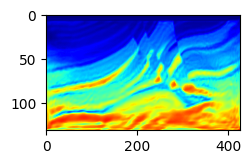

Epoch: 1771 Loss:  -9.927297055721283 model_loss:  65413.594
Epoch: 1772 Loss:  -9.927298128604889 model_loss:  65394.28
Epoch: 1773 Loss:  -9.92727917432785 model_loss:  65422.03
Epoch: 1774 Loss:  -9.927297174930573 model_loss:  65371.14
Epoch: 1775 Loss:  -9.92727905511856 model_loss:  65399.137


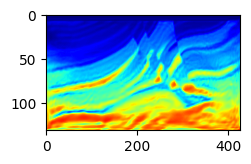

Epoch: 1776 Loss:  -9.927277147769928 model_loss:  65383.72
Epoch: 1777 Loss:  -9.927280247211456 model_loss:  65386.195
Epoch: 1778 Loss:  -9.927289307117462 model_loss:  65386.125
Epoch: 1779 Loss:  -9.92728841304779 model_loss:  65363.41
Epoch: 1780 Loss:  -9.927286326885223 model_loss:  65343.793


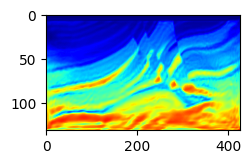

Epoch: 1781 Loss:  -9.92727142572403 model_loss:  65369.543
Epoch: 1782 Loss:  -9.927271127700806 model_loss:  65357.562
Epoch: 1783 Loss:  -9.92729502916336 model_loss:  65336.07
Epoch: 1784 Loss:  -9.92729365825653 model_loss:  65349.246
Epoch: 1785 Loss:  -9.927279591560364 model_loss:  65334.742


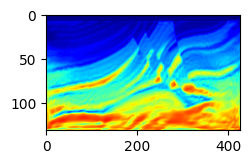

Epoch: 1786 Loss:  -9.927256166934967 model_loss:  65324.094
Epoch: 1787 Loss:  -9.927293419837952 model_loss:  65323.535
Epoch: 1788 Loss:  -9.927292346954346 model_loss:  65317.7
Epoch: 1789 Loss:  -9.927267253398895 model_loss:  65368.684
Epoch: 1790 Loss:  -9.927272617816925 model_loss:  65306.758


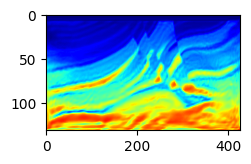

Epoch: 1791 Loss:  -9.927264094352722 model_loss:  65326.387
Epoch: 1792 Loss:  -9.927269041538239 model_loss:  65303.645
Epoch: 1793 Loss:  -9.927265346050262 model_loss:  65341.61
Epoch: 1794 Loss:  -9.927278637886047 model_loss:  65295.28
Epoch: 1795 Loss:  -9.927243292331696 model_loss:  65345.496


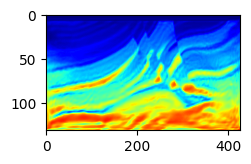

Epoch: 1796 Loss:  -9.927261888980865 model_loss:  65302.844
Epoch: 1797 Loss:  -9.927259266376495 model_loss:  65334.47
Epoch: 1798 Loss:  -9.927252471446991 model_loss:  65319.984
Epoch: 1799 Loss:  -9.927235960960388 model_loss:  65368.656
Epoch: 1800 Loss:  -9.927270770072937 model_loss:  65342.086


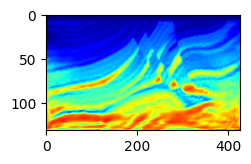

Epoch: 1801 Loss:  -9.927242696285248 model_loss:  65331.96
Epoch: 1802 Loss:  -9.927246868610382 model_loss:  65356.188
Epoch: 1803 Loss:  -9.92725956439972 model_loss:  65365.15
Epoch: 1804 Loss:  -9.927274644374847 model_loss:  65353.438
Epoch: 1805 Loss:  -9.927263677120209 model_loss:  65325.676


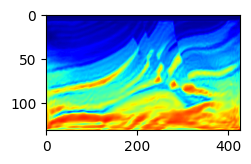

Epoch: 1806 Loss:  -9.92725384235382 model_loss:  65408.78
Epoch: 1807 Loss:  -9.927282750606537 model_loss:  65322.08
Epoch: 1808 Loss:  -9.927255630493164 model_loss:  65384.96
Epoch: 1809 Loss:  -9.927275538444519 model_loss:  65314.723
Epoch: 1810 Loss:  -9.92727017402649 model_loss:  65329.066


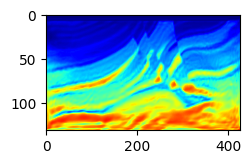

Epoch: 1811 Loss:  -9.92727679014206 model_loss:  65272.023
Epoch: 1812 Loss:  -9.927260994911194 model_loss:  65307.18
Epoch: 1813 Loss:  -9.9272700548172 model_loss:  65268.613
Epoch: 1814 Loss:  -9.927286982536316 model_loss:  65302.574
Epoch: 1815 Loss:  -9.927289962768555 model_loss:  65273.258


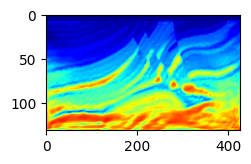

Epoch: 1816 Loss:  -9.927286684513092 model_loss:  65273.71
Epoch: 1817 Loss:  -9.927290797233582 model_loss:  65233.086
Epoch: 1818 Loss:  -9.92728739976883 model_loss:  65233.25
Epoch: 1819 Loss:  -9.927286148071289 model_loss:  65223.4
Epoch: 1820 Loss:  -9.927286744117737 model_loss:  65237.387


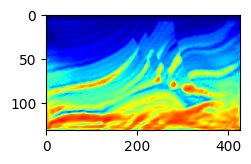

Epoch: 1821 Loss:  -9.927284240722656 model_loss:  65208.934
Epoch: 1822 Loss:  -9.927280724048615 model_loss:  65215.918
Epoch: 1823 Loss:  -9.92727929353714 model_loss:  65176.625
Epoch: 1824 Loss:  -9.927277624607086 model_loss:  65186.38
Epoch: 1825 Loss:  -9.927272260189056 model_loss:  65183.277


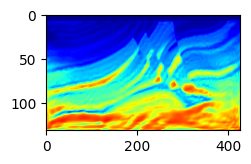

Epoch: 1826 Loss:  -9.927263259887695 model_loss:  65173.395
Epoch: 1827 Loss:  -9.927266359329224 model_loss:  65170.45
Epoch: 1828 Loss:  -9.927254915237427 model_loss:  65144.336
Epoch: 1829 Loss:  -9.927252233028412 model_loss:  65160.797
Epoch: 1830 Loss:  -9.927189290523529 model_loss:  65149.785


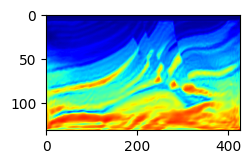

Epoch: 1831 Loss:  -9.927224457263947 model_loss:  65185.68
Epoch: 1832 Loss:  -9.927201569080353 model_loss:  65124.504
Epoch: 1833 Loss:  -9.927208721637726 model_loss:  65138.156
Epoch: 1834 Loss:  -9.927154958248138 model_loss:  65111.344
Epoch: 1835 Loss:  -9.927174270153046 model_loss:  65126.88


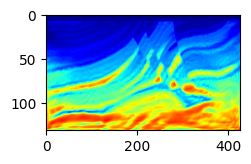

Epoch: 1836 Loss:  -9.927146136760712 model_loss:  65084.44
Epoch: 1837 Loss:  -9.927152454853058 model_loss:  65097.03
Epoch: 1838 Loss:  -9.927120923995972 model_loss:  65058.95
Epoch: 1839 Loss:  -9.92711728811264 model_loss:  65053.105
Epoch: 1840 Loss:  -9.927130579948425 model_loss:  65015.82


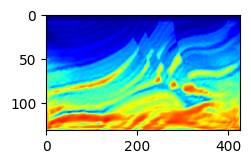

Epoch: 1841 Loss:  -9.927137792110443 model_loss:  64959.566
Epoch: 1842 Loss:  -9.927140831947327 model_loss:  64881.105
Epoch: 1843 Loss:  -9.927125096321106 model_loss:  64816.176
Epoch: 1844 Loss:  -9.927119553089142 model_loss:  64735.555
Epoch: 1845 Loss:  -9.927094221115112 model_loss:  64663.5


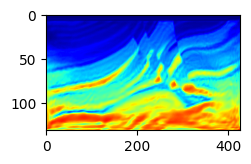

Epoch: 1846 Loss:  -9.927044332027435 model_loss:  64597.426
Epoch: 1847 Loss:  -9.927006781101227 model_loss:  64445.54
Epoch: 1848 Loss:  -9.926979839801788 model_loss:  64410.293
Epoch: 1849 Loss:  -9.926973819732666 model_loss:  64357.95
Epoch: 1850 Loss:  -9.926996290683746 model_loss:  64442.656


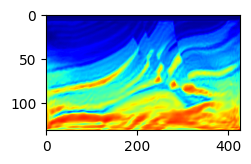

Epoch: 1851 Loss:  -9.927051961421967 model_loss:  64485.496
Epoch: 1852 Loss:  -9.927121639251709 model_loss:  64581.375
Epoch: 1853 Loss:  -9.92715322971344 model_loss:  64688.336
Epoch: 1854 Loss:  -9.927204430103302 model_loss:  64803.15
Epoch: 1855 Loss:  -9.927248358726501 model_loss:  64879.734


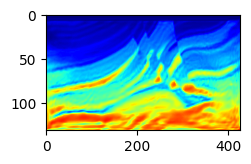

Epoch: 1856 Loss:  -9.927284121513367 model_loss:  64923.78
Epoch: 1857 Loss:  -9.927295446395874 model_loss:  64894.527
Epoch: 1858 Loss:  -9.927315711975098 model_loss:  64799.598
Epoch: 1859 Loss:  -9.927323877811432 model_loss:  64727.85
Epoch: 1860 Loss:  -9.927327632904053 model_loss:  64691.996


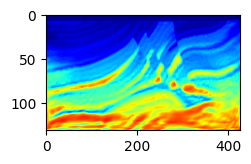

Epoch: 1861 Loss:  -9.927328824996948 model_loss:  64652.79
Epoch: 1862 Loss:  -9.92733359336853 model_loss:  64610.9
Epoch: 1863 Loss:  -9.92732983827591 model_loss:  64581.906
Epoch: 1864 Loss:  -9.92732572555542 model_loss:  64602.203
Epoch: 1865 Loss:  -9.92732036113739 model_loss:  64638.168


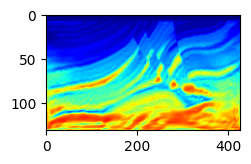

Epoch: 1866 Loss:  -9.927324533462524 model_loss:  64647.684
Epoch: 1867 Loss:  -9.927323937416077 model_loss:  64687.066
Epoch: 1868 Loss:  -9.927316069602966 model_loss:  64696.52
Epoch: 1869 Loss:  -9.927316904067993 model_loss:  64712.465
Epoch: 1870 Loss:  -9.927318096160889 model_loss:  64679.184


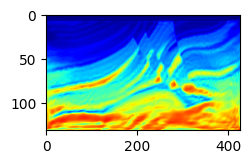

Epoch: 1871 Loss:  -9.927316665649414 model_loss:  64686.605
Epoch: 1872 Loss:  -9.927320182323456 model_loss:  64642.816
Epoch: 1873 Loss:  -9.927326142787933 model_loss:  64648.285
Epoch: 1874 Loss:  -9.927328944206238 model_loss:  64677.55
Epoch: 1875 Loss:  -9.927331030368805 model_loss:  64647.246


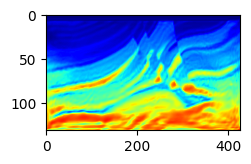

Epoch: 1876 Loss:  -9.92733383178711 model_loss:  64654.2
Epoch: 1877 Loss:  -9.927334487438202 model_loss:  64647.707
Epoch: 1878 Loss:  -9.927337646484375 model_loss:  64652.97
Epoch: 1879 Loss:  -9.927348256111145 model_loss:  64575.082
Epoch: 1880 Loss:  -9.92735069990158 model_loss:  64606.06


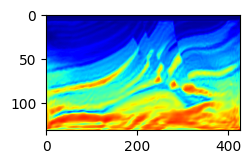

Epoch: 1881 Loss:  -9.927370429039001 model_loss:  64599.887
Epoch: 1882 Loss:  -9.927383780479431 model_loss:  64619.758
Epoch: 1883 Loss:  -9.927390158176422 model_loss:  64631.86
Epoch: 1884 Loss:  -9.9273961186409 model_loss:  64658.03
Epoch: 1885 Loss:  -9.927401959896088 model_loss:  64650.71


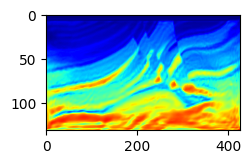

Epoch: 1886 Loss:  -9.927404522895813 model_loss:  64661.0
Epoch: 1887 Loss:  -9.927401006221771 model_loss:  64637.81
Epoch: 1888 Loss:  -9.92740136384964 model_loss:  64624.195
Epoch: 1889 Loss:  -9.927395522594452 model_loss:  64616.383
Epoch: 1890 Loss:  -9.927394986152649 model_loss:  64600.71


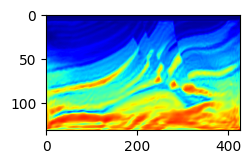

Epoch: 1891 Loss:  -9.927395522594452 model_loss:  64579.65
Epoch: 1892 Loss:  -9.927388727664948 model_loss:  64593.305
Epoch: 1893 Loss:  -9.927387356758118 model_loss:  64538.91
Epoch: 1894 Loss:  -9.927381932735443 model_loss:  64552.64
Epoch: 1895 Loss:  -9.92737740278244 model_loss:  64529.42


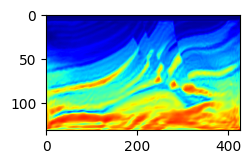

Epoch: 1896 Loss:  -9.927362501621246 model_loss:  64531.312
Epoch: 1897 Loss:  -9.92736703157425 model_loss:  64509.21
Epoch: 1898 Loss:  -9.927358746528625 model_loss:  64497.77
Epoch: 1899 Loss:  -9.927342236042023 model_loss:  64466.695
Epoch: 1900 Loss:  -9.927339136600494 model_loss:  64468.066


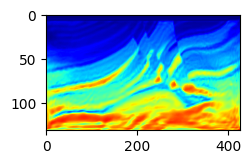

Epoch: 1901 Loss:  -9.927336692810059 model_loss:  64473.043
Epoch: 1902 Loss:  -9.927341341972351 model_loss:  64457.047
Epoch: 1903 Loss:  -9.927329123020172 model_loss:  64439.64
Epoch: 1904 Loss:  -9.92732858657837 model_loss:  64427.07
Epoch: 1905 Loss:  -9.927315950393677 model_loss:  64462.01


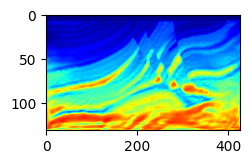

Epoch: 1906 Loss:  -9.927300691604614 model_loss:  64441.645
Epoch: 1907 Loss:  -9.927315294742584 model_loss:  64442.125
Epoch: 1908 Loss:  -9.927300214767456 model_loss:  64443.383
Epoch: 1909 Loss:  -9.927284479141235 model_loss:  64423.68
Epoch: 1910 Loss:  -9.927285552024841 model_loss:  64446.953


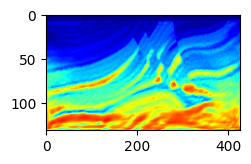

Epoch: 1911 Loss:  -9.927318215370178 model_loss:  64450.195
Epoch: 1912 Loss:  -9.92731374502182 model_loss:  64499.47
Epoch: 1913 Loss:  -9.92732721567154 model_loss:  64514.37
Epoch: 1914 Loss:  -9.927343904972076 model_loss:  64534.77
Epoch: 1915 Loss:  -9.927344560623169 model_loss:  64545.082


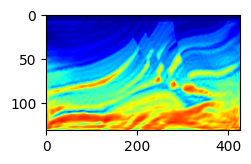

Epoch: 1916 Loss:  -9.92736029624939 model_loss:  64579.906
Epoch: 1917 Loss:  -9.927371561527252 model_loss:  64573.656
Epoch: 1918 Loss:  -9.927386462688446 model_loss:  64592.21
Epoch: 1919 Loss:  -9.92739337682724 model_loss:  64575.75
Epoch: 1920 Loss:  -9.927404940128326 model_loss:  64562.316


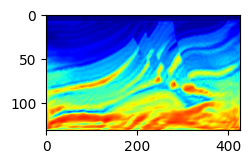

Epoch: 1921 Loss:  -9.927405893802643 model_loss:  64576.14
Epoch: 1922 Loss:  -9.927414953708649 model_loss:  64591.53
Epoch: 1923 Loss:  -9.9274263381958 model_loss:  64575.688
Epoch: 1924 Loss:  -9.9274320602417 model_loss:  64551.125
Epoch: 1925 Loss:  -9.927427470684052 model_loss:  64540.477


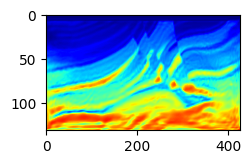

Epoch: 1926 Loss:  -9.927426517009735 model_loss:  64515.95
Epoch: 1927 Loss:  -9.92742532491684 model_loss:  64507.86
Epoch: 1928 Loss:  -9.927424907684326 model_loss:  64496.55
Epoch: 1929 Loss:  -9.927401185035706 model_loss:  64552.016
Epoch: 1930 Loss:  -9.927394926548004 model_loss:  64487.8


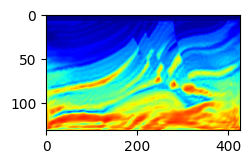

Epoch: 1931 Loss:  -9.927389025688171 model_loss:  64506.98
Epoch: 1932 Loss:  -9.92737764120102 model_loss:  64475.426
Epoch: 1933 Loss:  -9.927377939224243 model_loss:  64464.582
Epoch: 1934 Loss:  -9.927355229854584 model_loss:  64442.016
Epoch: 1935 Loss:  -9.927348554134369 model_loss:  64436.543


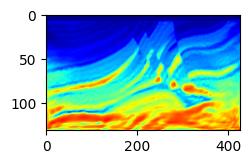

Epoch: 1936 Loss:  -9.927351653575897 model_loss:  64452.336
Epoch: 1937 Loss:  -9.927334904670715 model_loss:  64463.29
Epoch: 1938 Loss:  -9.927323520183563 model_loss:  64447.477
Epoch: 1939 Loss:  -9.92730164527893 model_loss:  64485.42
Epoch: 1940 Loss:  -9.927332997322083 model_loss:  64434.71


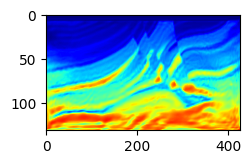

Epoch: 1941 Loss:  -9.92729264497757 model_loss:  64491.19
Epoch: 1942 Loss:  -9.927273035049438 model_loss:  64454.62
Epoch: 1943 Loss:  -9.927282154560089 model_loss:  64496.64
Epoch: 1944 Loss:  -9.927291750907898 model_loss:  64483.664
Epoch: 1945 Loss:  -9.927262723445892 model_loss:  64548.074


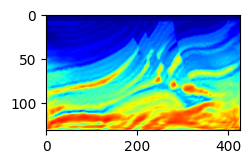

Epoch: 1946 Loss:  -9.927293121814728 model_loss:  64569.26
Epoch: 1947 Loss:  -9.927301168441772 model_loss:  64587.715
Epoch: 1948 Loss:  -9.927274644374847 model_loss:  64593.035
Epoch: 1949 Loss:  -9.927298367023468 model_loss:  64611.84
Epoch: 1950 Loss:  -9.927285194396973 model_loss:  64652.67


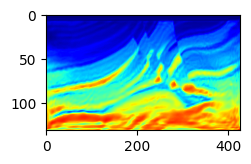

Epoch: 1951 Loss:  -9.92728179693222 model_loss:  64627.816
Epoch: 1952 Loss:  -9.927265703678131 model_loss:  64701.438
Epoch: 1953 Loss:  -9.927259504795074 model_loss:  64696.09
Epoch: 1954 Loss:  -9.927266776561737 model_loss:  64655.797
Epoch: 1955 Loss:  -9.927228450775146 model_loss:  64718.406


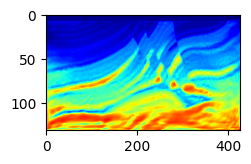

Epoch: 1956 Loss:  -9.927248895168304 model_loss:  64619.79
Epoch: 1957 Loss:  -9.927241086959839 model_loss:  64699.598
Epoch: 1958 Loss:  -9.927262485027313 model_loss:  64641.023
Epoch: 1959 Loss:  -9.927257359027863 model_loss:  64644.418
Epoch: 1960 Loss:  -9.92726194858551 model_loss:  64617.51


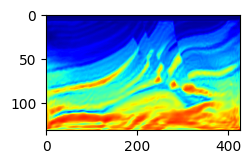

Epoch: 1961 Loss:  -9.927265286445618 model_loss:  64577.637
Epoch: 1962 Loss:  -9.927273333072662 model_loss:  64503.953
Epoch: 1963 Loss:  -9.927250862121582 model_loss:  64563.223
Epoch: 1964 Loss:  -9.927254617214203 model_loss:  64496.574
Epoch: 1965 Loss:  -9.927237510681152 model_loss:  64504.168


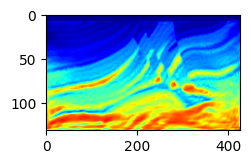

Epoch: 1966 Loss:  -9.927233099937439 model_loss:  64501.78
Epoch: 1967 Loss:  -9.927234053611755 model_loss:  64500.586
Epoch: 1968 Loss:  -9.927227675914764 model_loss:  64484.4
Epoch: 1969 Loss:  -9.927201569080353 model_loss:  64535.348
Epoch: 1970 Loss:  -9.92720478773117 model_loss:  64578.65


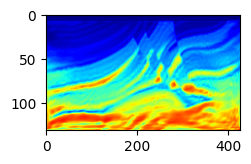

Epoch: 1971 Loss:  -9.927218496799469 model_loss:  64573.926
Epoch: 1972 Loss:  -9.92721539735794 model_loss:  64629.586
Epoch: 1973 Loss:  -9.927246630191803 model_loss:  64597.832
Epoch: 1974 Loss:  -9.927268743515015 model_loss:  64662.434
Epoch: 1975 Loss:  -9.927270591259003 model_loss:  64679.734


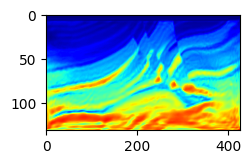

Epoch: 1976 Loss:  -9.927280485630035 model_loss:  64634.98
Epoch: 1977 Loss:  -9.927279353141785 model_loss:  64569.723
Epoch: 1978 Loss:  -9.927269637584686 model_loss:  64556.816
Epoch: 1979 Loss:  -9.927276372909546 model_loss:  64519.164
Epoch: 1980 Loss:  -9.927275776863098 model_loss:  64463.723


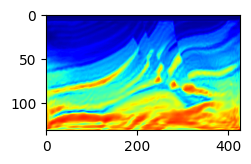

Epoch: 1981 Loss:  -9.927280962467194 model_loss:  64441.72
Epoch: 1982 Loss:  -9.927300214767456 model_loss:  64405.914
Epoch: 1983 Loss:  -9.927314698696136 model_loss:  64325.1
Epoch: 1984 Loss:  -9.92732560634613 model_loss:  64271.293
Epoch: 1985 Loss:  -9.927340567111969 model_loss:  64216.926


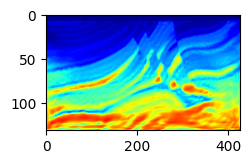

Epoch: 1986 Loss:  -9.92736405134201 model_loss:  64148.977
Epoch: 1987 Loss:  -9.927370965480804 model_loss:  64143.17
Epoch: 1988 Loss:  -9.927378833293915 model_loss:  64112.66
Epoch: 1989 Loss:  -9.927388966083527 model_loss:  64053.023
Epoch: 1990 Loss:  -9.927384674549103 model_loss:  64102.32


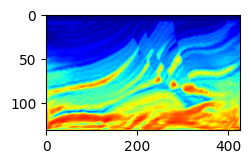

Epoch: 1991 Loss:  -9.927398681640625 model_loss:  64029.89
Epoch: 1992 Loss:  -9.92737489938736 model_loss:  64047.324
Epoch: 1993 Loss:  -9.927393972873688 model_loss:  64019.645
Epoch: 1994 Loss:  -9.927408456802368 model_loss:  64061.43
Epoch: 1995 Loss:  -9.927416980266571 model_loss:  64063.68


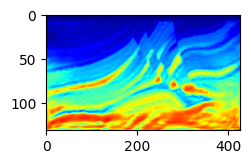

Epoch: 1996 Loss:  -9.92742908000946 model_loss:  64089.49
Epoch: 1997 Loss:  -9.927434265613556 model_loss:  64107.188
Epoch: 1998 Loss:  -9.927444994449615 model_loss:  64086.062
Epoch: 1999 Loss:  -9.927450716495514 model_loss:  64083.56
Runtime: 3142.648698091507


In [15]:
loss_fn = torch.nn.MSELoss()
# Iterative inversion loop
t_start = time.time()
num_batches = 10 # split data into 8 batches for speed and reduced memory use
num_shots_per_batch = int(n_shots / num_batches)
num_epochs = 2000 # Pass through the entire dataset 30 times
model_loss = []
data_correlation = []
for epoch in range(num_epochs):
    epoch_loss = 0.0
    for it in range(num_batches):   
        optimizer.zero_grad()

        batch_source_amplitudes = source_amplitudes_wrong.repeat(num_shots_per_batch, 1, 1).to(device)
        batch_data_obs = data_obs[it::num_batches,:].to(device)
        batch_source_locations = source_locations[it::num_batches].to(device)
        batch_receiver_locations = receiver_locations[it::num_batches].to(device)
        earth_model = autoencoder(train_vel.view(1,40,70,70).repeat(BATCH_SIZE,1,1,1))
        vp = earth_model[:, 0, ...].squeeze()
        
        out = scalar(
              vp.T, dx, dt,
              source_amplitudes=batch_source_amplitudes,
              source_locations=batch_source_locations,
              receiver_locations=batch_receiver_locations,
              pml_freq=freq,
        )
        
        data_pred = out[-1]

        d_obs_conv, d_pred_conv = data_conv(batch_data_obs, data_pred, batch_source_locations)
        
        data_obs_norm = d_obs_conv/torch.sqrt(torch.mul(d_obs_conv,d_obs_conv).sum())
        data_pred_norm = d_pred_conv/torch.sqrt(torch.mul(d_pred_conv,d_pred_conv).sum())
        #loss = amp*torch.sum(-torch.mul(data_obs_norm, data_pred_norm)) + 1e-6*loss_fn(vp[:,200],vp_true[:,200])
        if epoch<500:        
            loss = amp*torch.sum(-torch.mul(data_obs_norm, data_pred_norm)) + 1e-7*loss_fn(vp, vp_init) #+ 1e-9*torch.sum(torch.sqrt(torch.pow(vp_dx[1:-1,1:-1],2) + torch.pow(vp_dz[1:-1,1:-1],2)))
        elif epoch>=500 and epoch < 1000:
            loss = amp*torch.sum(-torch.mul(data_obs_norm, data_pred_norm)) + 5e-8*loss_fn(vp, vp_init)
        elif epoch>=1000 and epoch < 1500:       
            loss = amp*torch.sum(-torch.mul(data_obs_norm, data_pred_norm)) + 1e-8*loss_fn(vp, vp_init) #+ 1e-9*torch.sum(torch.sqrt(torch.pow(vp_dx[1:-1,1:-1],2) + torch.pow(vp_dz[1:-1,1:-1],2)))
        else:
            loss = amp*torch.sum(-torch.mul(data_obs_norm, data_pred_norm)) #+ 5e-9*loss_fn(vp, vp_init)        
        epoch_loss += loss.item()
        loss.backward()
        optimizer.step()
        
    scheduler.step()  
    v_loss = loss_fn(vp.cpu(),vp_true.cpu()).detach().numpy() 
    model_loss.append(v_loss.item())
    data_correlation.append(epoch_loss)
    print('Epoch:', epoch, 'Loss: ', epoch_loss,'model_loss: ', v_loss)
    if epoch !=0 and epoch % 5 == 0:
        _, ax = plt.subplots(1, 1, figsize=(2.5, 1.5), sharex=True, sharey=True)
        ax.imshow(vp.detach().cpu(), aspect='auto', cmap='jet', vmin=vpmin, vmax=vpmax)
        plt.show()

t_end = time.time()
print('Runtime:', t_end - t_start)

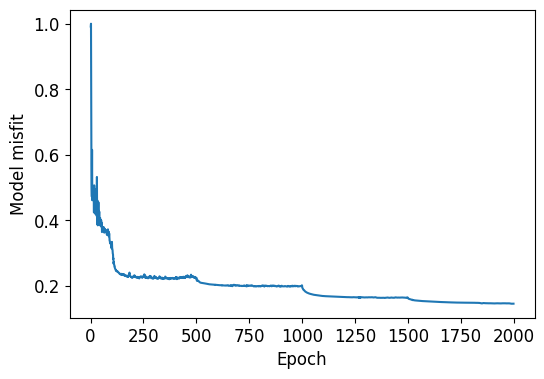

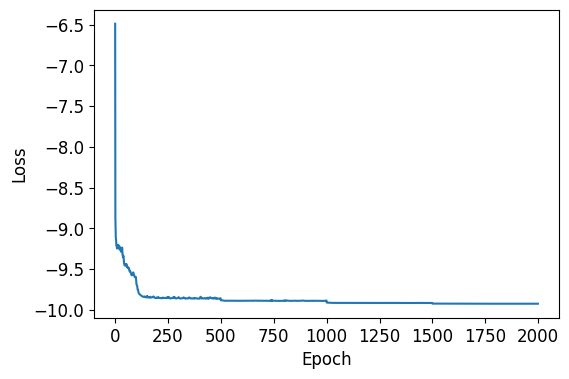

In [19]:
model_loss = np.array(model_loss)
plt.figure(figsize=(6,4))
plt.plot(range(1,num_epochs+1),model_loss/model_loss.max())
plt.xlabel("Epoch",fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("Model misfit",fontsize=12)
plt.yticks(fontsize=12)
plt.savefig("./noise/model_loss_noise.jpeg",dpi=400)
scipy.io.savemat('./noise/model_loss_mar_noise.mat',{'model_loss':model_loss})


data_loss = np.array(data_correlation)
plt.figure(figsize=(6,4))
plt.plot(data_loss)
# plt.yscale('log')
plt.xlabel("Epoch", fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.yticks(fontsize=12)
plt.savefig('./noise/Loss_salt_noise.jpeg',dpi=400)
scipy.io.savemat('./noise/data_loss_mar_noise.mat',{'data_loss':data_loss})

torch.Size([4, 425, 1000])
torch.Size([4, 425, 1999]) torch.Size([4, 425, 1999])


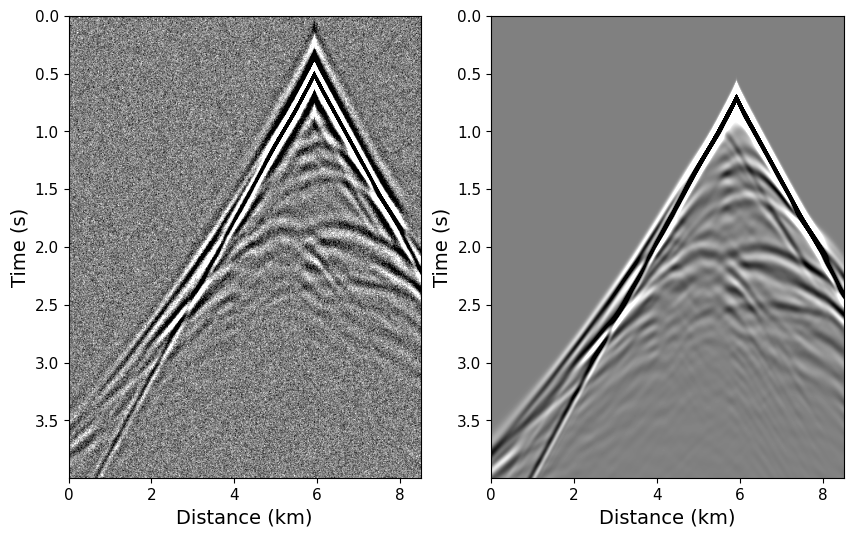

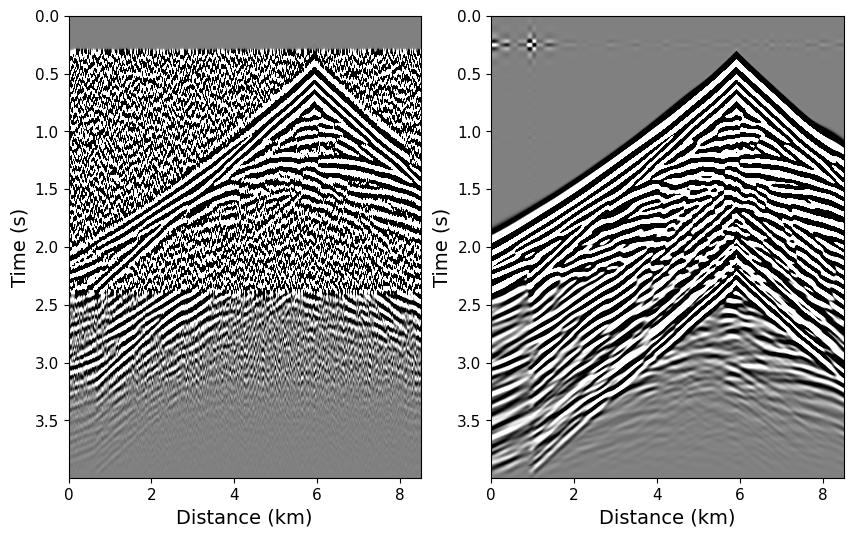

In [20]:
print(batch_data_obs.shape)
#         d_pred_conv = hilert_transform(d_obs_conv, p)
# d_obs_conv, d_pred_conv = data_conv(batch_data_obs, data_pred, 50)
d_obs_conv, d_pred_conv = data_conv(batch_data_obs, data_pred, batch_source_locations)
print(d_obs_conv.shape,d_pred_conv.shape)
## plot data
plt.style.use('default')
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
ax = plt.gca()
im = ax.imshow(batch_data_obs[2,:].T.cpu().detach().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,2,2)
ax = plt.gca()
im = ax.imshow(data_pred[2,:].T.cpu().detach().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin, vmax=vmax, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
# plt.savefig("Data_original_mar.jpeg",dpi=400)


## plot data
plt.style.use('default')
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
ax = plt.gca()
im = ax.imshow(d_obs_conv[2,:].T.cpu().detach().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin*10, vmax=vmax*10, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)
plt.subplot(1,2,2)
ax = plt.gca()
im = ax.imshow(d_pred_conv[2,:].T.cpu().detach().numpy(),extent=[0,(nx-1)*dx/1000,(nt-1)*dt,0], aspect='auto',
           vmin=vmin*10, vmax=vmax*10, cmap="gray")
plt.xlabel('Distance (km)', fontsize=14)
plt.xticks(fontsize=11)
plt.ylabel('Time (s)', fontsize=14)
plt.yticks(fontsize=11)

plt.savefig("./noise/Data_convolved_mar_noise.jpeg",dpi=400)

scipy.io.savemat('./noise/d_obs_conv_noise.mat',{'d_obs_conv':d_obs_conv.cpu().detach().numpy()})
scipy.io.savemat('./noise/d_pred_conv_noise.mat',{'d_pred_conv':d_pred_conv.cpu().detach().numpy()})

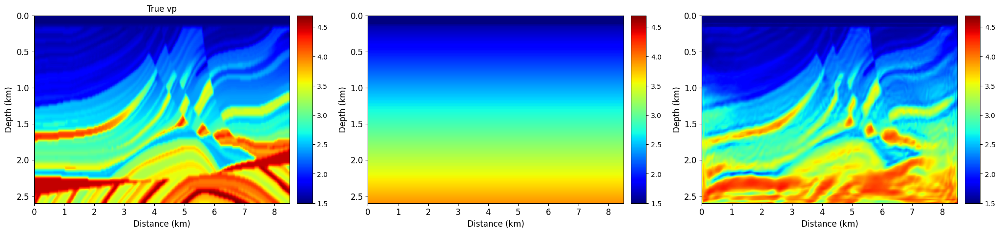

In [21]:
vp_true1 = vp_true/1000
vpmin = vp_true1.min()
vpmax = vp_true1.max()

# vp_ini = scipy.io.loadmat('vp_ini.mat')
# vp_init = vp_ini['vp_ini'] 


# Plot
plt.style.use('default')
plt.figure(figsize=(25,5))
plt.subplot(1,3,1)
ax = plt.gca()
im  = ax.imshow(vp_true.cpu()/1000, aspect='auto', cmap='jet', extent=[0,(nx-1)*dx/1000,(nz-1)*dx/1000,0],
                vmin=vpmin, vmax=vpmax)
plt.ylabel("Depth (km)",fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Distance (km)",fontsize=12)
plt.xticks(fontsize=12)
plt.title("True vp",fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)


plt.subplot(1,3,2)
ax = plt.gca()
im  = ax.imshow(vp_init.cpu()/1000, aspect='auto', cmap='jet', extent=[0,(nx-1)*dx/1000,(nz-1)*dx/1000,0],
                vmin=vpmin, vmax=vpmax)
# plt.title("Init vp",fontsize=12)
plt.xlabel("Distance (km)",fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("Depth (km)",fontsize=12)
plt.yticks(fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)


plt.subplot(1,3,3)
ax = plt.gca()
im  = ax.imshow(vp.detach().cpu()/1000, aspect='auto', cmap='jet', extent=[0,(nx-1)*dx/1000,(nz-1)*dx/1000,0],
                vmin=vpmin, vmax=vpmax)
# plt.title("Inv vp",fontsize=12)
plt.xlabel("Distance (km)",fontsize=12)
plt.xticks(fontsize=12)
plt.ylabel("Depth (km)",fontsize=12)
plt.yticks(fontsize=12)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="6%", pad=0.15)
cbar = plt.colorbar(im, cax=cax)

plt.savefig("./noise/Marmousi_IFWI_noise.jpeg",dpi=400)
scipy.io.savemat('./noise/mar_sifwi_vp_noise.mat',{'vp':vp.cpu().detach().numpy()})
